In [1]:
import numpy as np
import matplotlib.pyplot as plt
import glob
%matplotlib inline 

from skimage import io, color, filters, feature, restoration
from skimage.transform import resize, rotate
from skimage.color import rgb2gray
from scipy.spatial.distance import squareform
from scipy.misc import imread
from transparent_imshow import transp_imshow
import matplotlib.cm as cm
from scipy import ndimage, misc




In [2]:
# unruled = glob.glob('../Sketches/Unruled/*')
ruled = glob.glob('../Sketches/Ruled/*')

'../Sketches/Ruled/IMG_0014.jpg'

In [3]:
ruled0 = imread(ruled[0], mode = 'L')

/Users/reiffd/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


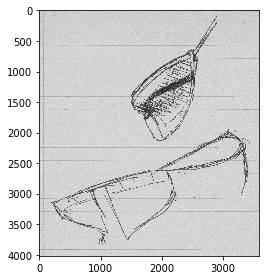

In [4]:
io.imshow(ruled0)

In [5]:
mean = np.mean(ruled0)
std = np.std(ruled0)
maxi = np.max(ruled0)
mini = np.min(ruled0)

In [6]:
standardized_ruled0 = (ruled0 - mini)/(maxi - mini)

In [7]:
standardized_ruled0

array([[0.796, 0.796, 0.812, ..., 0.8  , 0.8  , 0.792],
       [0.816, 0.8  , 0.812, ..., 0.82 , 0.824, 0.824],
       [0.88 , 0.848, 0.836, ..., 0.828, 0.824, 0.82 ],
       ...,
       [0.844, 0.86 , 0.872, ..., 0.84 , 0.848, 0.86 ],
       [0.832, 0.848, 0.856, ..., 0.836, 0.848, 0.86 ],
       [0.84 , 0.836, 0.832, ..., 0.804, 0.816, 0.812]])

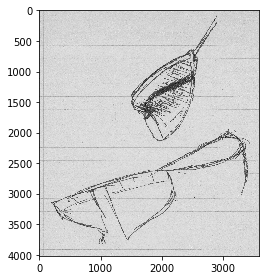

In [8]:
io.imshow(standardized_ruled0)

In [9]:
threshold = 0.75
binarized = 1.0 * (standardized_ruled0 > threshold)


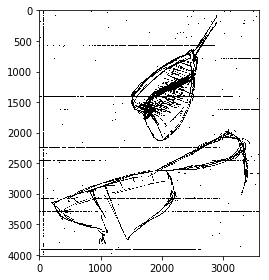

In [10]:
io.imshow(binarized)

In [11]:
result = np.ones((4017,3600))

In [12]:
result[:binarized.shape[0], :binarized.shape[1]] = binarized

In [13]:
result.shape

(4017, 3600)

In [14]:
mask = np.zeros((result.shape[0] * result.shape[1]))

In [15]:
mask.shape

(14461200,)

In [16]:
mask[1] = 1

In [17]:
mask.reshape((result.shape[0], result.shape[1]))

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [18]:
zoom = result[1500:2500, 1500:2500]

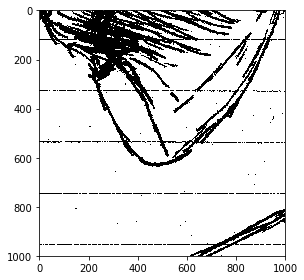

In [19]:
io.imshow(zoom, cmap='gray')

0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6


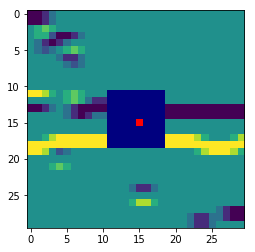

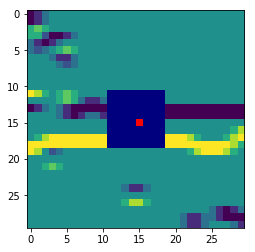

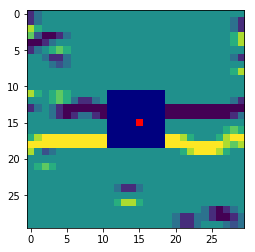

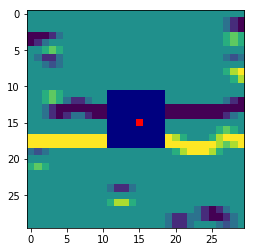

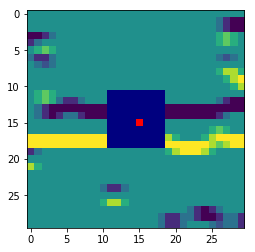

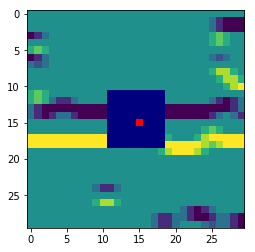

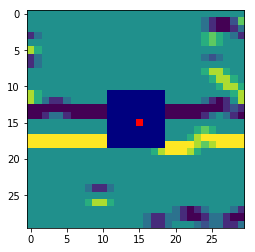

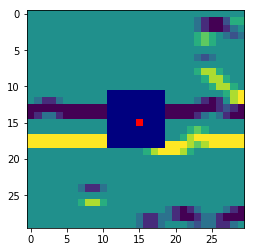

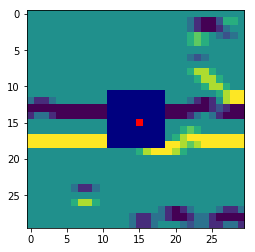

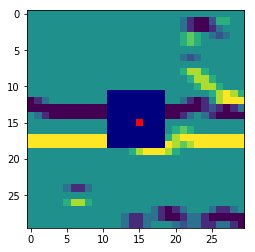

In [20]:

for i in range(10):
    size = 30
    row_index = 103
    col_index = 110 + i
    window = zoom[row_index:row_index+size, col_index:col_index+size]
    window_sobel = ndimage.sobel(window, axis=0)
    window_sobel


    masked_pixel = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel[15,15] = 1
    masked_pixel = np.ma.masked_where(masked_pixel != 1, masked_pixel)

    masked_pixel1 = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel1[11:19, 11:19] = 1
    masked_pixel1 = np.ma.masked_where(masked_pixel1 != 1, masked_pixel1)


    fig, ax = plt.subplots(1, 1)

    ax.imshow(window_sobel)
    ax.imshow(masked_pixel1, cmap='jet')
    ax.imshow(masked_pixel, cmap='prism')

    print(np.mean(window_sobel[10:20, 11:19]))
    print(np.mean(window_sobel[10:15, 11:19]))
    print(np.mean(window_sobel[15:20, 11:19]))




In [ ]:
!pip install opencv-python

In [106]:
import cv2
img = cv2.imread(ruled[0], cv2.IMREAD_COLOR)[1500:2500, 1500:2500]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 50, 200)
minLineLength = 100
maxLineGap = 10
lines = cv2.HoughLinesP(edges,1,np.pi/180,100,minLineLength,maxLineGap)
for x1,y1,x2,y2 in lines[0]:
    cv2.line(img,(x1,y1),(x2,y2),(0,255,0),2)
cv2.imwrite('houghlines5.jpg',img)

True

-1.525
1.525
0.0


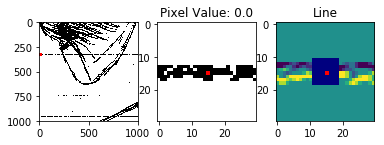

In [31]:
size = 30
row_index = 313
col_index = 1
masked_window = np.random.random((zoom.shape[0],zoom.shape[1]))
masked_window[row_index:row_index+size, col_index:col_index+size] = 1
masked_window = np.ma.masked_where(masked_window != 1, masked_window)

masked_pixel = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
masked_pixel[15,15] = 1
masked_pixel = np.ma.masked_where(masked_pixel != 1, masked_pixel)

masked_pixel1 = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
masked_pixel1[11:19, 11:19] = 1
masked_pixel1 = np.ma.masked_where(masked_pixel1 != 1, masked_pixel1)

window = zoom[row_index:row_index+size, col_index:col_index+size]
pixel_value = window[15, 15]
window_sobel = ndimage.sobel(window, axis=0)
above_area = np.mean(window_sobel[10:15, 11:19])
below_area = np.mean(window_sobel[15:20, 11:19])
sobel_value = window_sobel[15, 15]
# Overlay the two images
fig, ax = plt.subplots(1, 3)
ax.ravel()
ax[0].imshow(zoom, cmap='gray')
ax[0].imshow(masked_window, cmap='prism', interpolation='none')
# ax[0].imshow(masked_pixel, cmap=cm.jet, interpolation='none')
ax[1].imshow(window, cmap='gray')
ax[1].imshow(masked_pixel, cmap='prism', interpolation='none')
ax[1].set_title('Pixel Value: {}'.format(pixel_value))
ax[2].imshow(window_sobel)
ax[2].imshow(masked_pixel1, cmap='jet')
ax[2].imshow(masked_pixel, cmap='prism', interpolation='none')
if pixel_value == 0.0:
        print(above_area)
        print(below_area)
        print(above_area - -below_area)
        if np.abs(above_area) >= 0.8 and np.abs(below_area) >= 0.8:
            if above_area - -below_area < 0.4:
                ax[2].set_title('Line')
        else:
            ax[2].set_title('Drawing')

True

-1.6
1.6
0.0


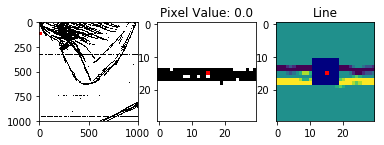

0
-1.6
1.6
0.0


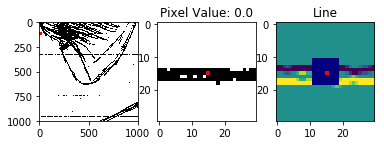

1
-1.6
1.6
0.0


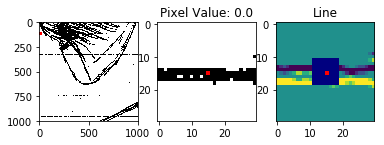

2
-1.6
1.6
0.0


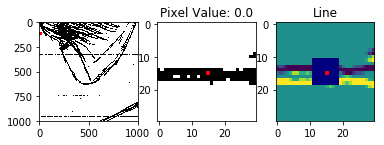

3
-1.575
1.575
0.0


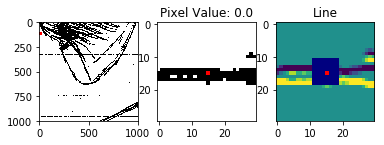

4
-1.5
1.5
0.0


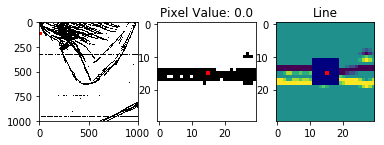

5
-1.4
1.4
0.0


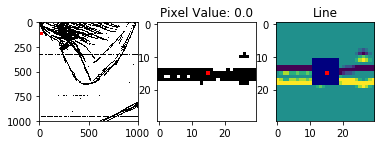

6
-1.3
1.3
0.0


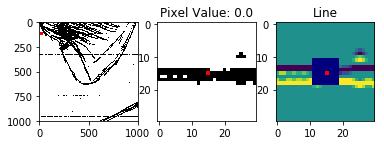

7
-1.225
1.225
0.0


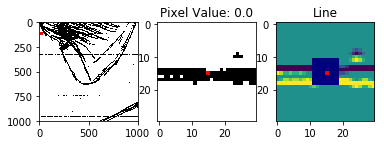

8
-1.175
1.175
0.0


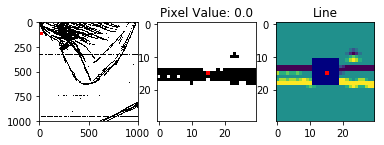

9
-1.125
1.125
0.0


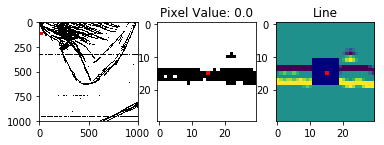

10
-1.1
1.1
0.0


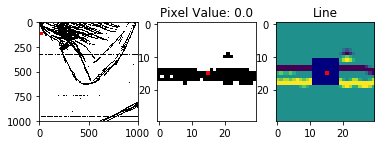

11
-1.1
1.125
0.02499999999999991


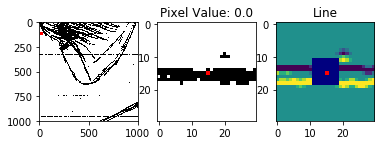

12
-1.075
1.2
0.125


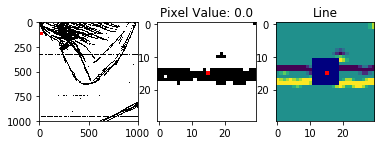

13
-1.025
1.3
0.27500000000000013


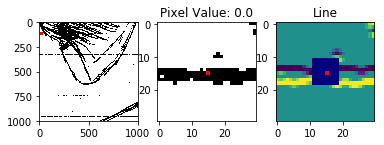

14
-1.025
1.4
0.375


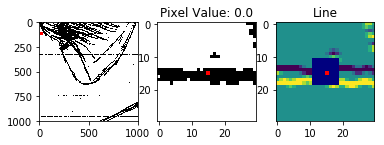

15
-1.075
1.475
0.40000000000000013


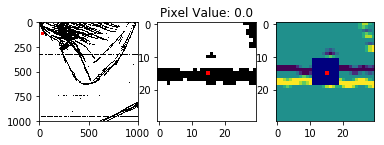

16
-1.125
1.525
0.3999999999999999


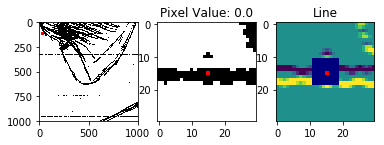

17
-1.175
1.575
0.3999999999999999


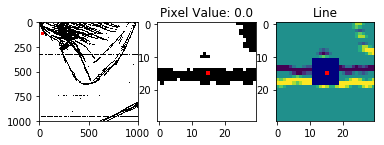

18
-1.2
1.6
0.40000000000000013


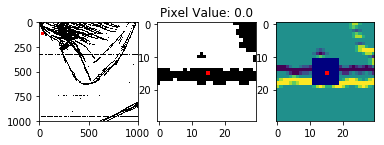

19
-1.2
1.575
0.375


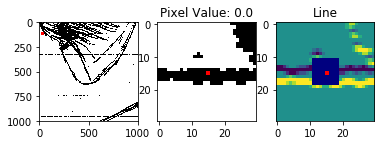

20
-1.225
1.5
0.2749999999999999


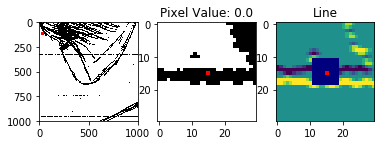

21
-1.3
1.425
0.125


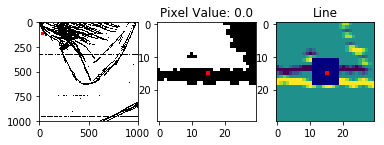

22
-1.375
1.4
0.02499999999999991


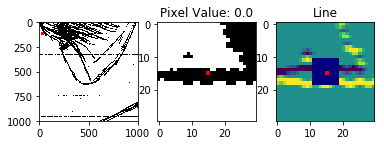

23
-1.4
1.4
0.0


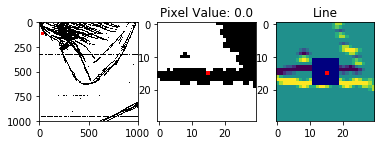

24
-1.375
1.375
0.0


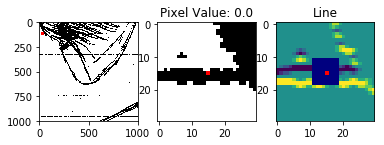

25
-1.325
1.325
0.0


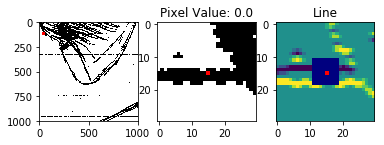

26
-1.3
1.3
0.0


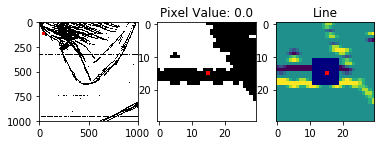

27
-1.325
1.325
0.0


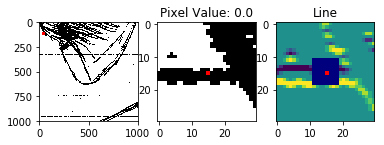

28
-1.35
1.375
0.02499999999999991


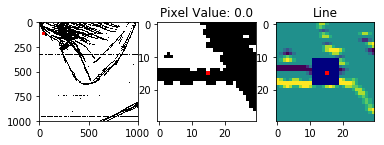

29
-1.275
1.4
0.125


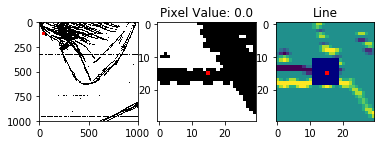

30
-1.1
1.4
0.2999999999999998


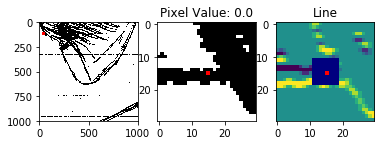

31
-0.9
1.4
0.4999999999999999


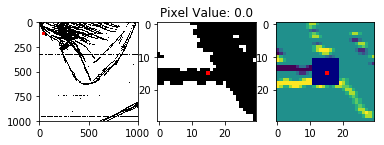

32
-0.725
1.425
0.7000000000000001


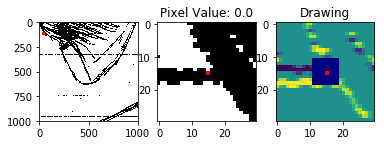

33
-0.575
1.45
0.875


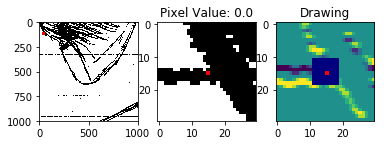

34
-0.4
1.375
0.975


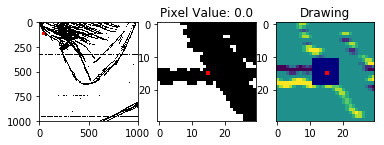

35
-0.2
1.2
1.0


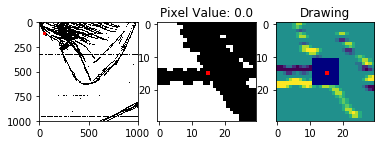

36
-0.05
1.025
0.9749999999999999


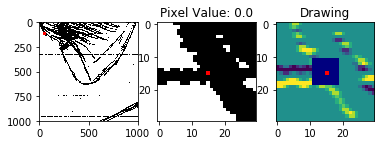

37
0.0
0.875
0.875


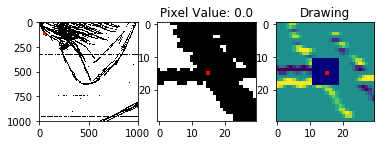

38
0.0
0.7
0.7


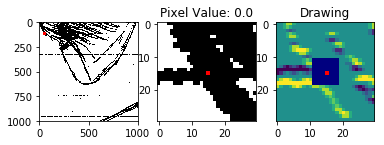

39
0.0
0.5
0.5


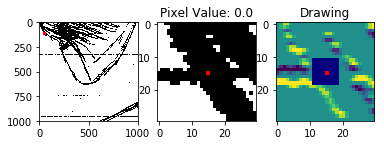

40
0.0
0.3
0.3


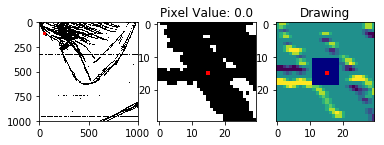

41
0.0
0.125
0.125


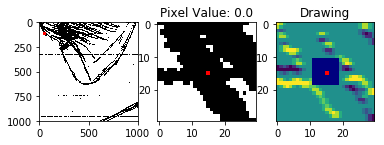

42
0.0
0.025
0.025


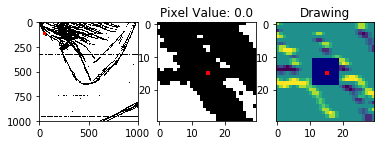

43
0.0
0.0
0.0


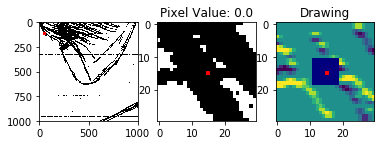

44
0.0
0.025
0.025


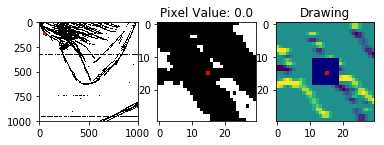

45
0.0
0.1
0.1


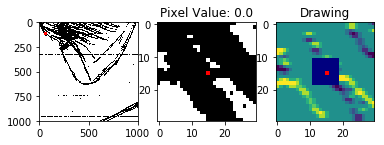

46
0.0
0.225
0.225


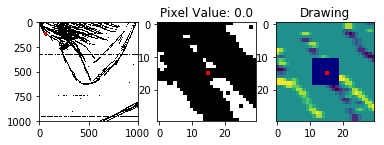

47
0.0
0.4
0.4


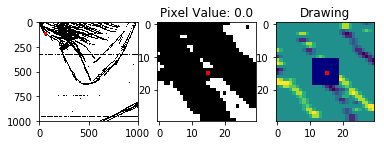

48
0.0
0.6
0.6


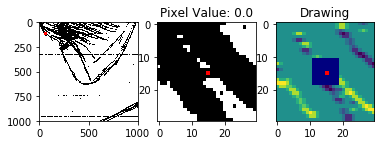

49
0.0
0.8
0.8


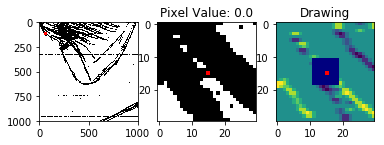

50
0.0
0.95
0.95


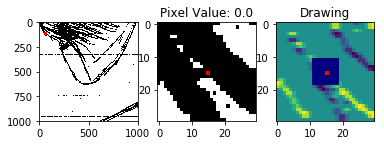

51
0.0
1.0
1.0


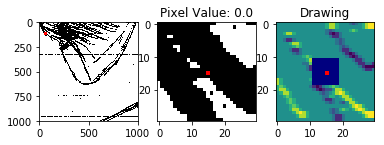

52
0.0
0.975
0.975


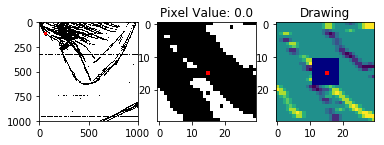

53
0.0
0.9
0.9


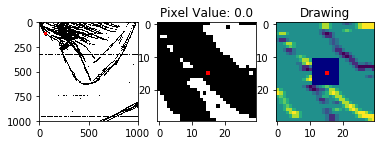

54
-0.025
0.775
0.75


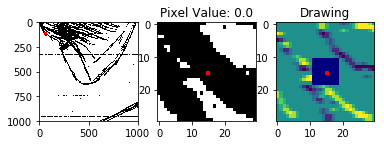

55
-0.1
0.6
0.5


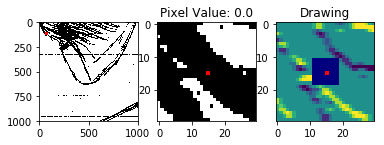

56
-0.225
0.4
0.17500000000000002


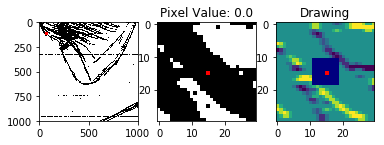

57
-0.4
0.2
-0.2


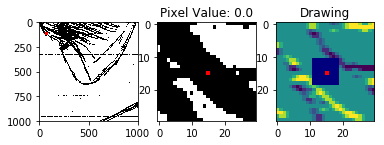

58
-0.6
0.05
-0.5499999999999999


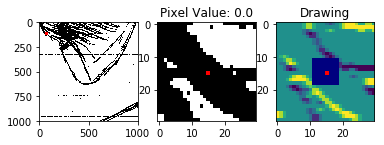

59
-0.8
0.0
-0.8


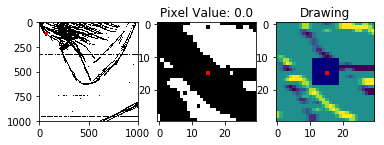

60
-1.0
0.0
-1.0


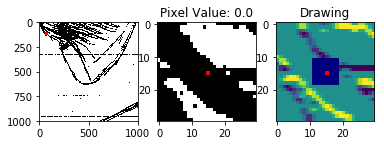

61
-1.2
0.0
-1.2


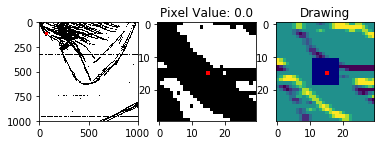

62
-1.35
-0.025
-1.375


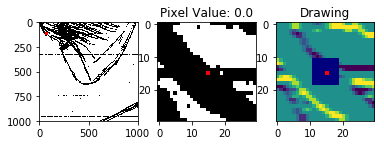

63
-1.425
-0.075
-1.5


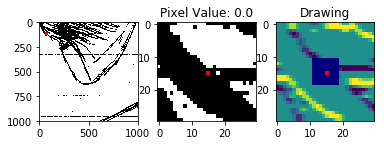

64
-1.475
-0.1
-1.5750000000000002


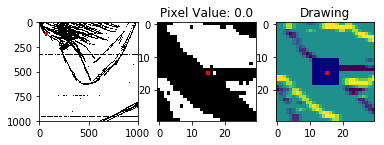

65
-1.5
-0.1
-1.6


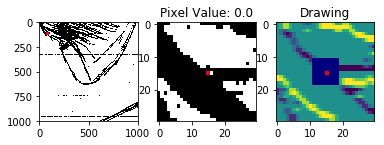

66


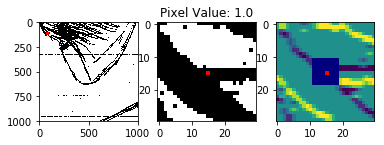

67
-1.5
0.025
-1.475


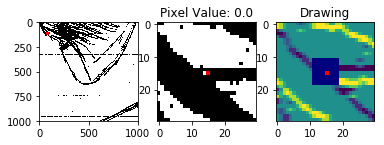

68
-1.5
0.2
-1.3


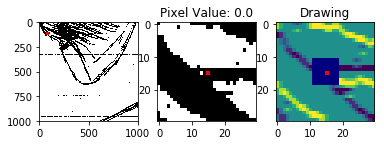

69
-1.5
0.4
-1.1


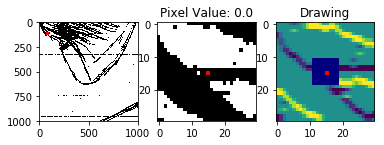

70
-1.525
0.625
-0.8999999999999999


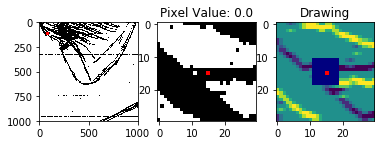

71
-1.575
0.875
-0.7


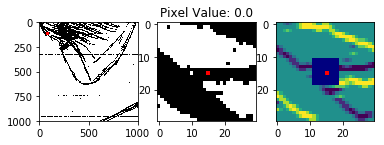

72
-1.6
1.1
-0.5


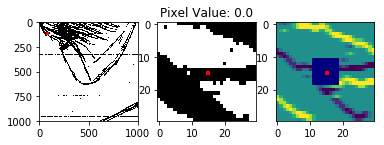

73
-1.6
1.3
-0.30000000000000004


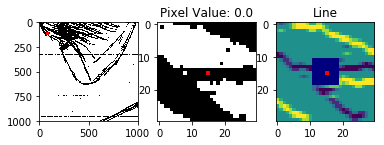

74
-1.6
1.475
-0.125


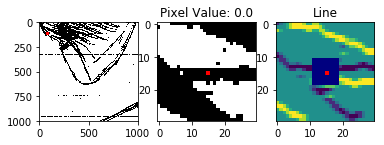

75
-1.6
1.575
-0.025000000000000133


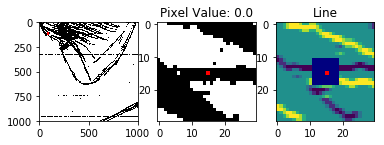

76
-1.6
1.6
0.0


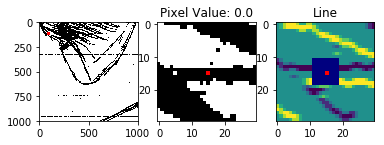

77
-1.6
1.6
0.0


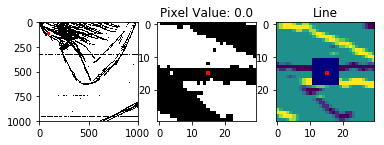

78
-1.6
1.6
0.0


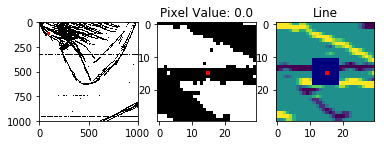

79
-1.6
1.6
0.0


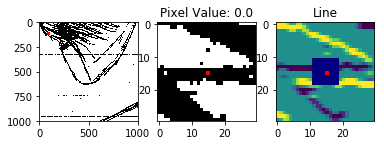

80
-1.6
1.6
0.0


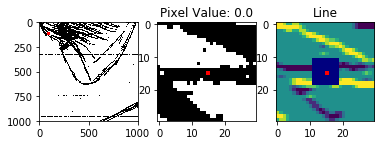

81
-1.6
1.6
0.0


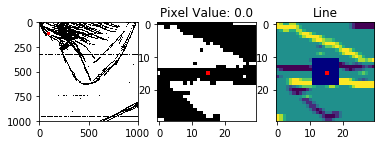

82
-1.6
1.6
0.0


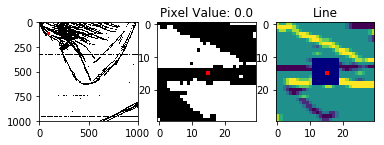

83
-1.6
1.6
0.0


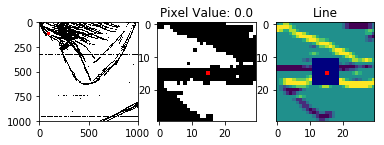

84
-1.6
1.6
0.0


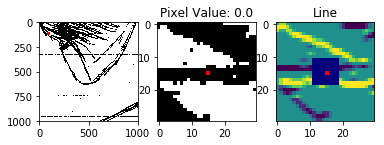

85
-1.575
1.6
0.025000000000000133


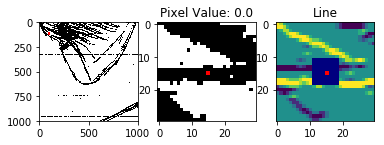

86
-1.5
1.6
0.10000000000000009


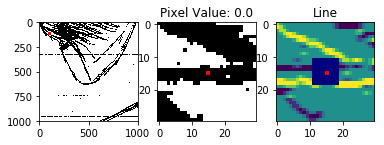

87
-1.375
1.6
0.2250000000000001


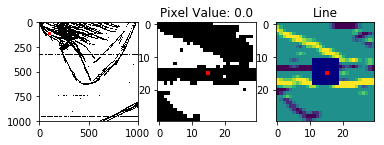

88
-1.2
1.6
0.40000000000000013


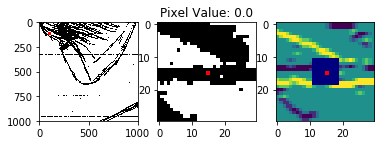

89
-1.0
1.6
0.6000000000000001


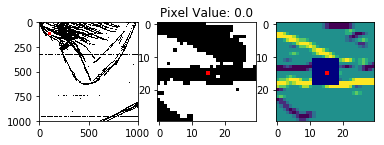

90
-0.8
1.6
0.8


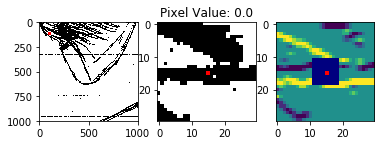

91
-0.6
1.6
1.0


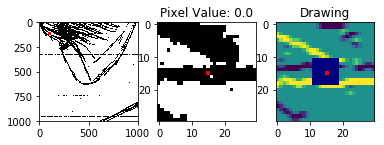

92
-0.4
1.6
1.2000000000000002


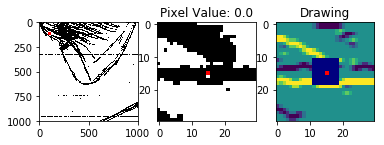

93
-0.225
1.6
1.375


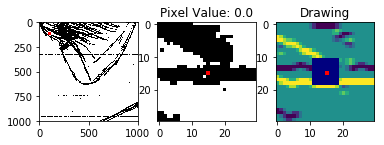

94
-0.1
1.575
1.4749999999999999


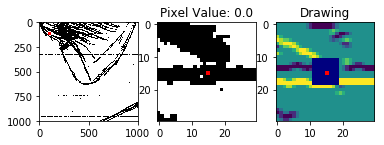

95
-0.025
1.525
1.5


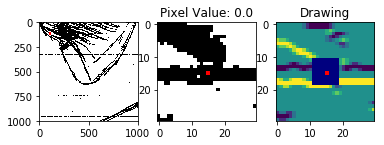

96
0.0
1.5
1.5


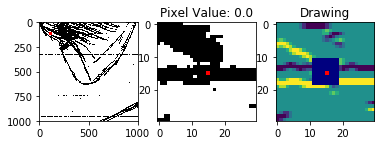

97
-0.05
1.5
1.45


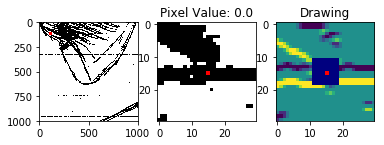

98
-0.2
1.5
1.3


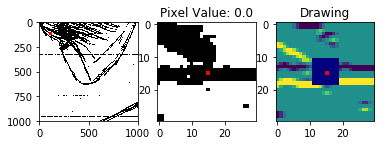

99
-0.4
1.5
1.1


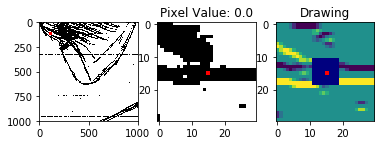

100
-0.6
1.5
0.9


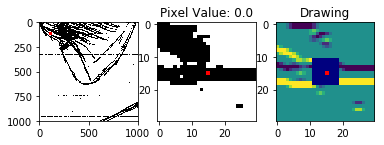

101
-0.8
1.5
0.7


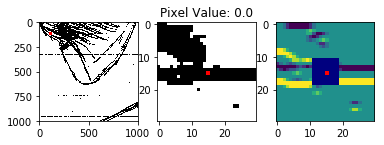

102
-1.0
1.525
0.5249999999999999


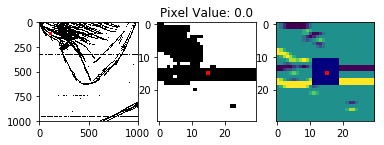

103
-1.2
1.575
0.375


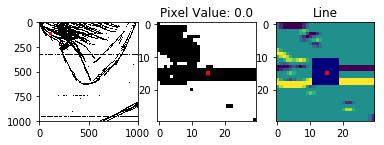

104
-1.4
1.6
0.20000000000000018


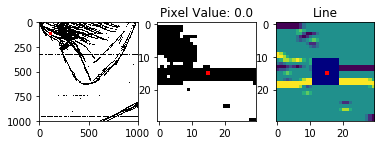

105
-1.55
1.6
0.050000000000000044


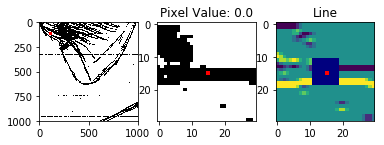

106
-1.6
1.6
0.0


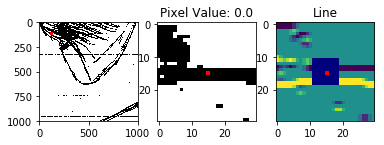

107
-1.6
1.6
0.0


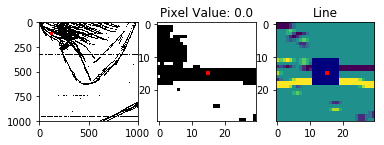

108
-1.6
1.6
0.0


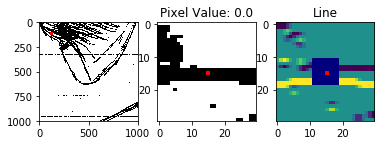

109
-1.6
1.6
0.0


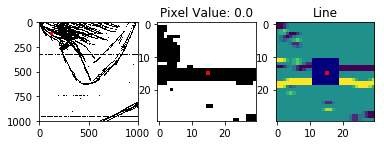

110
-1.6
1.6
0.0


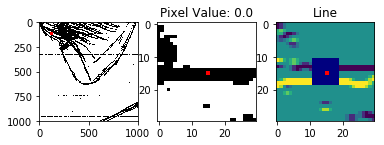

111
-1.6
1.6
0.0


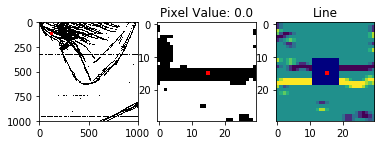

112
-1.6
1.6
0.0


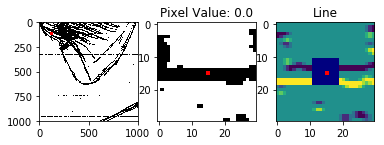

113
-1.6
1.6
0.0


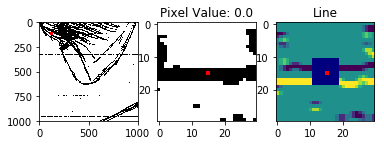

114
-1.6
1.6
0.0


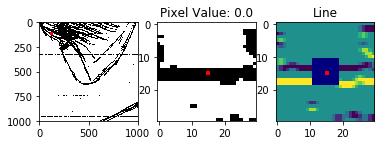

115
-1.6
1.6
0.0


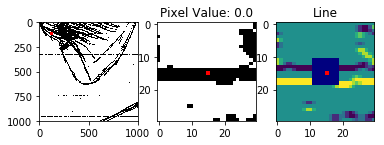

116
-1.6
1.6
0.0


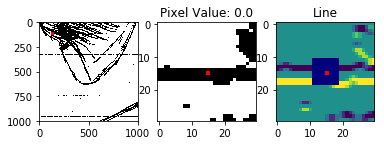

117
-1.6
1.6
0.0


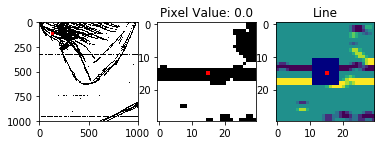

118
-1.6
1.6
0.0


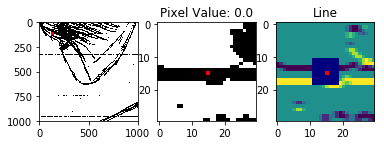

119
-1.6
1.6
0.0


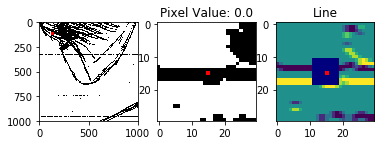

120
-1.6
1.6
0.0


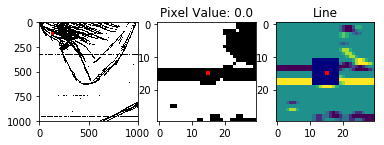

121
-1.6
1.6
0.0


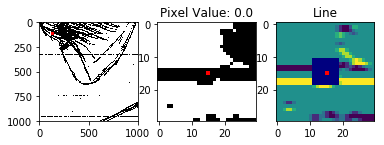

122
-1.6
1.6
0.0


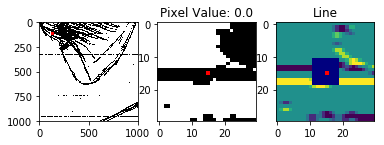

123
-1.575
1.6
0.025000000000000133


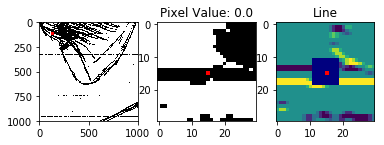

124
-1.475
1.6
0.125


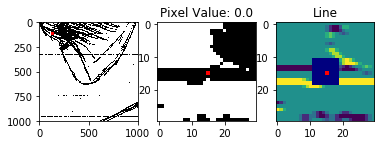

125
-1.3
1.6
0.30000000000000004


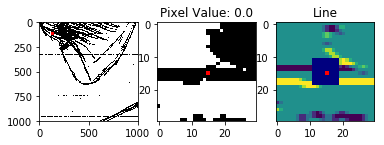

126
-1.1
1.6
0.5


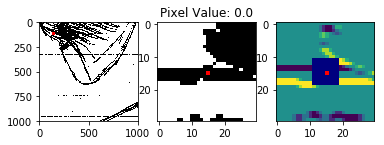

127
-0.9
1.6
0.7000000000000001


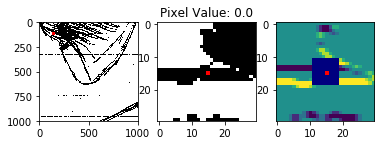

128
-0.7
1.6
0.9000000000000001


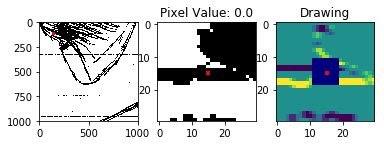

129
-0.5
1.6
1.1


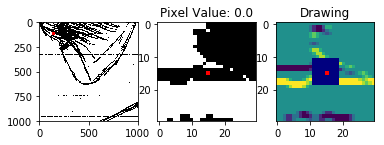

130
-0.3
1.6
1.3


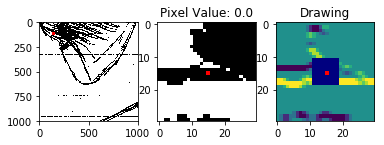

131
-0.125
1.6
1.475


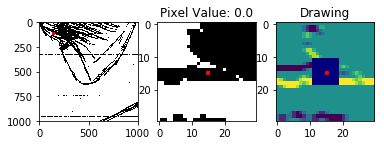

132
0.0
1.575
1.575


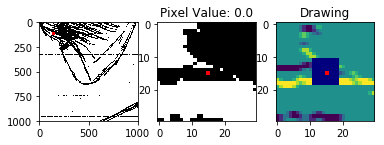

133
0.075
1.525
1.5999999999999999


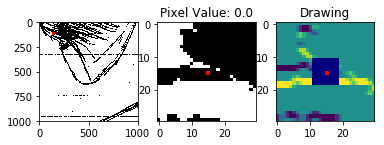

134
0.1
1.5
1.6


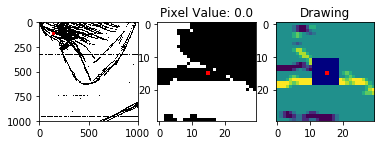

135
0.1
1.5
1.6


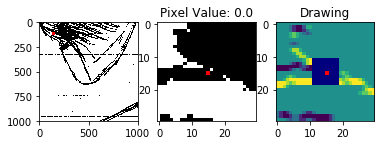

136
0.1
1.5
1.6


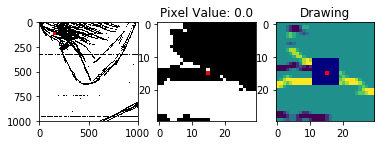

137
0.1
1.5
1.6


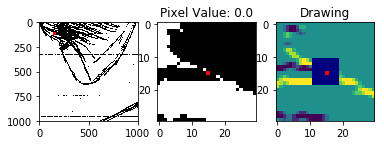

138
0.1
1.5
1.6


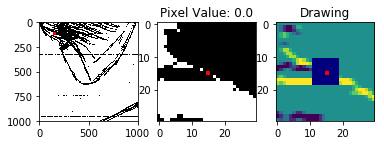

139
0.1
1.5
1.6


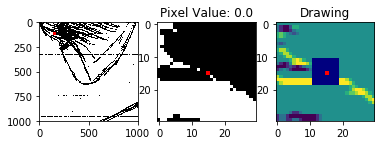

140
0.075
1.525
1.5999999999999999


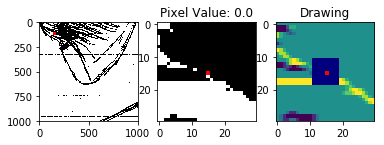

141
0.025
1.575
1.5999999999999999


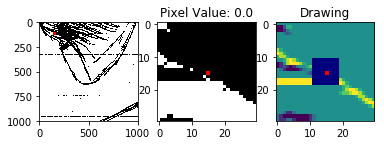

142
0.0
1.575
1.575


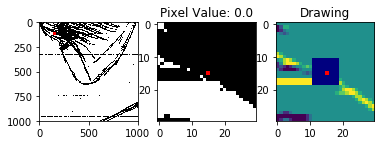

143
0.0
1.5
1.5


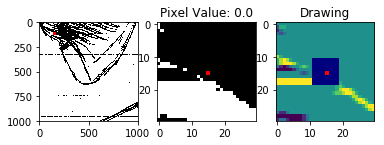

144
0.0
1.375
1.375


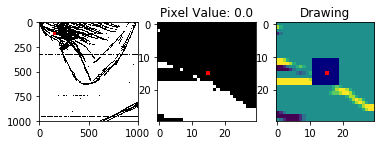

145
0.0
1.2
1.2


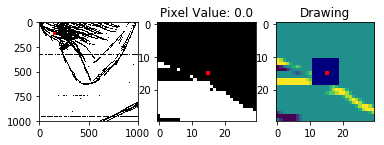

146
0.0
1.0
1.0


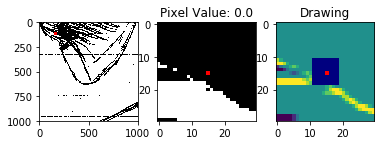

147
0.0
0.8
0.8


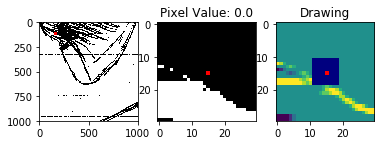

148
0.0
0.6
0.6


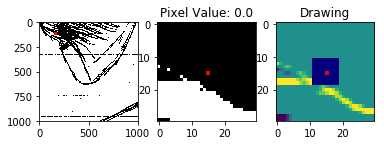

149
0.0
0.4
0.4


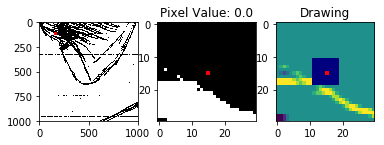

150
0.0
0.225
0.225


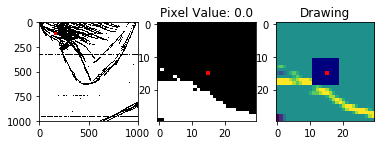

151
0.0
0.1
0.1


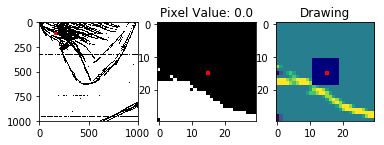

152
0.0
0.025
0.025


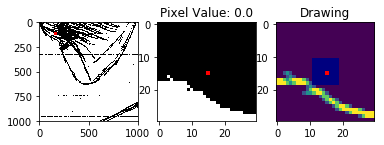

153
0.0
0.0
0.0


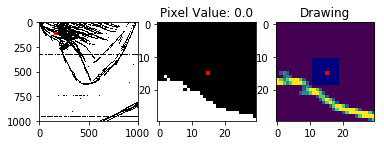

154
0.0
0.0
0.0


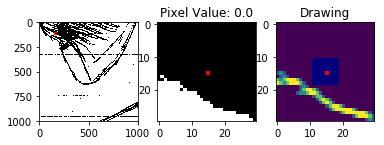

155
0.0
0.0
0.0


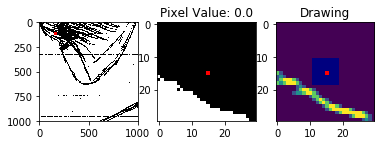

156
0.0
0.0
0.0


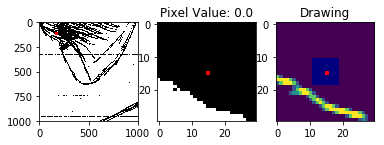

157
0.0
0.0
0.0


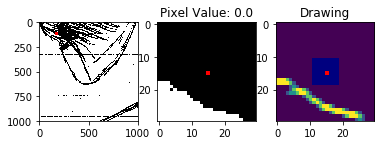

158
0.0
0.0
0.0


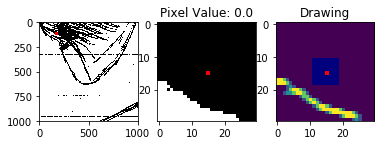

159
0.0
0.0
0.0


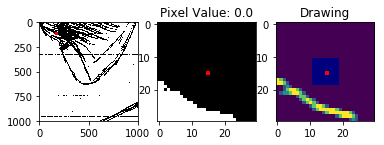

160
0.0
0.0
0.0


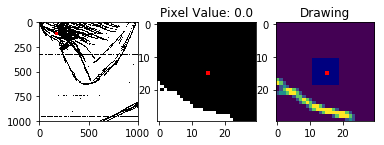

161
0.0
0.0
0.0


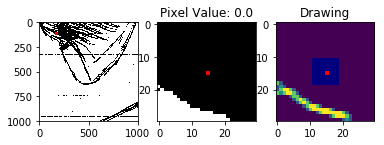

162
0.0
0.0
0.0


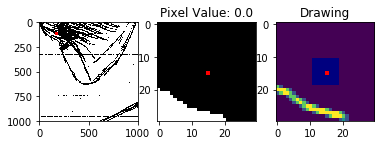

163
0.0
0.0
0.0


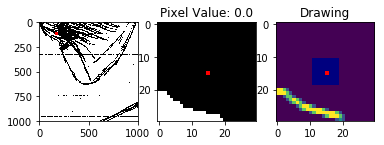

164
0.0
0.0
0.0


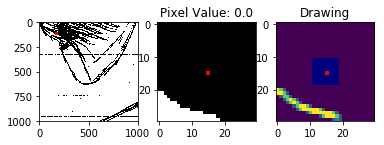

165
0.0
0.0
0.0


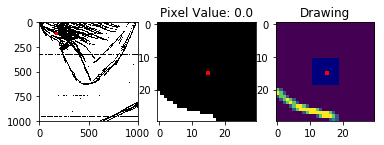

166
0.0
0.0
0.0


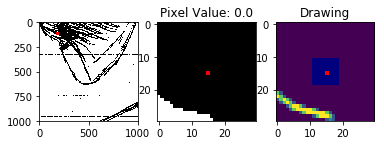

167
0.0
0.0
0.0


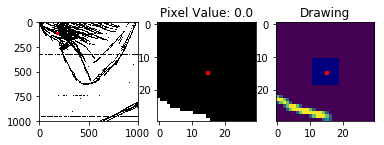

168
0.0
0.0
0.0


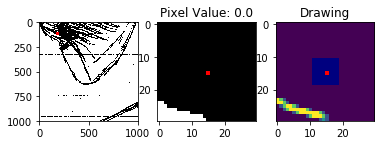

169
0.0
0.0
0.0


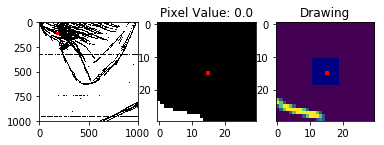

170
0.0
0.0
0.0


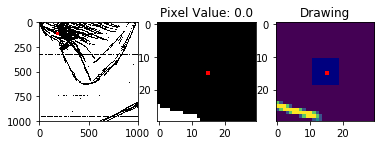

171
0.0
0.0
0.0


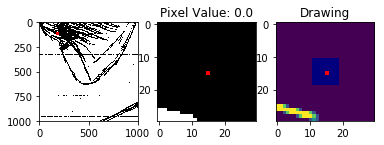

172
0.0
0.0
0.0


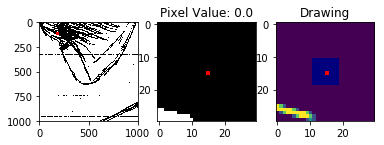

173
0.0
0.0
0.0


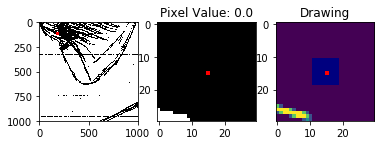

174
0.0
0.0
0.0


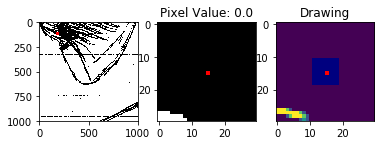

175
0.0
0.0
0.0


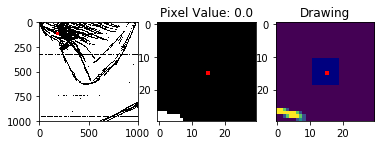

176
0.0
0.0
0.0


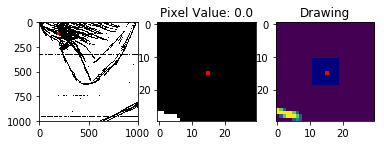

177
0.0
0.0
0.0


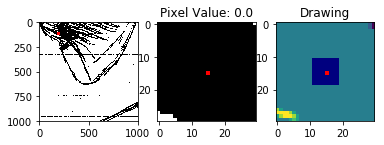

178
0.0
0.0
0.0


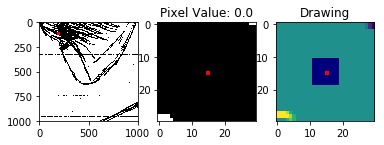

179
0.0
0.0
0.0


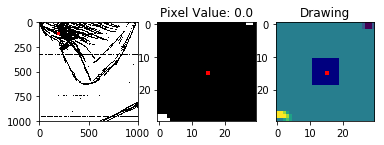

180
0.0
0.0
0.0


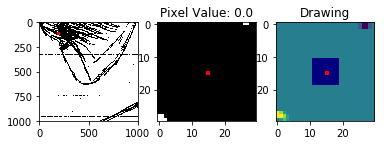

181
0.0
0.0
0.0


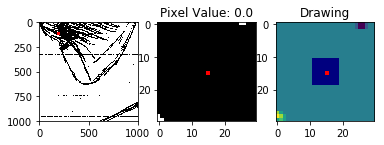

182
0.0
0.0
0.0


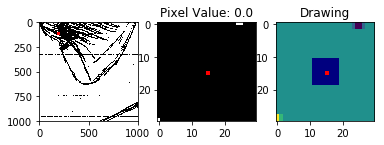

183
0.0
0.0
0.0


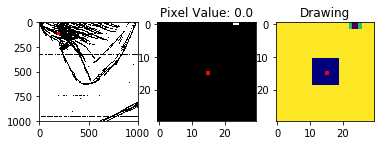

184
0.0
0.0
0.0


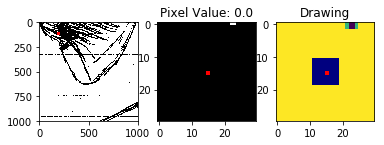

185
0.0
0.0
0.0


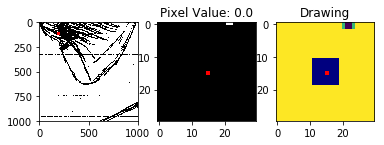

186
0.0
0.0
0.0


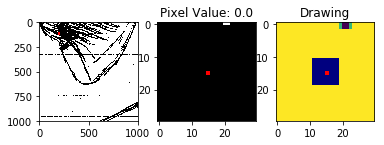

187
0.0
0.0
0.0


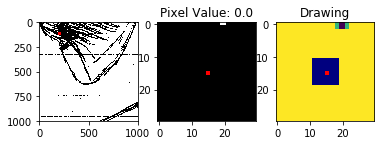

188
0.0
0.0
0.0


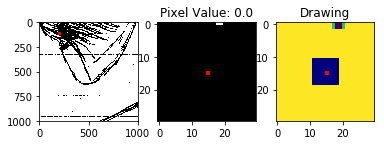

189
0.0
0.0
0.0


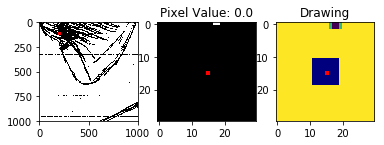

190
0.0
0.0
0.0


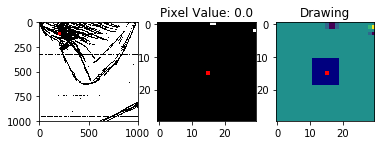

191
0.0
0.0
0.0


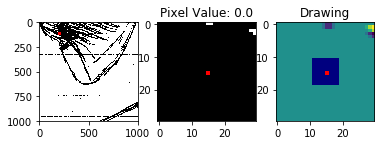

192
0.0
0.0
0.0


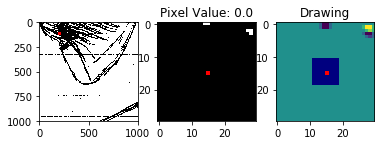

193
0.0
0.0
0.0


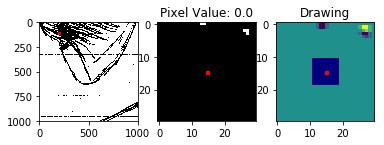

194
0.0
0.0
0.0


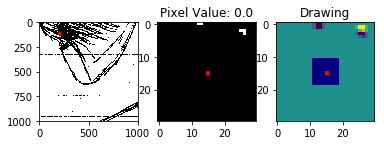

195
0.0
0.0
0.0


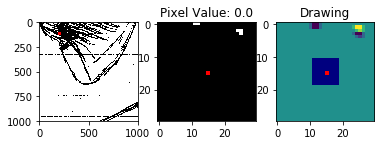

196
0.0
0.0
0.0


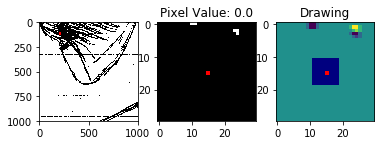

197
0.0
0.0
0.0


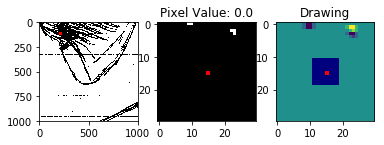

198
0.0
0.0
0.0


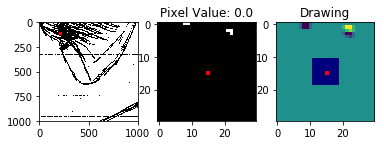

199
0.0
0.0
0.0


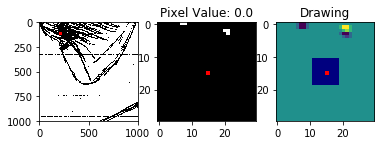

200
0.0
0.0
0.0


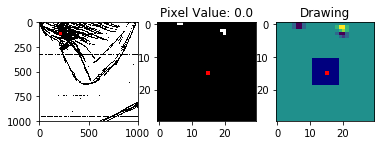

201
0.0
0.0
0.0


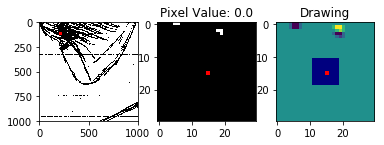

202
0.0
0.0
0.0


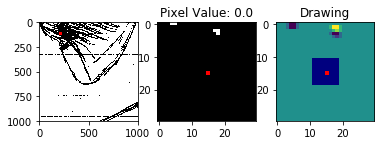

203
0.0
0.0
0.0


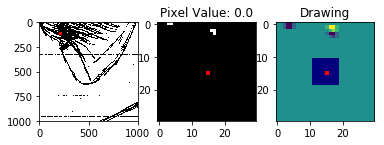

204
0.0
0.0
0.0


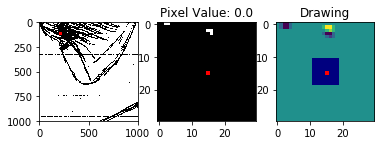

205
0.0
0.0
0.0


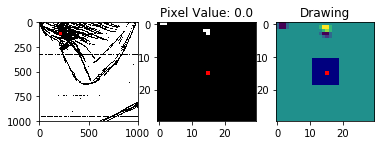

206
0.0
0.0
0.0


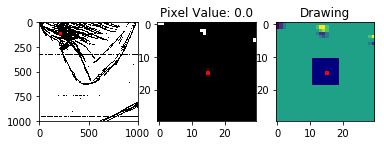

207
0.0
0.0
0.0


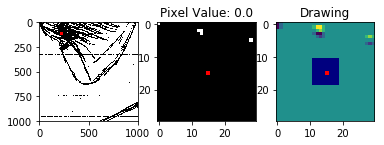

208
0.0
0.0
0.0


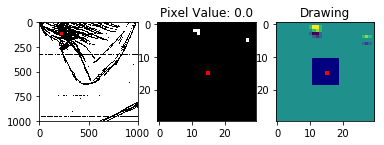

209
0.0
0.0
0.0


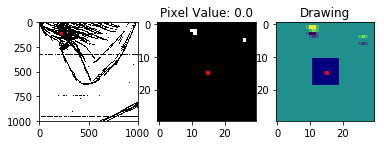

210
0.0
0.0
0.0


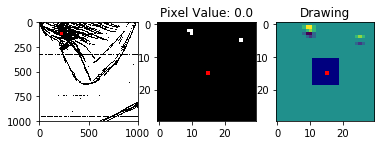

211
0.0
0.0
0.0


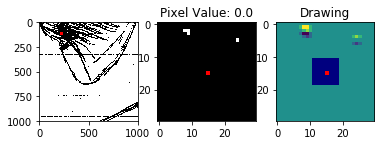

212
0.0
0.0
0.0


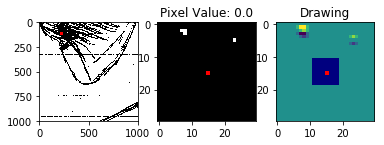

213
0.0
0.0
0.0


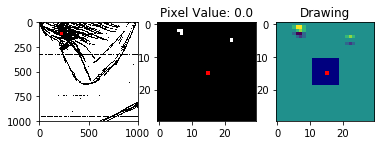

214
0.0
0.0
0.0


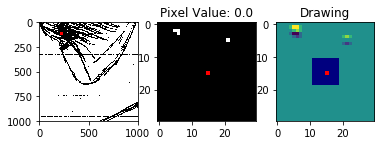

215
0.0
0.0
0.0


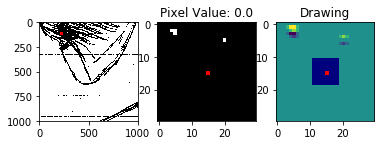

216
0.0
0.0
0.0


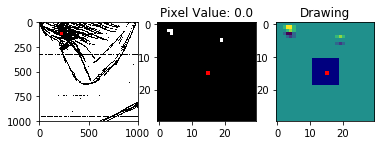

217
0.0
0.0
0.0


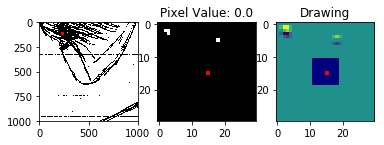

218
0.0
0.0
0.0


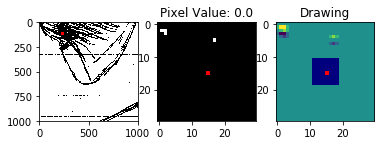

219
0.0
0.0
0.0


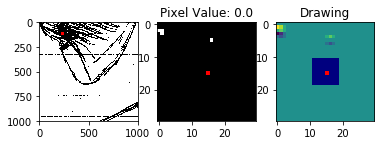

220
0.0
0.0
0.0


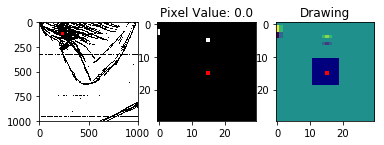

221
0.0
0.0
0.0


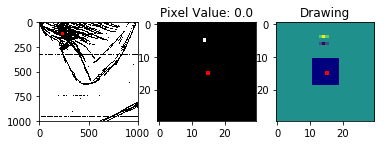

222
0.0
0.0
0.0


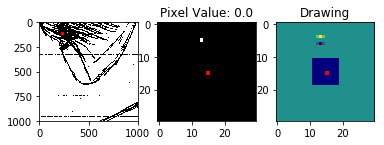

223
0.0
0.0
0.0


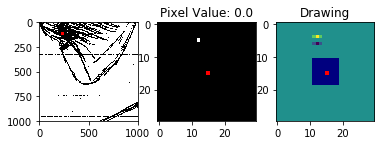

224
0.0
0.0
0.0


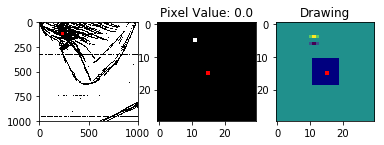

225
0.0
0.0
0.0


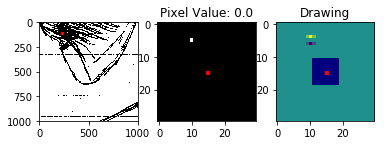

226
0.0
0.0
0.0


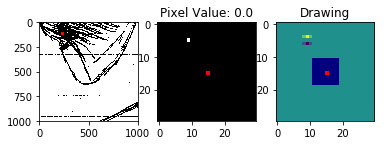

227
0.0
0.0
0.0


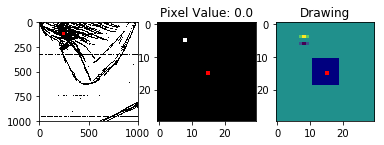

228
0.0
0.0
0.0


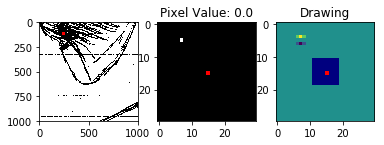

229
0.0
0.0
0.0


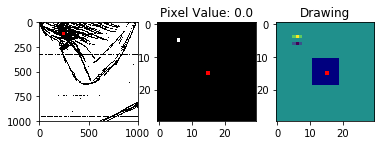

230
0.0
0.0
0.0


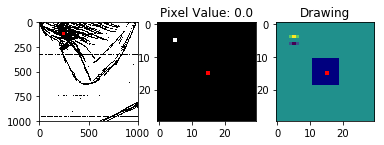

231
0.0
0.0
0.0


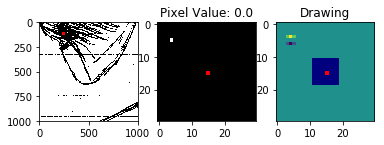

232
0.0
0.0
0.0


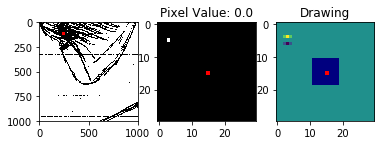

233
0.0
0.0
0.0


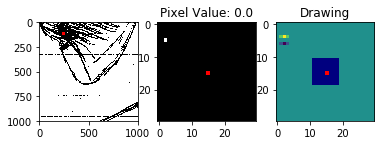

234
0.0
0.0
0.0


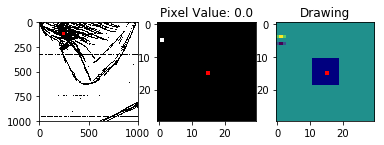

235
0.0
0.0
0.0


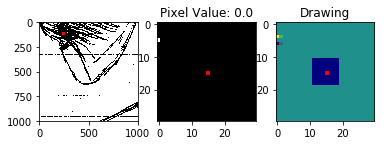

236
0.0
0.0
0.0


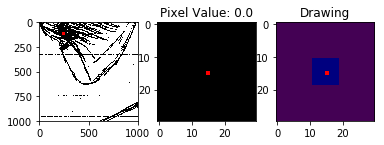

237
0.0
0.0
0.0


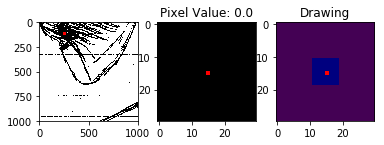

238
0.0
0.0
0.0


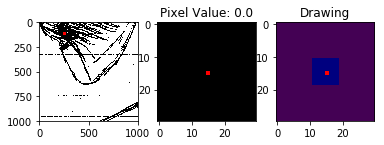

239
0.0
0.0
0.0


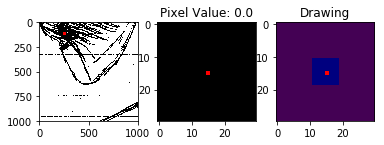

240
0.0
0.0
0.0


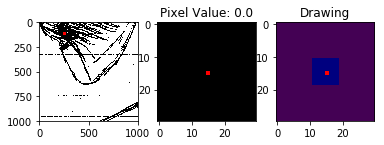

241
0.0
0.0
0.0


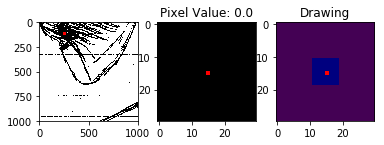

242
0.0
0.0
0.0


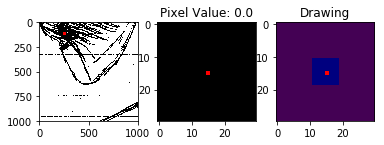

243
0.0
0.0
0.0


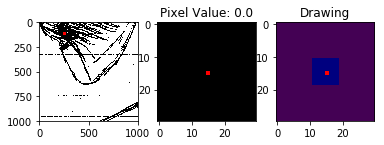

244
0.0
0.0
0.0


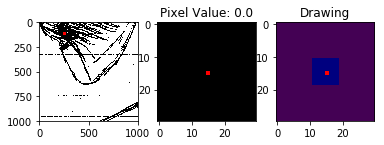

245
0.0
0.0
0.0


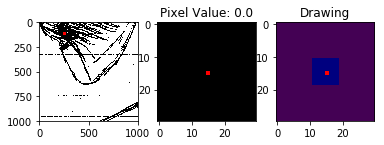

246
0.0
0.0
0.0


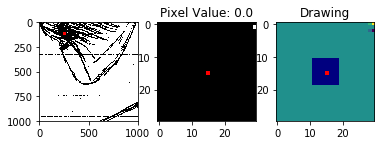

247
0.0
0.0
0.0


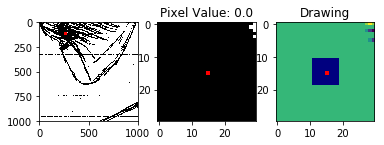

248
0.0
0.0
0.0


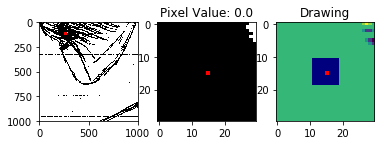

249
0.0
0.0
0.0


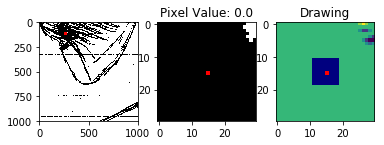

250
0.0
0.0
0.0


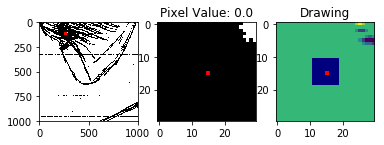

251
0.0
0.0
0.0


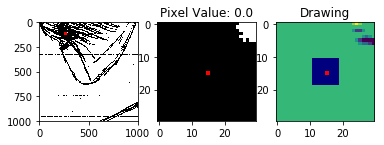

252
0.0
0.0
0.0


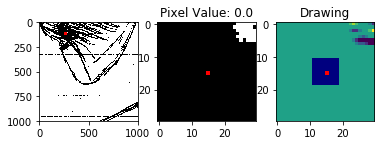

253
0.0
0.0
0.0


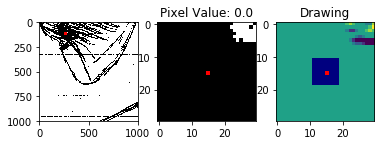

254
0.0
0.0
0.0


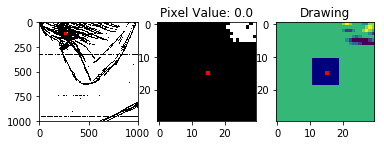

255
0.0
0.0
0.0


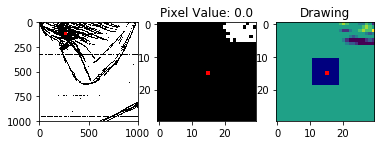

256
0.0
0.0
0.0


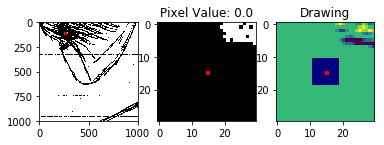

257
0.0
0.0
0.0


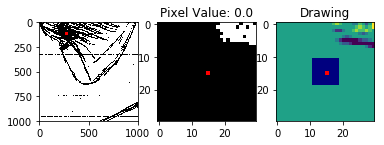

258
0.0
0.0
0.0


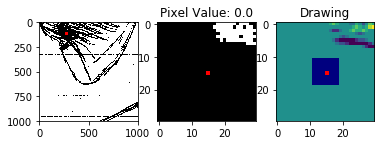

259
0.0
0.0
0.0


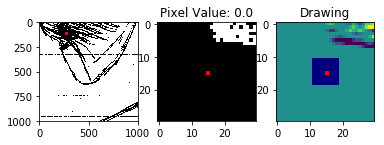

260
0.0
0.0
0.0


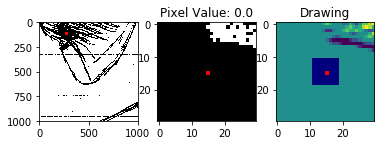

261
0.0
0.0
0.0


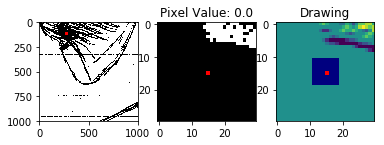

262
0.0
0.0
0.0


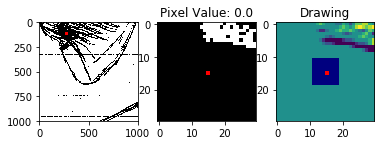

263
0.0
0.0
0.0


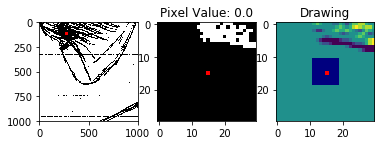

264
0.0
0.0
0.0


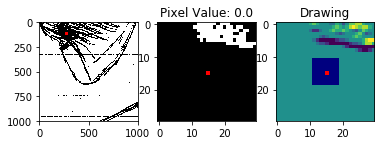

265
0.0
0.0
0.0


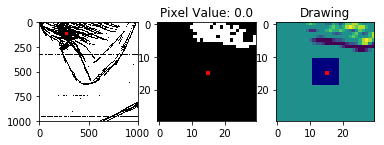

266
0.0
0.0
0.0


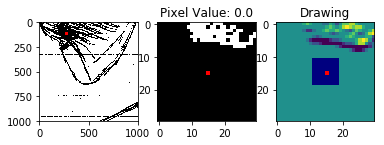

267
0.0
0.0
0.0


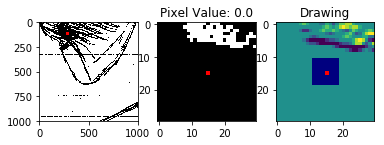

268
0.0
0.0
0.0


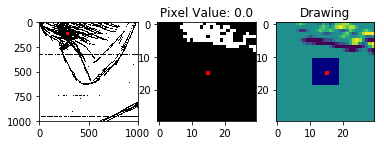

269
0.0
0.0
0.0


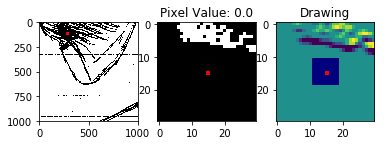

270
0.0
0.0
0.0


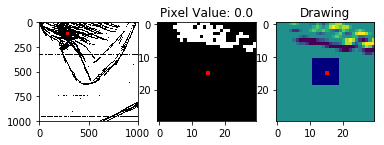

271
0.0
0.0
0.0


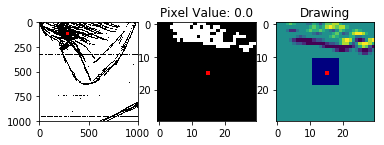

272
0.0
0.0
0.0


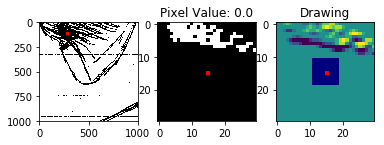

273
0.0
0.0
0.0


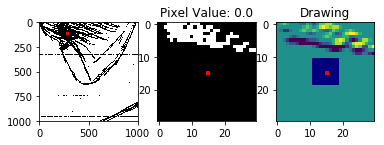

274
0.0
0.0
0.0


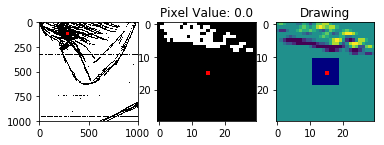

275
0.0
0.0
0.0


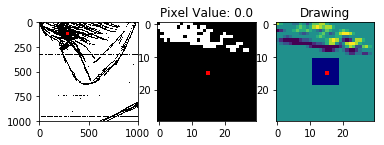

276
0.0
0.0
0.0


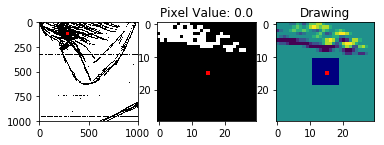

277
0.0
0.0
0.0


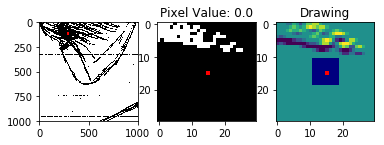

278
0.0
0.0
0.0


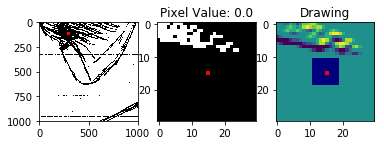

279
0.0
0.0
0.0


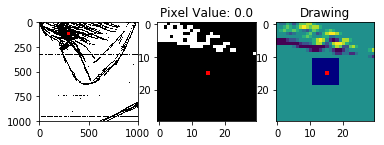

280
0.0
0.0
0.0


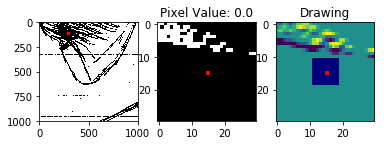

281
0.0
0.0
0.0


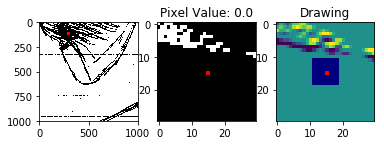

282
0.0
0.0
0.0


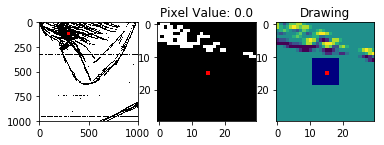

283
0.0
0.0
0.0


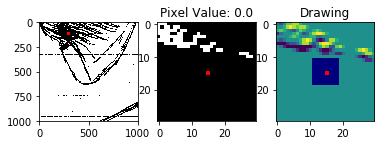

284
0.0
0.0
0.0


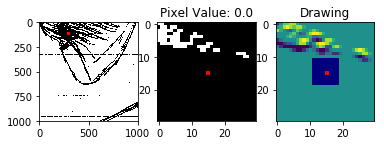

285
0.0
0.0
0.0


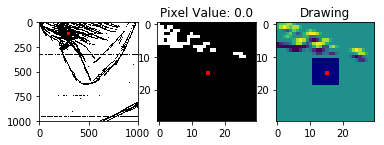

286
0.0
0.0
0.0


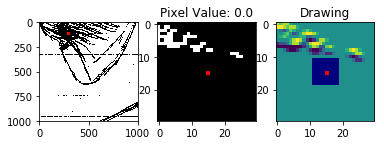

287
0.0
0.0
0.0


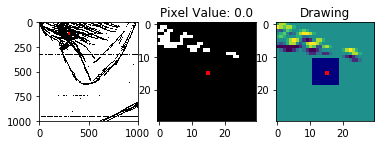

288
0.0
0.0
0.0


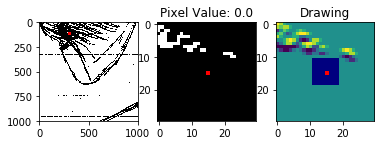

289
-0.025
0.0
-0.025


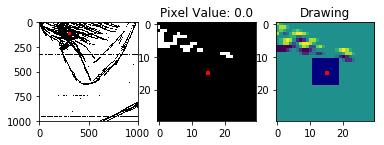

290
-0.1
0.0
-0.1


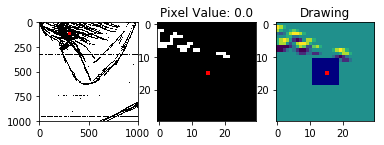

291
-0.225
0.0
-0.225


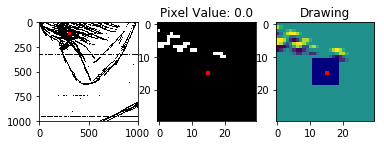

292
-0.375
0.0
-0.375


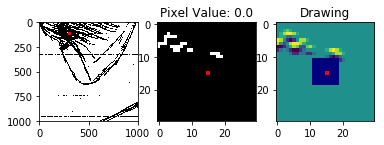

293
-0.475
0.0
-0.475


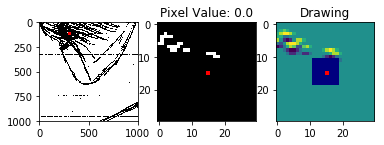

294
-0.5
0.0
-0.5


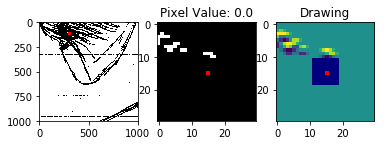

295
-0.5
0.0
-0.5


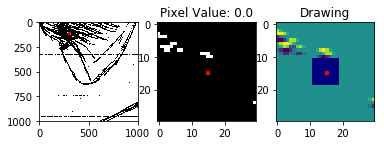

296
-0.5
0.0
-0.5


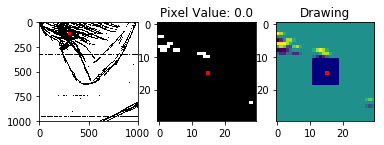

297
-0.475
0.0
-0.475


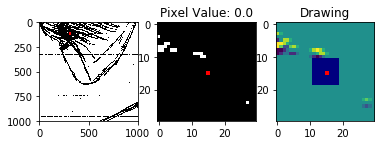

298
-0.4
0.0
-0.4


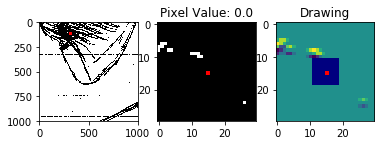

299
-0.275
0.0
-0.275


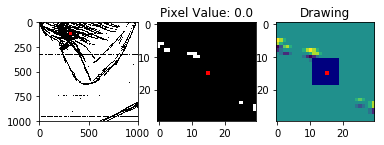

300
-0.125
0.0
-0.125


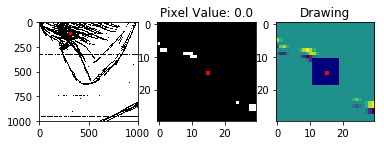

301
-0.025
0.0
-0.025


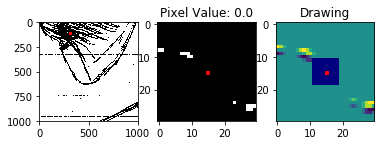

302
0.0
0.0
0.0


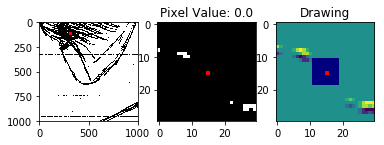

303
0.0
0.0
0.0


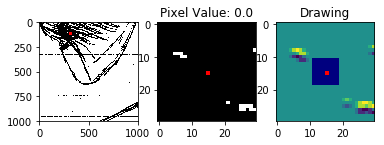

304
0.0
0.0
0.0


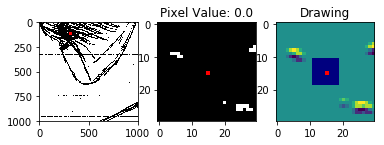

305
0.0
0.0
0.0


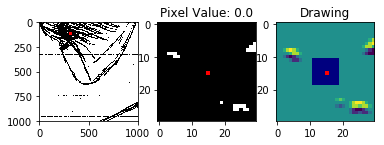

306
0.0
0.0
0.0


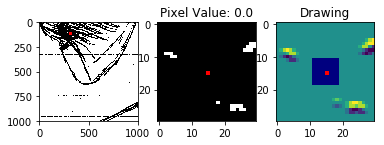

307
0.0
0.0
0.0


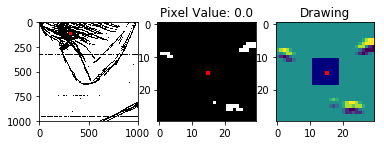

308
0.0
0.0
0.0


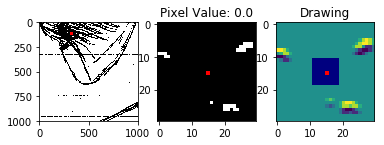

309
0.0
0.0
0.0


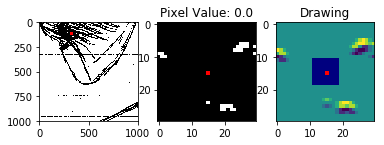

310
0.0
0.0
0.0


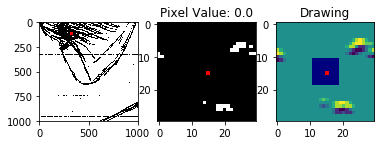

311
0.0
0.0
0.0


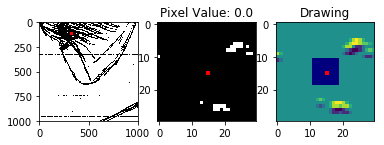

312
0.0
0.0
0.0


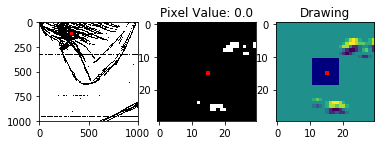

313
0.0
0.0
0.0


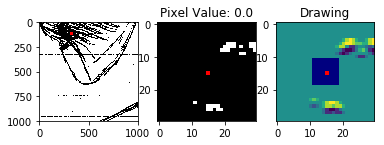

314
0.0
0.0
0.0


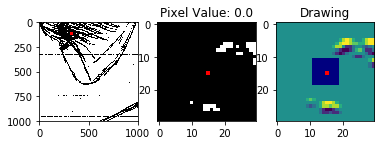

315
0.0
0.0
0.0


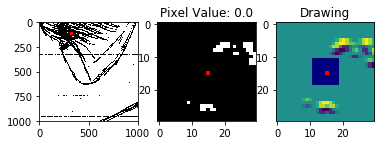

316
0.0
0.0
0.0


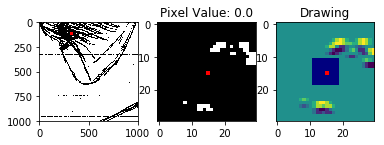

317
0.0
0.0
0.0


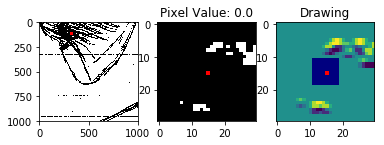

318
0.0
0.0
0.0


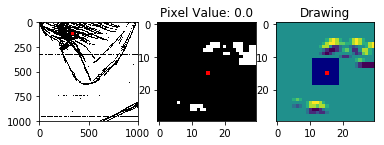

319
-0.025
0.0
-0.025


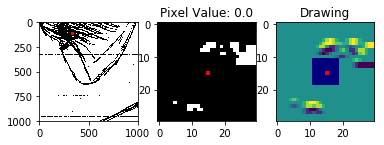

320
-0.1
0.0
-0.1


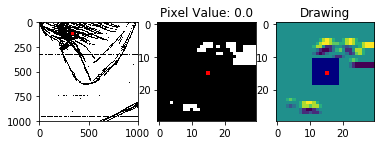

321
-0.175
0.0
-0.175


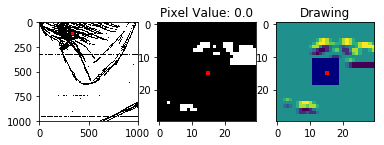

322
-0.2
0.0
-0.2


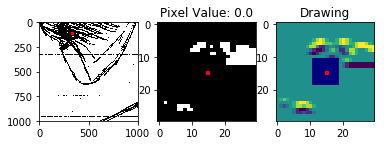

323
-0.2
0.0
-0.2


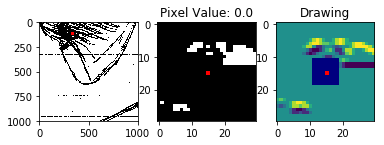

324
-0.225
0.0
-0.225


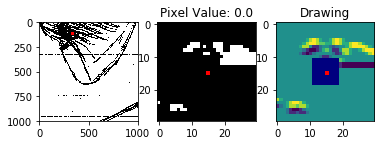

325
-0.325
0.0
-0.325


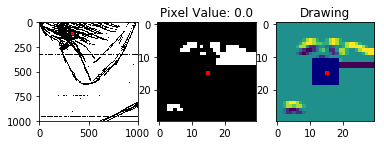

326
-0.5
0.0
-0.5


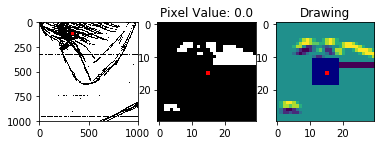

327
-0.675
0.0
-0.675


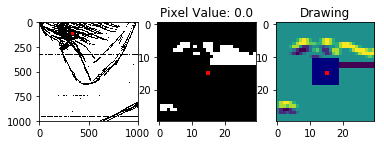

328
-0.8
0.0
-0.8


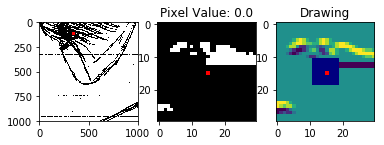

329
-0.925
0.0
-0.925


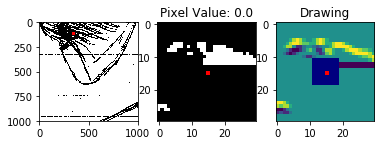

330
-1.1
0.0
-1.1


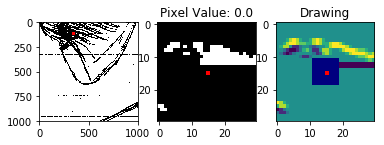

331
-1.3
0.0
-1.3


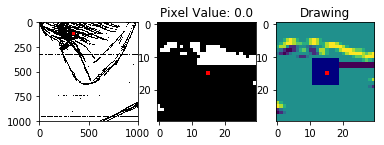

332
-1.475
0.0
-1.475


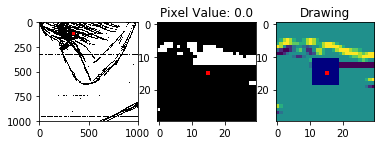

333
-1.575
0.0
-1.575


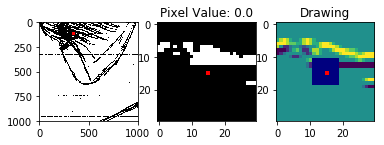

334
-1.6
0.0
-1.6


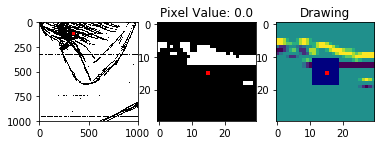

335
-1.6
0.0
-1.6


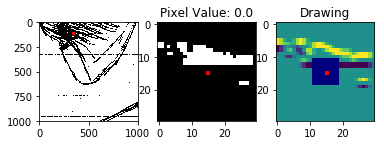

336
-1.575
0.0
-1.575


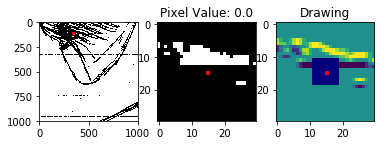

337
-1.525
0.0
-1.525


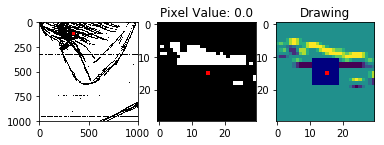

338
-1.475
0.0
-1.475


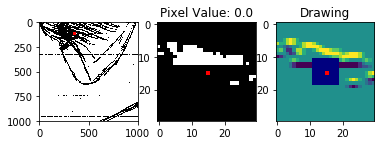

339
-1.375
0.0
-1.375


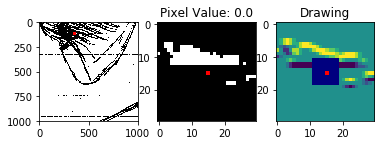

340
-1.225
0.0
-1.225


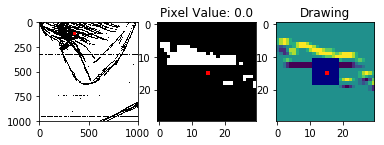

341
-1.1
0.0
-1.1


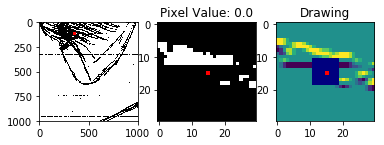

342
-1.0
0.0
-1.0


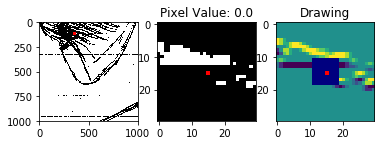

343
-0.9
0.0
-0.9


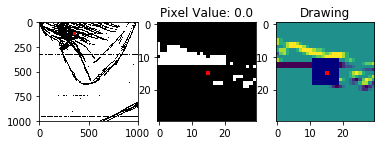

344
-0.825
0.0
-0.825


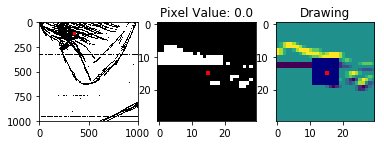

345
-0.75
0.0
-0.75


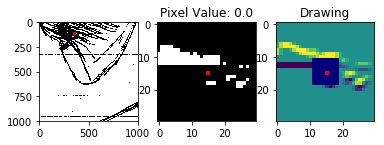

346
-0.625
0.0
-0.625


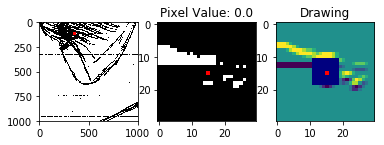

347
-0.525
0.0
-0.525


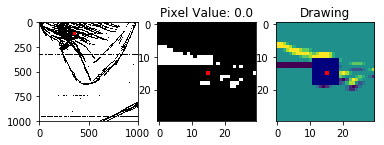

348
-0.475
0.0
-0.475


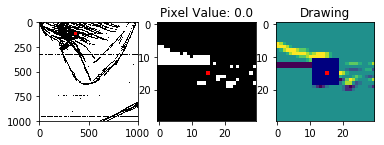

349
-0.4
0.0
-0.4


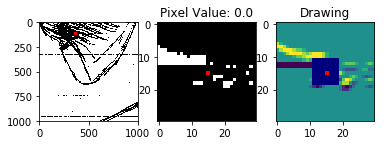

350
-0.3
0.025
-0.27499999999999997


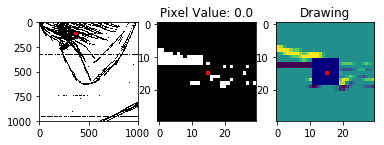

351
-0.2
0.1
-0.1


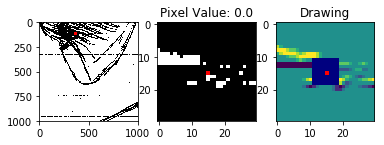

352
-0.1
0.175
0.07499999999999998


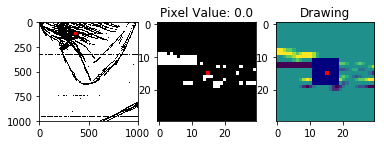

353
-0.025
0.2
0.17500000000000002


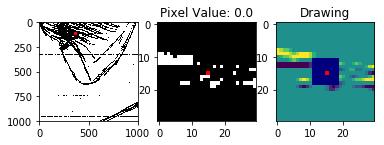

354
0.0
0.2
0.2


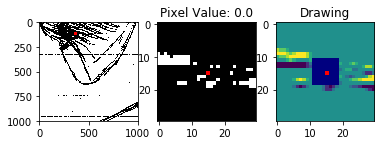

355
0.0
0.2
0.2


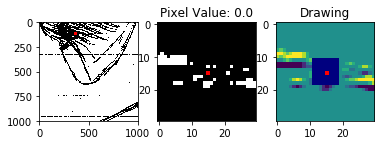

356
0.0
0.2
0.2


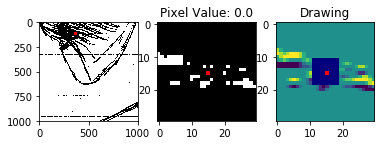

357
0.025
0.175
0.19999999999999998


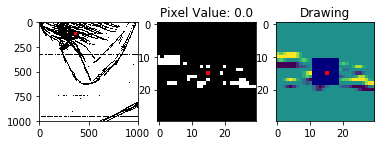

358
0.075
0.1
0.175


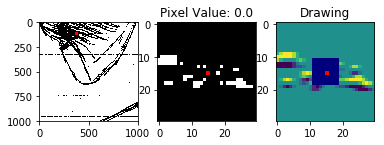

359
0.1
0.0
0.1


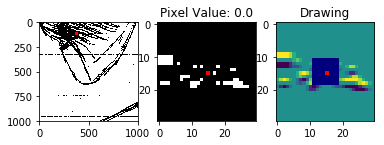

360
0.1
-0.075
0.02500000000000001


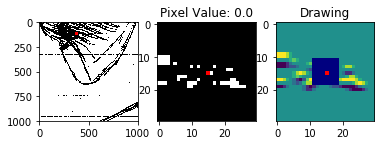

361


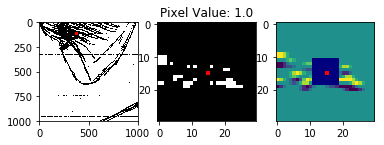

362
0.125
-0.125
0.0


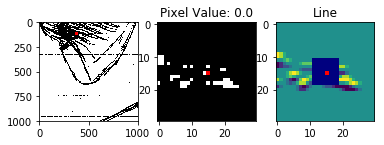

363
0.2
-0.175
0.025000000000000022


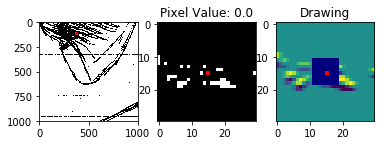

364
0.275
-0.175
0.10000000000000003


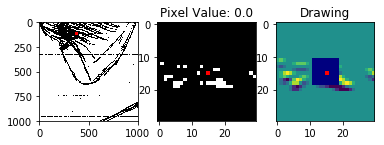

365
0.275
-0.075
0.2


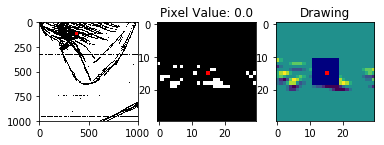

366
0.225
0.075
0.3


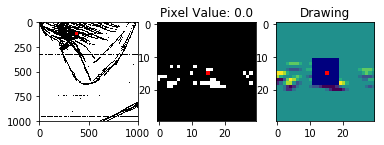

367
0.2
0.2
0.4


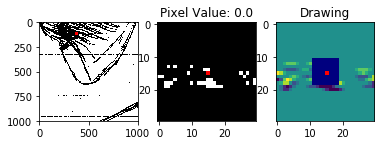

368
0.2
0.275
0.47500000000000003


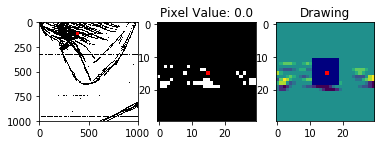

369
0.2
0.3
0.5


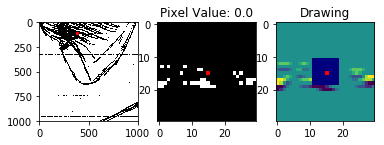

370
0.175
0.325
0.5


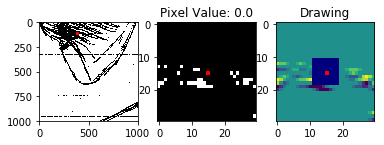

371
0.1
0.375
0.475


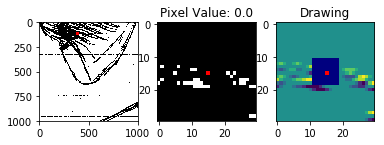

372
0.025
0.375
0.4


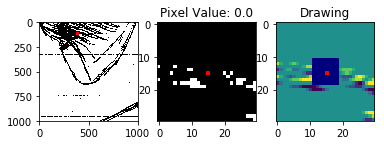

373
0.025
0.275
0.30000000000000004


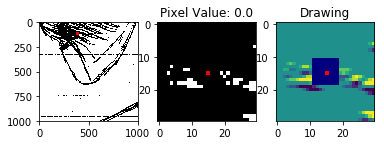

374
0.075
0.125
0.2


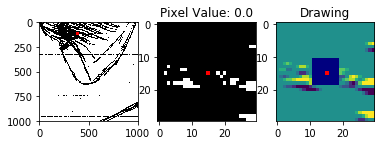

375
0.125
-0.025
0.1


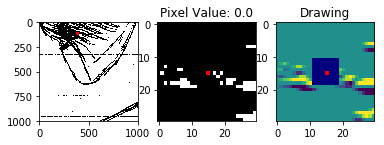

376
0.175
-0.15
0.024999999999999994


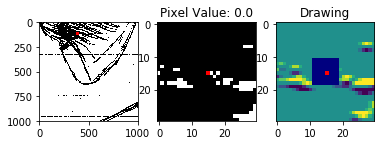

377


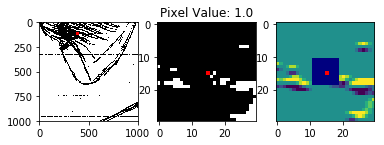

378
0.2
-0.2
0.0


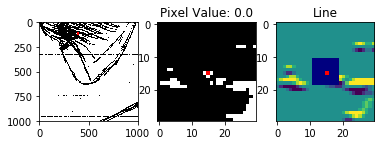

379


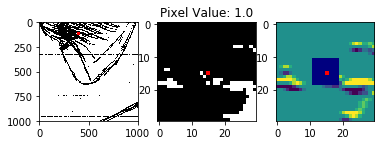

380
0.2
-0.175
0.025000000000000022


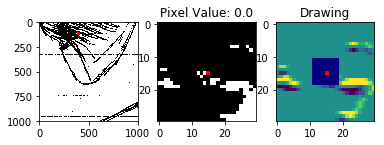

381
0.175
-0.075
0.09999999999999999


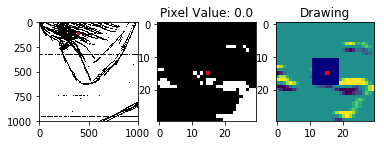

382
0.125
0.1
0.225


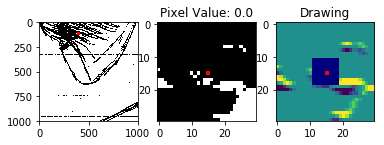

383
0.075
0.325
0.4


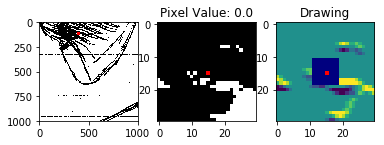

384
0.025
0.575
0.6


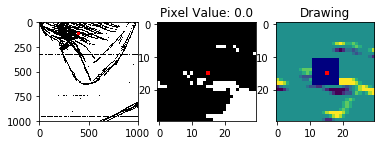

385
0.0
0.8
0.8


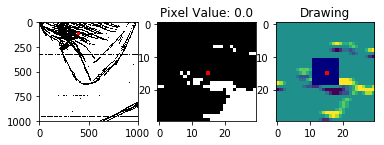

386
0.0
0.975
0.975


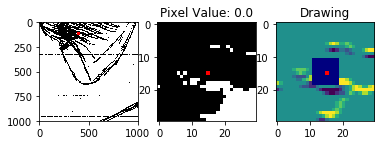

387
0.0
1.125
1.125


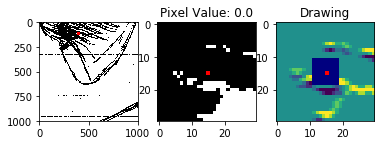

388
0.0
1.275
1.275


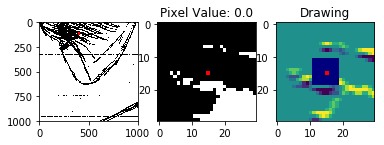

389
0.0
1.375
1.375


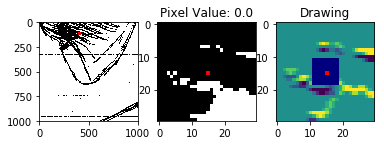

390
0.0
1.375
1.375


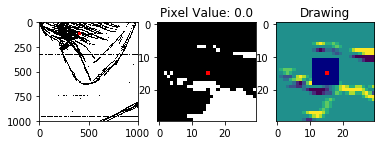

391
0.0
1.3
1.3


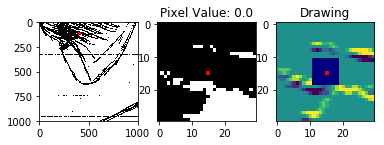

392
0.0
1.2
1.2


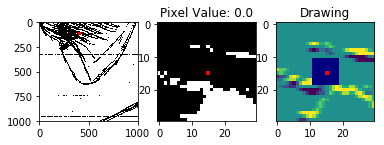

393
0.0
1.075
1.075


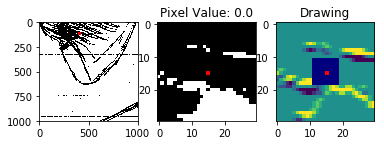

394
-0.025
0.925
0.9


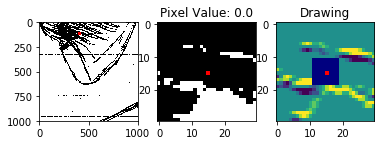

395
-0.1
0.8
0.7000000000000001


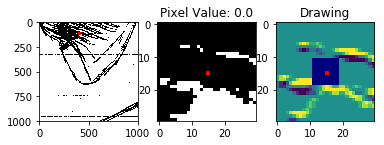

396
-0.2
0.7
0.49999999999999994


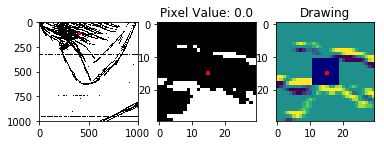

397
-0.325
0.6
0.27499999999999997


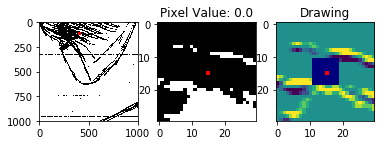

398
-0.5
0.5
0.0


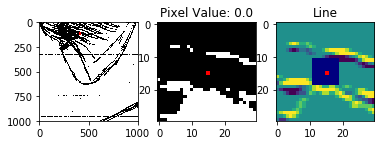

399
-0.7
0.4
-0.29999999999999993


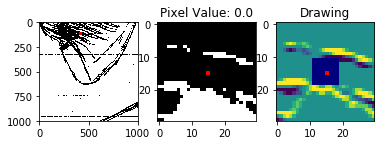

400
-0.9
0.325
-0.575


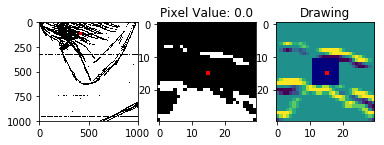

401
-1.075
0.3
-0.7749999999999999


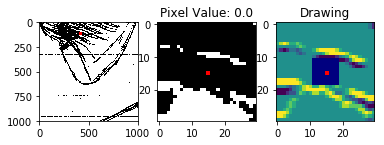

402
-1.175
0.3
-0.875


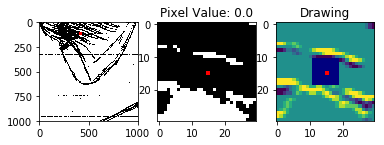

403
-1.2
0.275
-0.9249999999999999


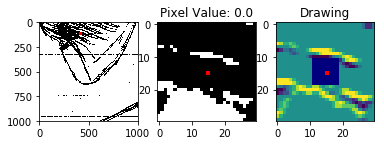

404
-1.175
0.2
-0.9750000000000001


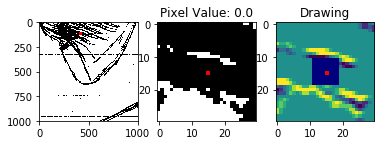

405
-1.075
0.125
-0.95


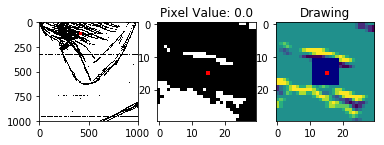

406
-0.9
0.1
-0.8


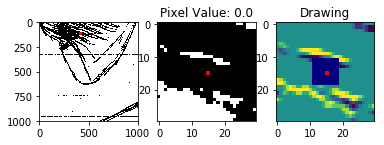

407
-0.7
0.1
-0.6


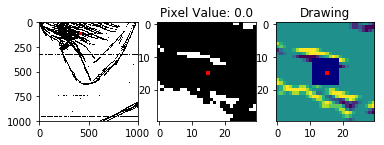

408
-0.5
0.075
-0.425


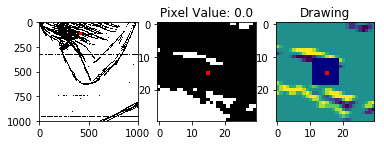

409
-0.325
0.025
-0.3


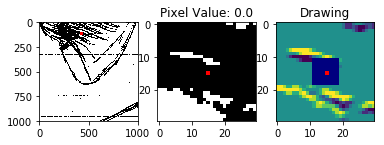

410
-0.2
0.0
-0.2


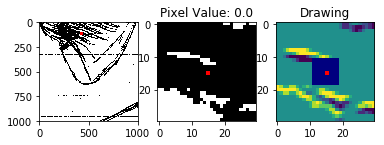

411
-0.1
0.0
-0.1


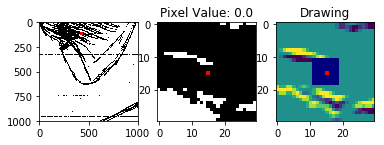

412
-0.025
0.0
-0.025


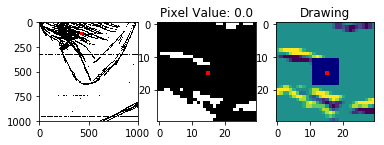

413
0.0
0.0
0.0


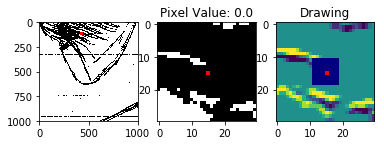

414
0.0
0.0
0.0


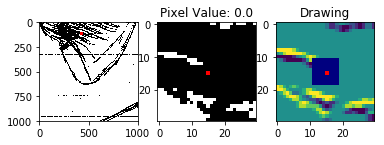

415
0.0
0.0
0.0


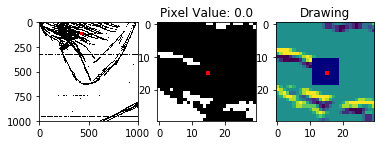

416
0.0
0.0
0.0


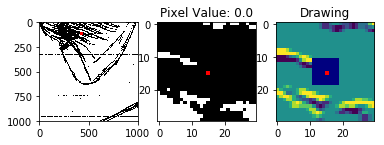

417
0.0
0.0
0.0


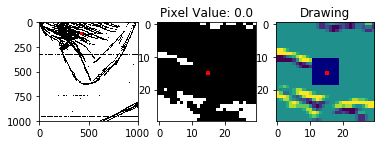

418
0.0
0.0
0.0


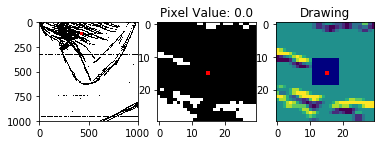

419
0.0
0.0
0.0


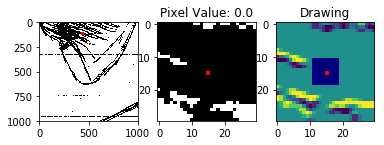

420
0.0
0.0
0.0


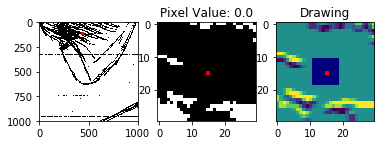

421
0.0
0.0
0.0


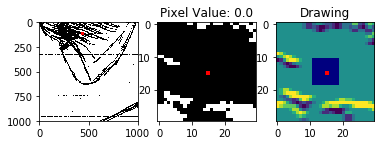

422
0.0
0.0
0.0


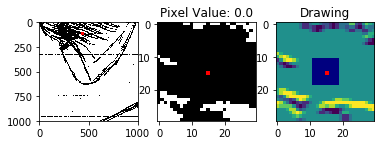

423
0.0
0.0
0.0


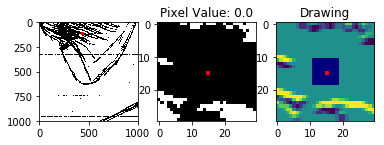

424
0.0
0.0
0.0


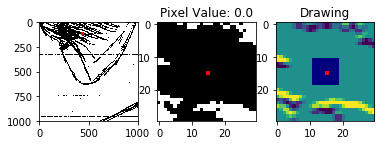

425
0.0
0.0
0.0


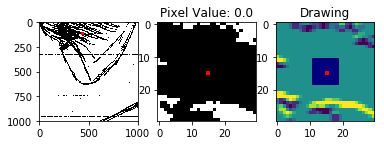

426
0.0
0.0
0.0


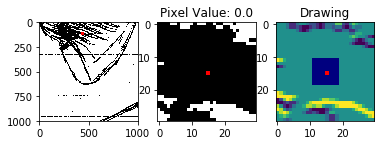

427
0.0
0.0
0.0


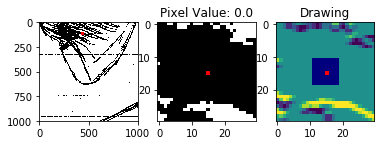

428
0.0
0.0
0.0


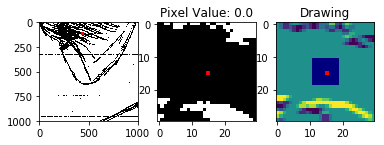

429
0.0
0.0
0.0


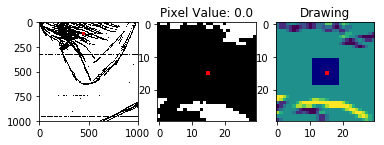

430
0.0
0.0
0.0


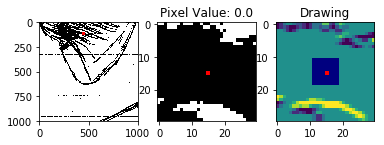

431
0.0
0.0
0.0


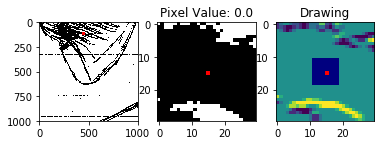

432
0.0
0.0
0.0


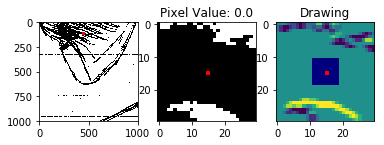

433
0.0
0.0
0.0


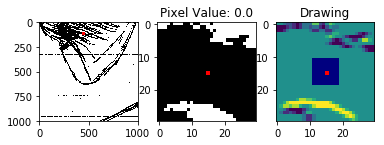

434
0.0
0.0
0.0


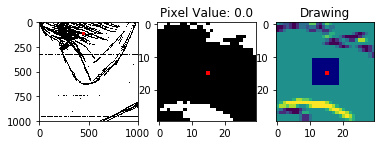

435
0.0
0.0
0.0


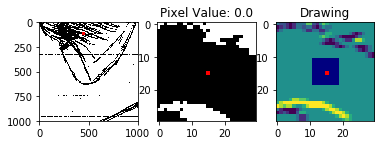

436
0.0
0.0
0.0


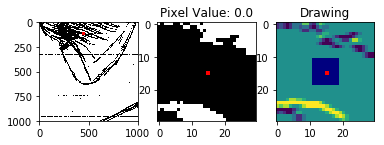

437
0.0
0.0
0.0


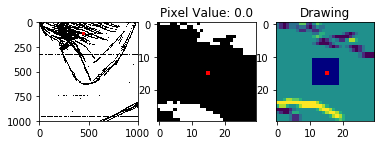

438
0.0
0.0
0.0


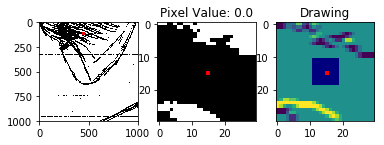

439
0.0
0.0
0.0


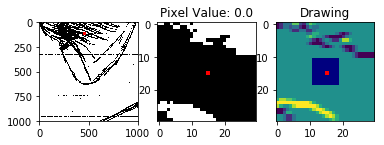

440
0.0
0.0
0.0


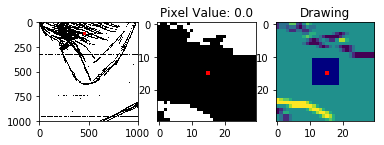

441
0.0
0.0
0.0


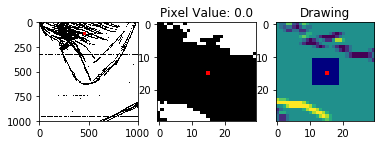

442
0.0
0.0
0.0


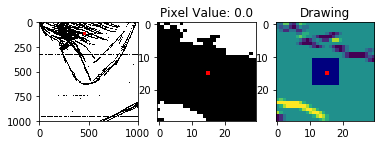

443
0.0
0.0
0.0


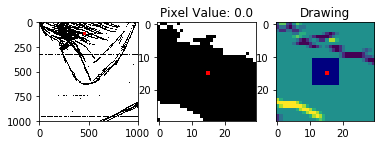

444
-0.025
0.0
-0.025


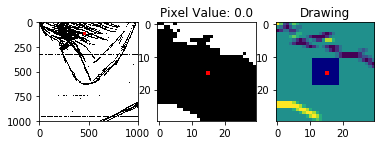

445
-0.1
0.0
-0.1


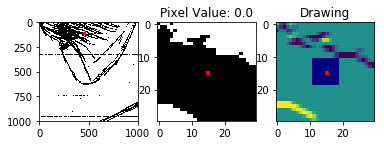

446
-0.2
0.0
-0.2


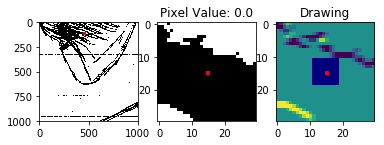

447
-0.3
0.0
-0.3


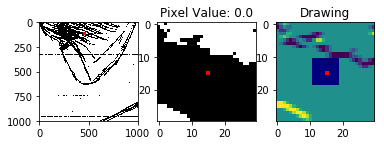

448
-0.4
0.0
-0.4


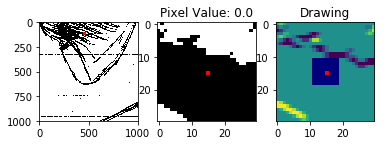

449
-0.5
0.0
-0.5


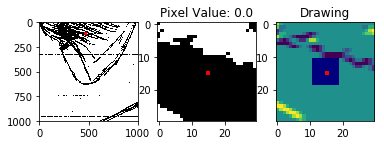

450
-0.6
0.0
-0.6


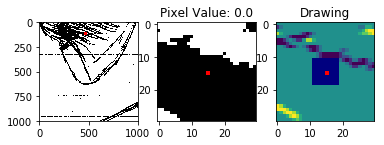

451
-0.7
0.0
-0.7


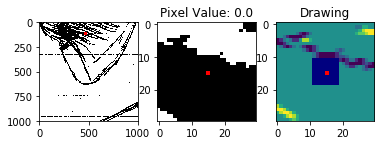

452
-0.8
0.0
-0.8


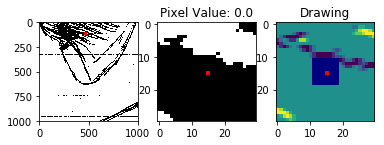

453
-0.9
0.0
-0.9


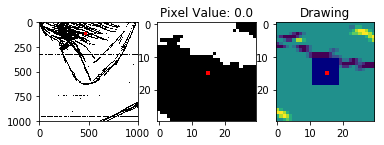

454
-1.0
0.0
-1.0


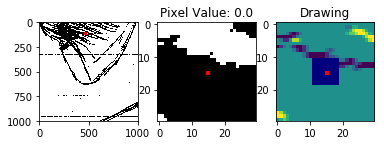

455
-1.1
0.0
-1.1


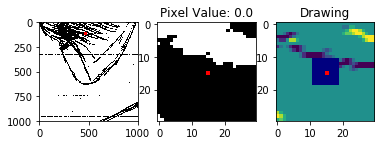

456
-1.2
0.0
-1.2


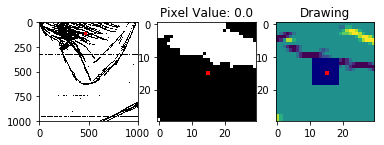

457
-1.3
0.0
-1.3


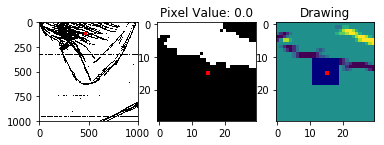

458
-1.4
0.0
-1.4


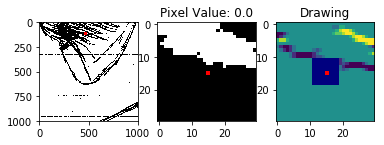

459
-1.5
0.0
-1.5


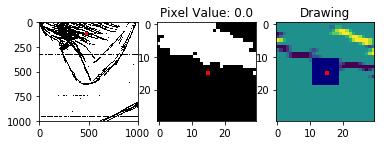

460
-1.575
0.0
-1.575


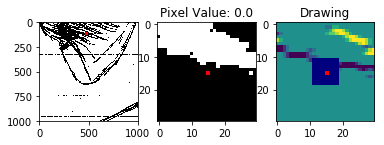

461
-1.6
0.0
-1.6


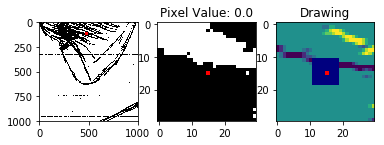

462
-1.6
0.0
-1.6


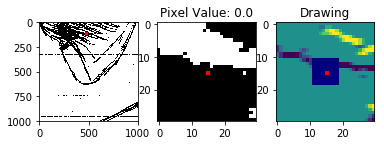

463
-1.6
0.0
-1.6


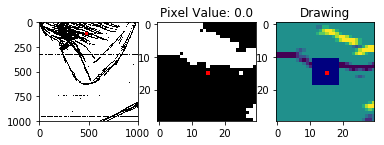

464
-1.6
0.0
-1.6


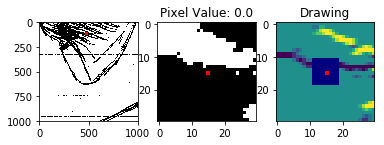

465
-1.6
0.0
-1.6


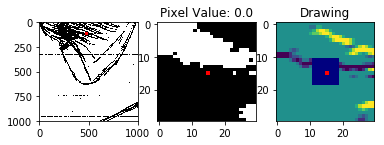

466
-1.6
0.0
-1.6


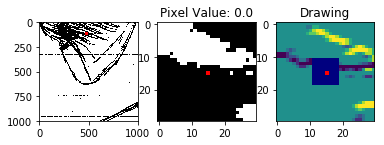

467
-1.6
0.0
-1.6


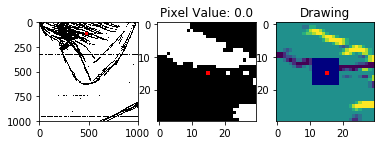

468
-1.6
0.0
-1.6


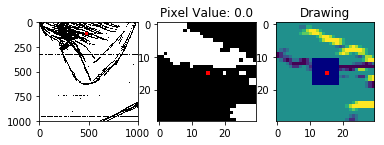

469
-1.575
-0.025
-1.5999999999999999


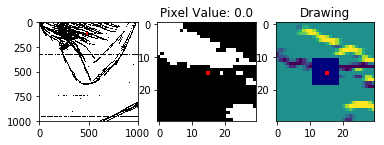

470
-1.525
-0.075
-1.5999999999999999


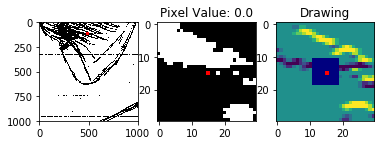

471
-1.5
-0.1
-1.6


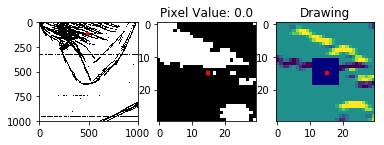

472
-1.5
-0.1
-1.6


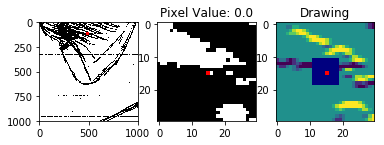

473


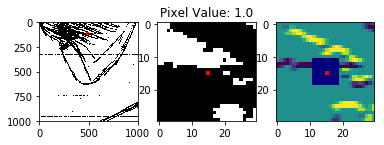

474
-1.475
-0.125
-1.6


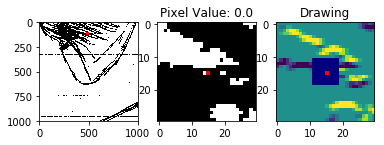

475
-1.4
-0.2
-1.5999999999999999


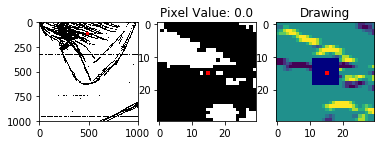

476
-1.275
-0.275
-1.5499999999999998


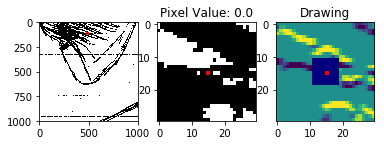

477
-1.125
-0.275
-1.4


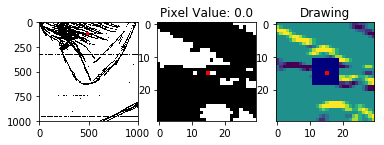

478


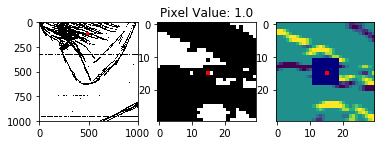

479


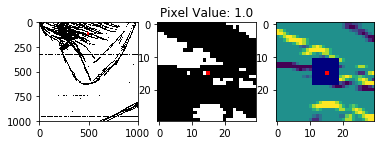

480
-0.6
-0.2
-0.8


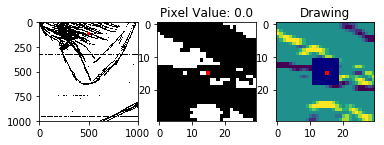

481
-0.4
-0.2
-0.6000000000000001


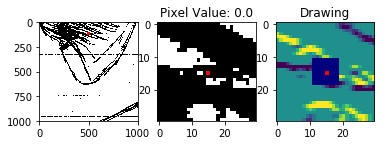

482
-0.225
-0.175
-0.4


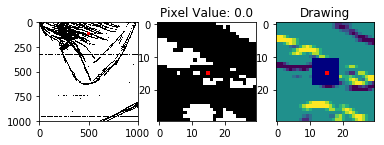

483
-0.1
-0.1
-0.2


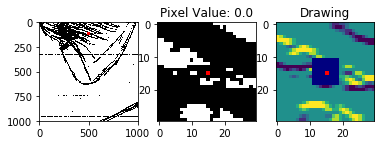

484
-0.025
-0.025
-0.05


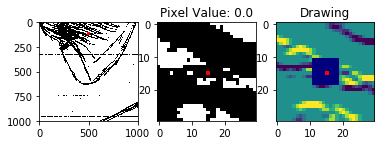

485
0.025
0.0
0.025


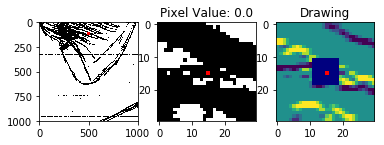

486
0.1
0.0
0.1


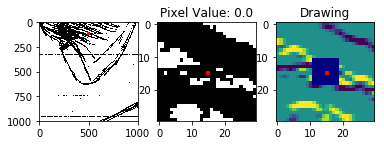

487
0.175
0.025
0.19999999999999998


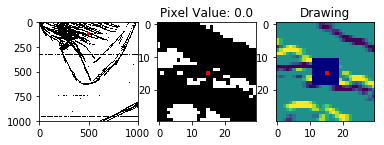

488
0.2
0.1
0.30000000000000004


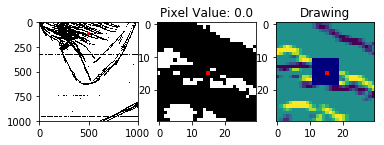

489
0.2
0.2
0.4


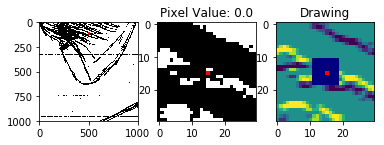

490
0.2
0.3
0.5


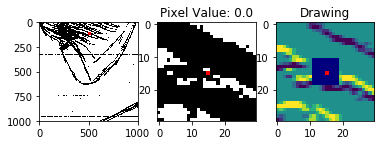

491
0.2
0.4
0.6000000000000001


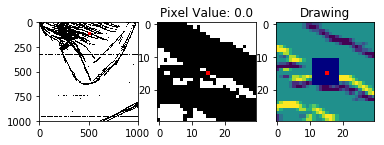

492
0.2
0.475
0.675


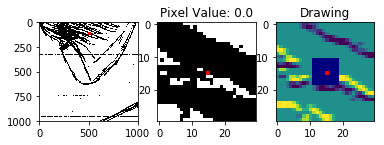

493
0.175
0.525
0.7


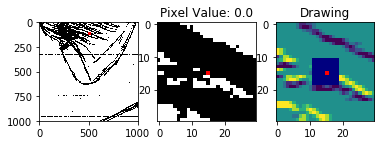

494
0.1
0.625
0.725


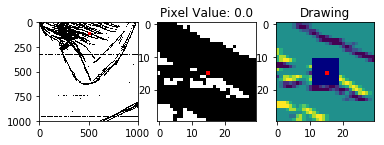

495
0.025
0.775
0.8


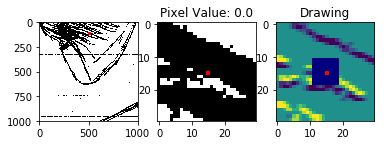

496
0.0
0.875
0.875


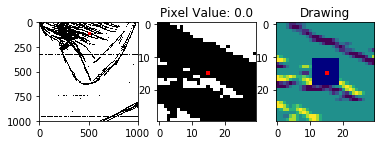

497
0.0
0.925
0.925


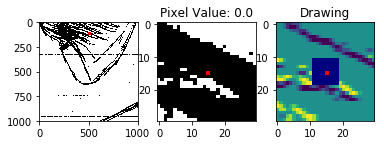

498
0.0
0.975
0.975


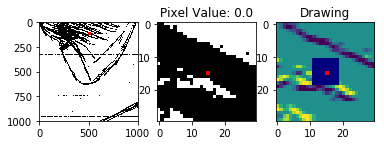

499
0.0
1.0
1.0


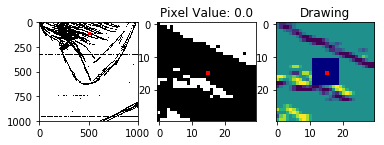

500
-0.025
1.0
0.975


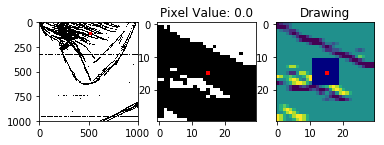

501
-0.1
0.975
0.875


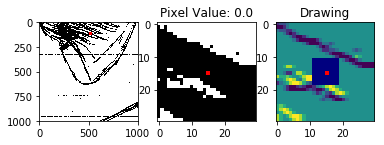

502
-0.2
0.875
0.675


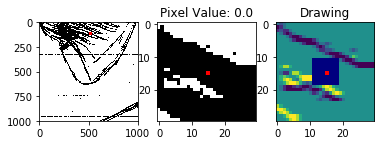

503
-0.325
0.7
0.37499999999999994


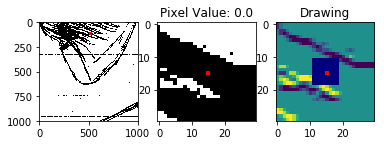

504
-0.5
0.525
0.025000000000000022


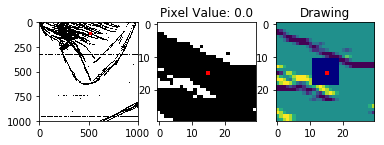

505
-0.7
0.375
-0.32499999999999996


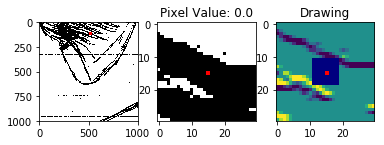

506
-0.875
0.225
-0.65


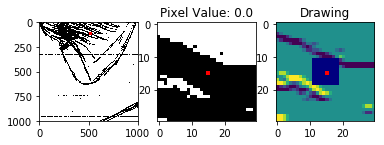

507
-1.025
0.1
-0.9249999999999999


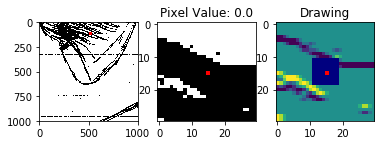

508
-1.175
0.025
-1.1500000000000001


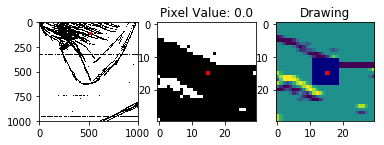

509
-1.3
0.0
-1.3


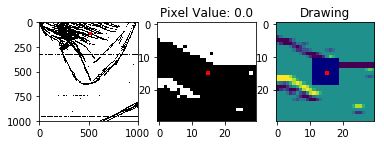

510
-1.4
0.0
-1.4


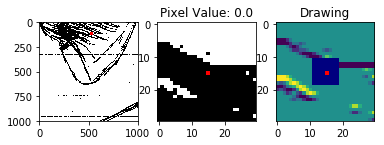

511
-1.475
0.0
-1.475


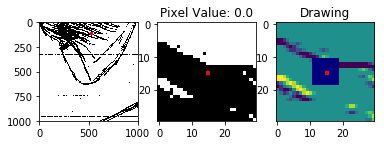

512
-1.5
0.0
-1.5


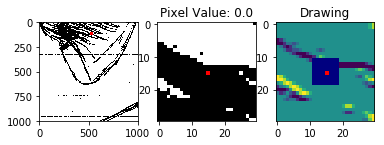

513
-1.5
0.0
-1.5


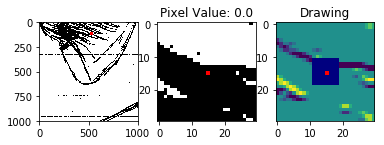

514
-1.525
0.0
-1.525


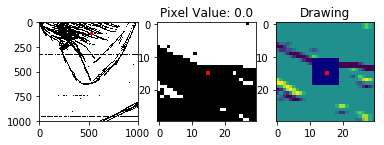

515
-1.575
0.0
-1.575


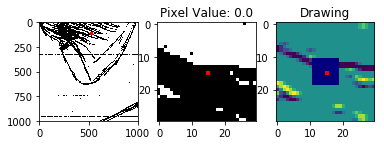

516
-1.6
0.0
-1.6


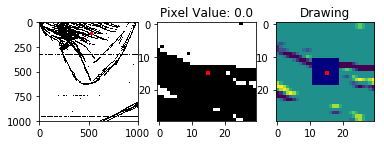

517
-1.6
0.0
-1.6


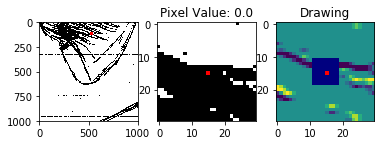

518
-1.575
-0.025
-1.5999999999999999


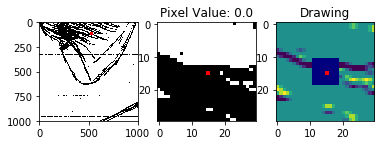

519
-1.525
-0.075
-1.5999999999999999


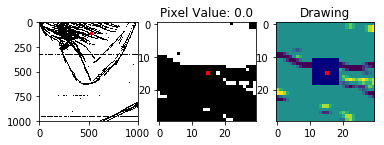

520
-1.5
-0.1
-1.6


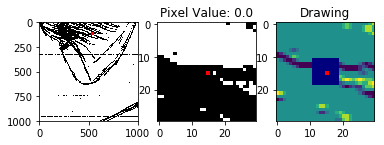

521
-1.5
-0.1
-1.6


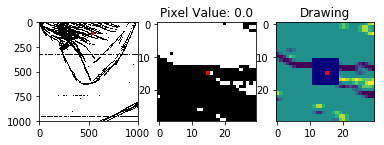

522


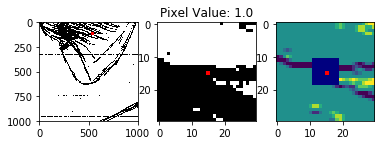

523
-1.5
-0.1
-1.6


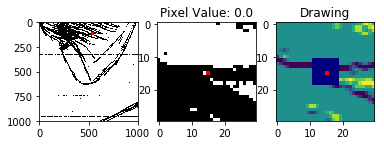

524
-1.5
-0.1
-1.6


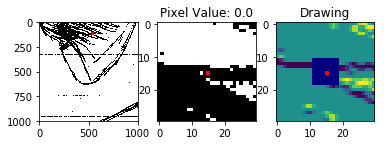

525
-1.5
-0.1
-1.6


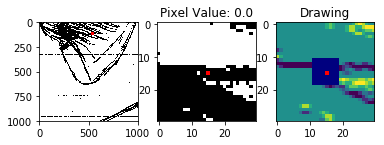

526
-1.525
-0.05
-1.575


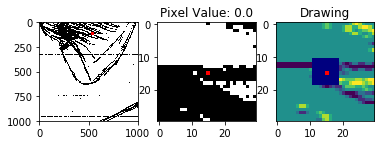

527
-1.55
0.05
-1.5


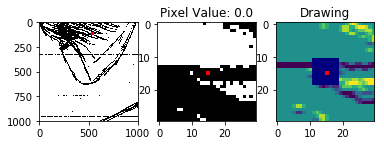

528
-1.525
0.125
-1.4


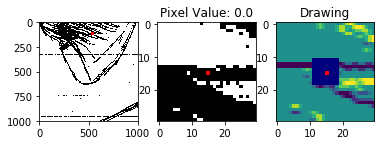

529
-1.5
0.225
-1.275


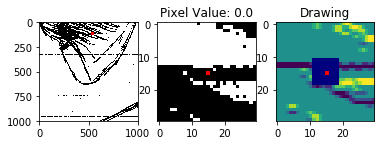

530
-1.5
0.4
-1.1


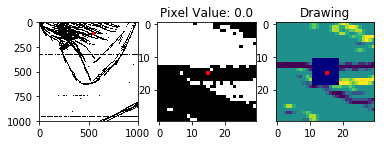

531
-1.5
0.6
-0.9


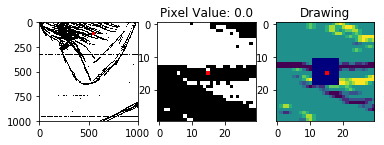

532
-1.5
0.8
-0.7


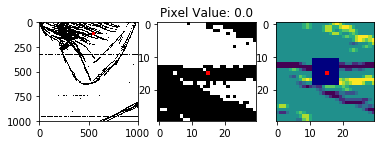

533
-1.5
1.0
-0.5


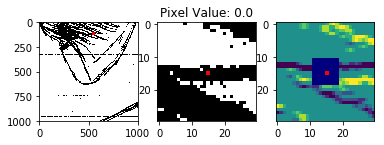

534
-1.5
1.15
-0.3500000000000001


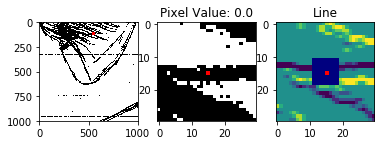

535
-1.525
1.25
-0.2749999999999999


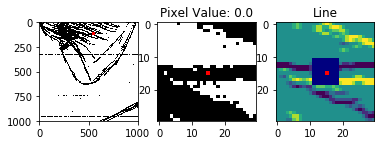

536
-1.575
1.375
-0.19999999999999996


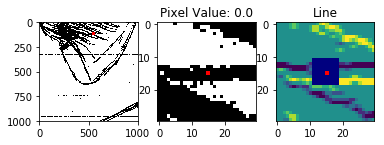

537
-1.6
1.475
-0.125


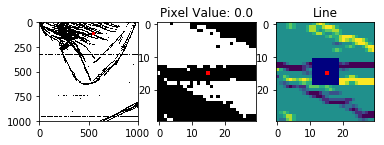

538
-1.6
1.5
-0.10000000000000009


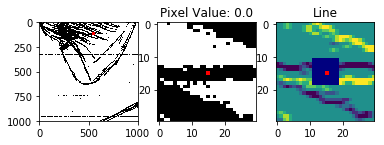

539
-1.6
1.5
-0.10000000000000009


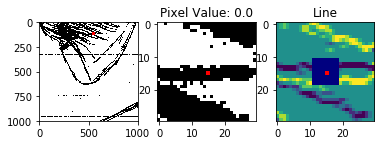

540
-1.6
1.5
-0.10000000000000009


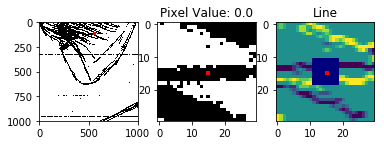

541
-1.6
1.5
-0.10000000000000009


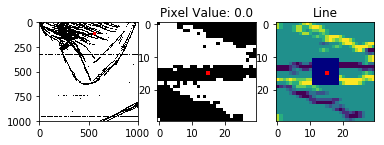

542
-1.6
1.525
-0.07500000000000018


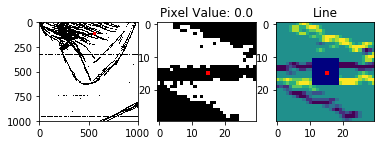

543
-1.6
1.575
-0.025000000000000133


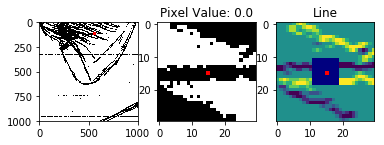

544
-1.6
1.6
0.0


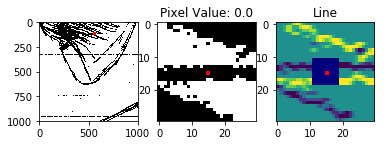

545
-1.6
1.6
0.0


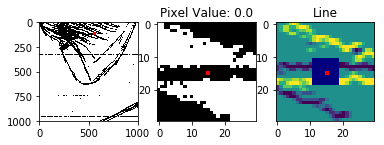

546
-1.6
1.6
0.0


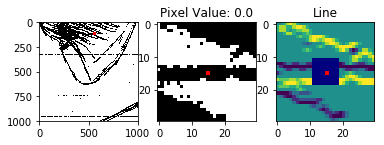

547
-1.6
1.6
0.0


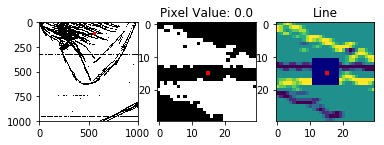

548
-1.6
1.6
0.0


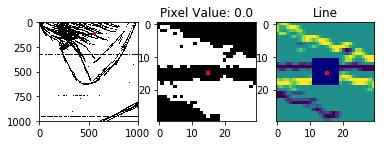

549
-1.575
1.6
0.025000000000000133


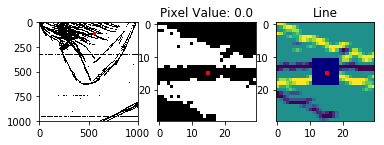

550
-1.475
1.6
0.125


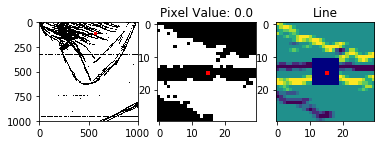

551
-1.3
1.6
0.30000000000000004


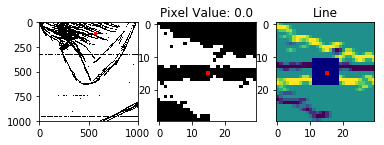

552
-1.125
1.6
0.4750000000000001


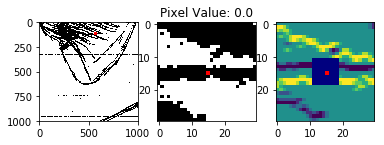

553
-1.025
1.6
0.5750000000000002


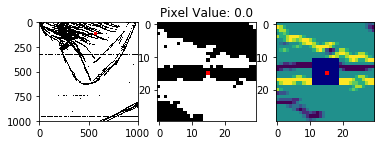

554
-1.0
1.6
0.6000000000000001


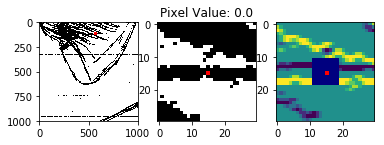

555
-0.975
1.6
0.6250000000000001


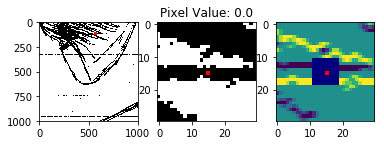

556
-0.875
1.6
0.7250000000000001


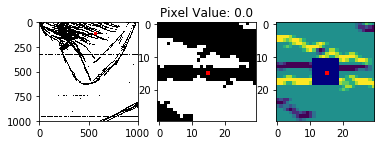

557
-0.725
1.575
0.85


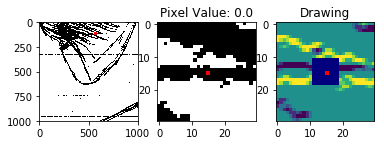

558
-0.625
1.525
0.8999999999999999


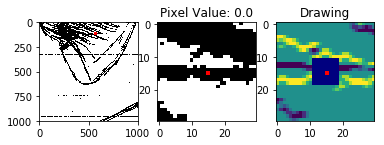

559
-0.625
1.5
0.875


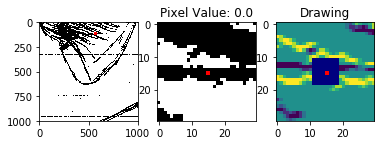

560
-0.675
1.5
0.825


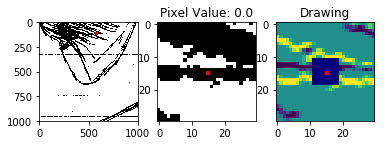

561
-0.65
1.5
0.85


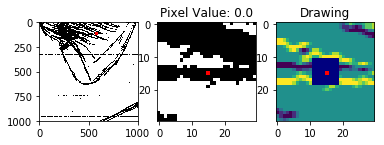

562
-0.5
1.5
1.0


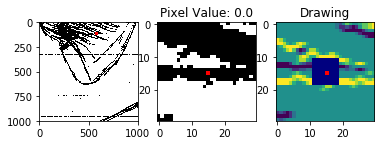

563
-0.325
1.5
1.175


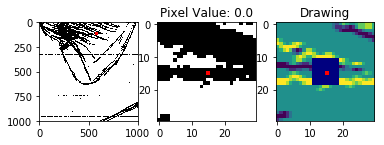

564
-0.225
1.5
1.275


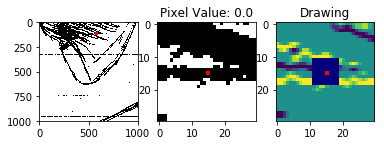

565
-0.2
1.525
1.325


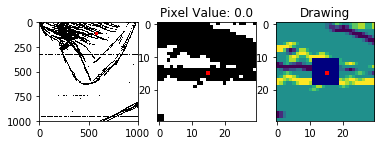

566
-0.2
1.575
1.375


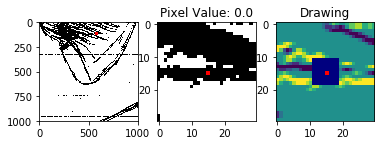

567
-0.175
1.6
1.425


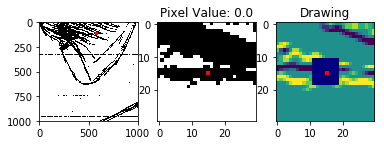

568
-0.1
1.6
1.5


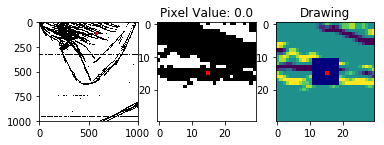

569
-0.025
1.6
1.5750000000000002


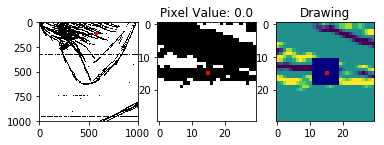

570
0.0
1.6
1.6


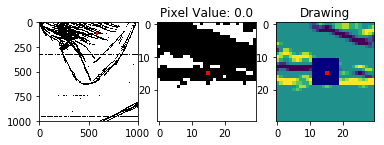

571
0.0
1.6
1.6


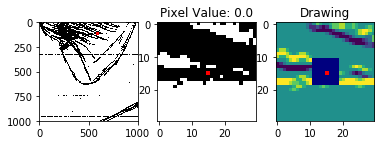

572
0.0
1.6
1.6


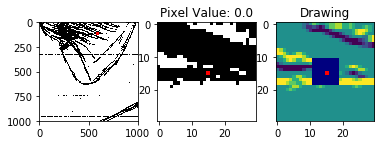

573
0.0
1.6
1.6


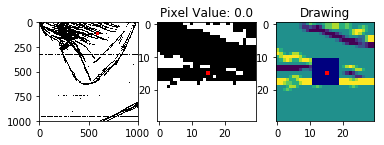

574
0.0
1.6
1.6


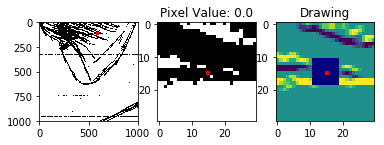

575
0.025
1.575
1.5999999999999999


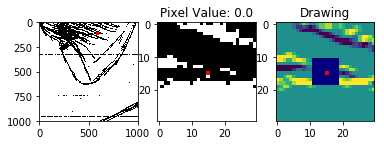

576
0.1
1.5
1.6


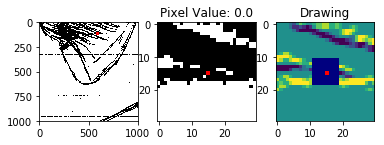

577
0.2
1.4
1.5999999999999999


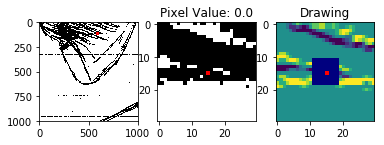

578
0.3
1.3
1.6


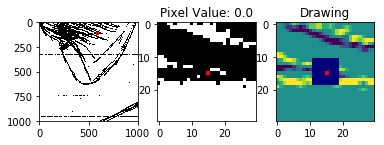

579
0.4
1.2
1.6


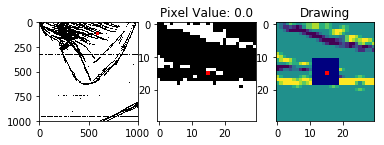

580
0.475
1.125
1.6


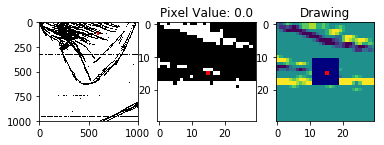

581
0.5
1.1
1.6


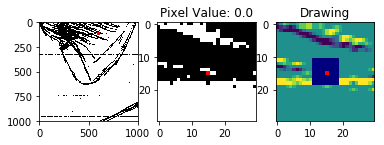

582


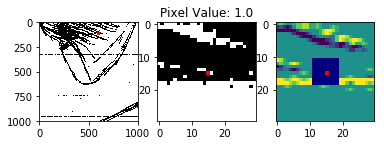

583


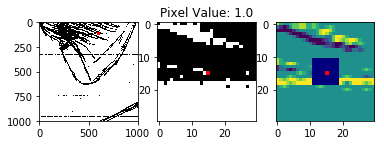

584
0.4
1.2
1.6


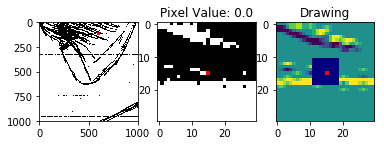

585
0.3
1.275
1.575


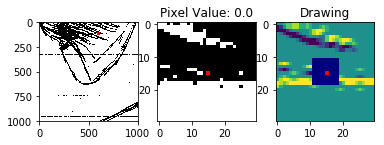

586
0.2
1.325
1.525


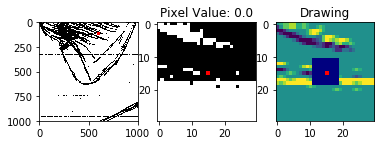

587
0.1
1.4
1.5


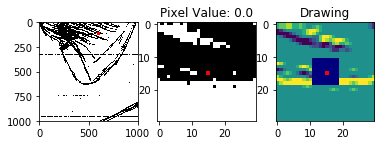

588
0.025
1.475
1.5


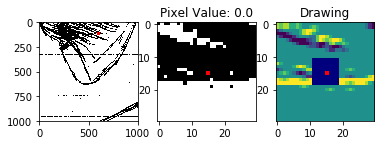

589
0.0
1.5
1.5


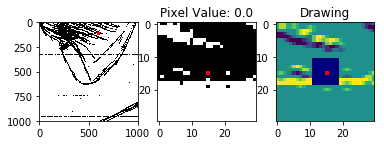

590
0.0
1.5
1.5


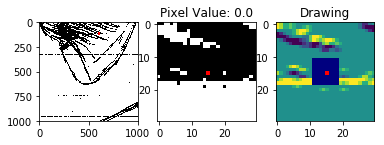

591
0.025
1.45
1.4749999999999999


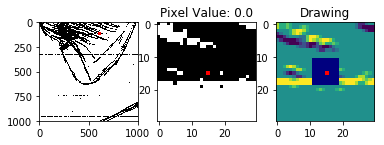

592
0.075
1.35
1.425


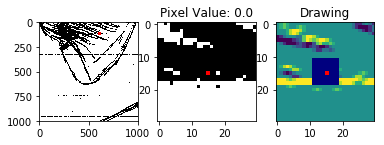

593
0.1
1.325
1.425


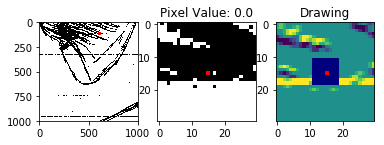

594
0.1
1.375
1.475


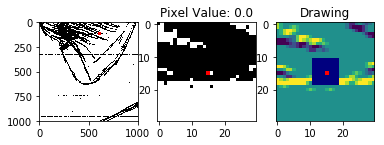

595


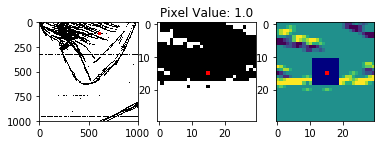

596
0.1
1.4
1.5


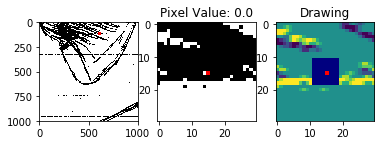

597
0.1
1.4
1.5


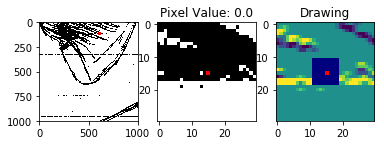

598
0.1
1.4
1.5


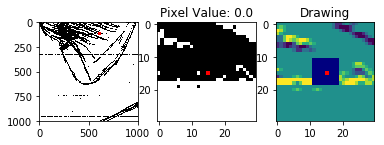

599
0.075
1.45
1.525


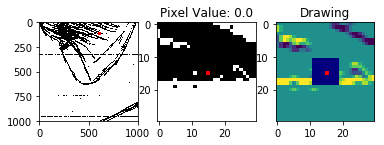

600
0.025
1.55
1.575


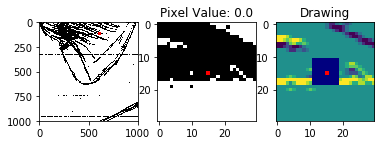

601
0.0
1.6
1.6


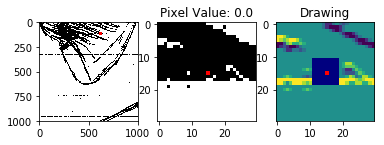

602
0.0
1.6
1.6


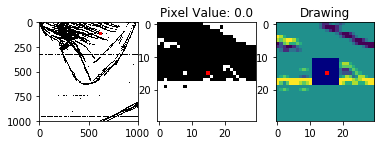

603
0.025
1.575
1.5999999999999999


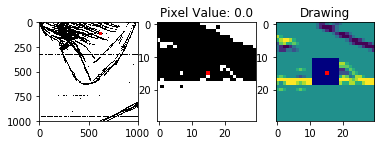

604
0.075
1.525
1.5999999999999999


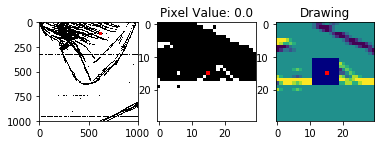

605
0.125
1.475
1.6


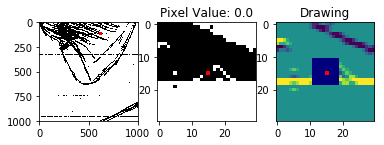

606
0.2
1.4
1.5999999999999999


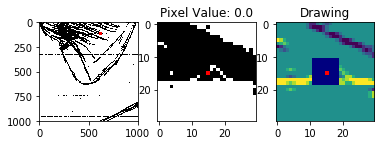

607
0.275
1.325
1.6


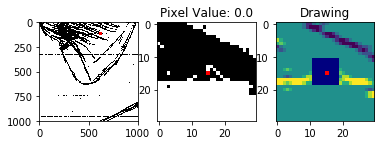

608
0.3
1.3
1.6


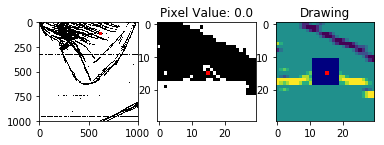

609
0.3
1.3
1.6


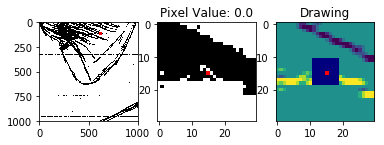

610


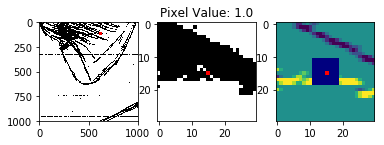

611
0.275
1.325
1.6


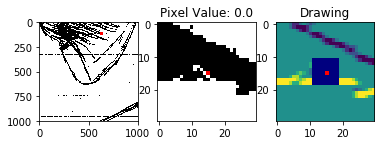

612
0.225
1.375
1.6


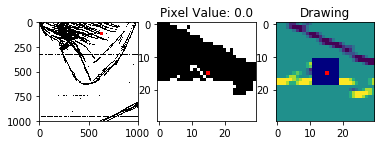

613
0.175
1.425
1.6


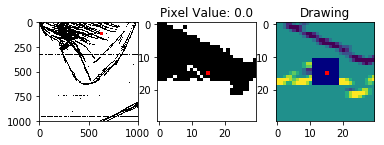

614
0.1
1.5
1.6


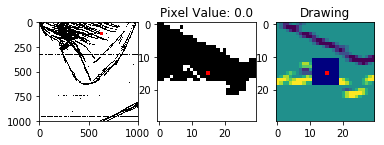

615
0.025
1.575
1.5999999999999999


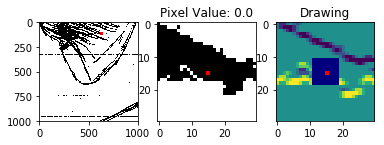

616
-0.025
1.575
1.55


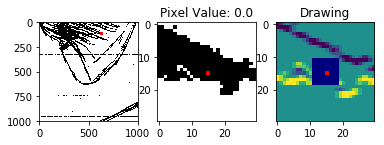

617
-0.125
1.475
1.35


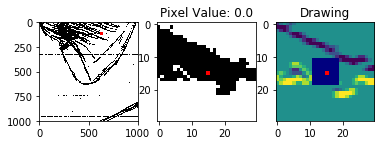

618
-0.3
1.3
1.0


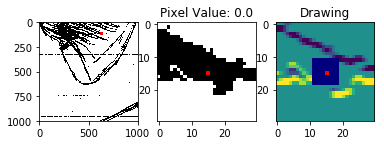

619
-0.5
1.1
0.6000000000000001


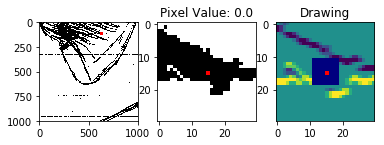

620
-0.7
0.9
0.20000000000000007


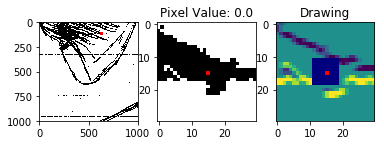

621
-0.9
0.7
-0.20000000000000007


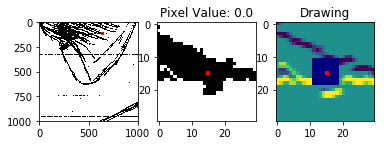

622
-1.1
0.55
-0.55


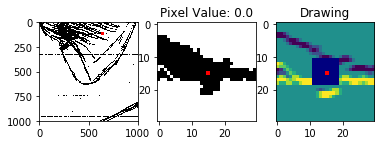

623
-1.3
0.5
-0.8


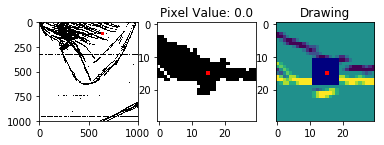

624
-1.475
0.525
-0.9500000000000001


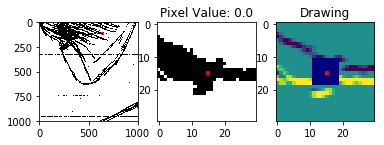

625
-1.575
0.625
-0.95


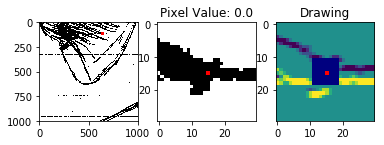

626
-1.6
0.8
-0.8


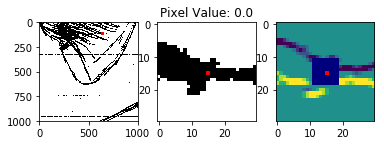

627
-1.6
1.0
-0.6000000000000001


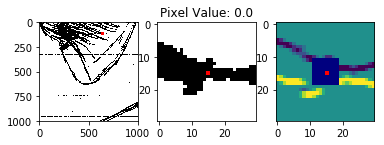

628
-1.6
1.2
-0.40000000000000013


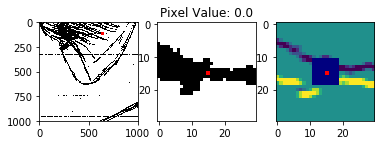

629
-1.6
1.4
-0.20000000000000018


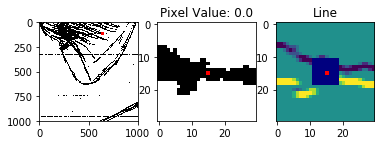

630
-1.6
1.55
-0.050000000000000044


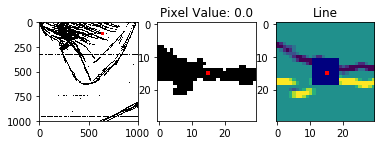

631
-1.575
1.575
0.0


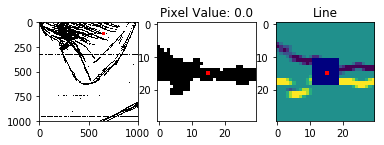

632
-1.525
1.525
0.0


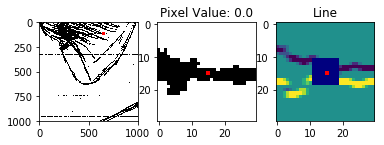

633
-1.5
1.5
0.0


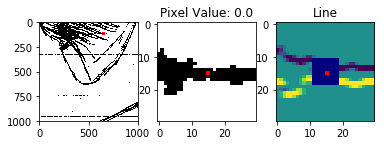

634
-1.5
1.5
0.0


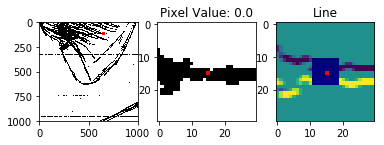

635
-1.5
1.5
0.0


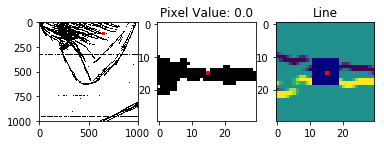

636
-1.5
1.5
0.0


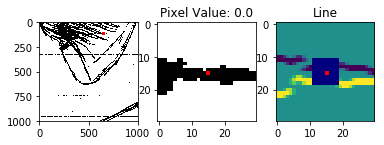

637
-1.5
1.5
0.0


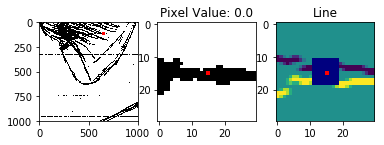

638
-1.5
1.5
0.0


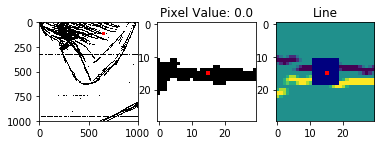

639
-1.525
1.525
0.0


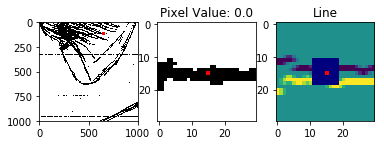

640
-1.575
1.575
0.0


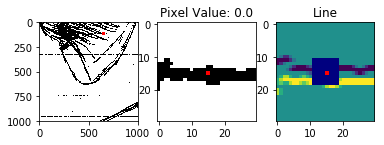

641
-1.6
1.6
0.0


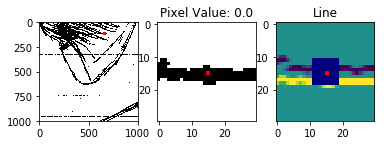

642
-1.6
1.6
0.0


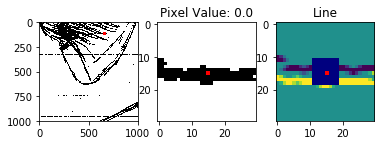

643
-1.6
1.6
0.0


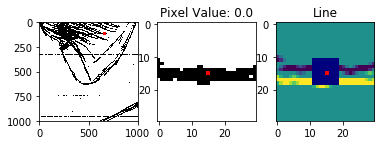

644
-1.6
1.6
0.0


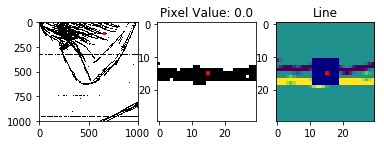

645
-1.575
1.575
0.0


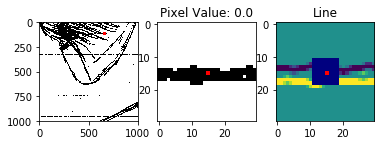

646
-1.5
1.5
0.0


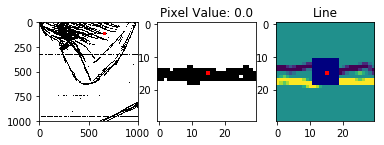

647
-1.4
1.4
0.0


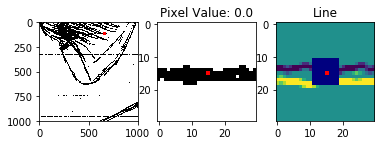

648
-1.325
1.325
0.0


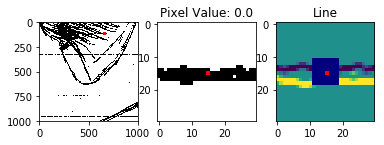

649
-1.3
1.3
0.0


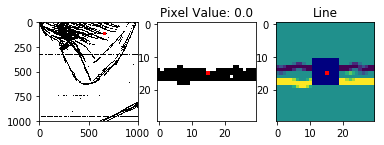

650
-1.3
1.3
0.0


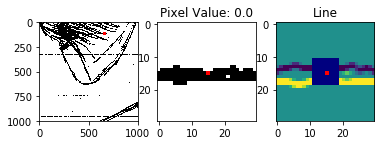

651
-1.3
1.3
0.0


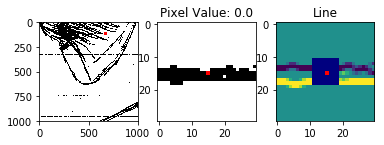

652
-1.3
1.3
0.0


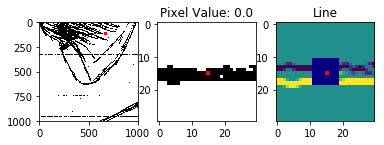

653
-1.325
1.325
0.0


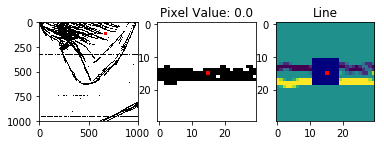

654
-1.4
1.4
0.0


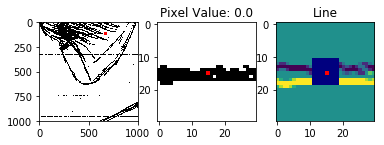

655
-1.5
1.5
0.0


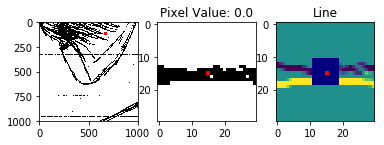

656
-1.55
1.55
0.0


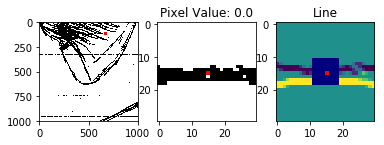

657
-1.525
1.525
0.0


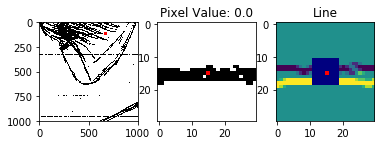

658
-1.5
1.5
0.0


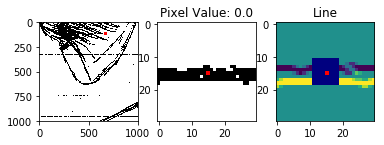

659
-1.5
1.5
0.0


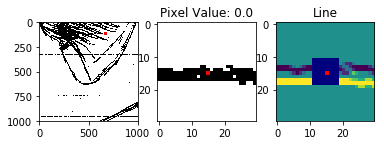

660
-1.475
1.475
0.0


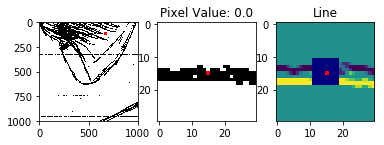

661
-1.4
1.4
0.0


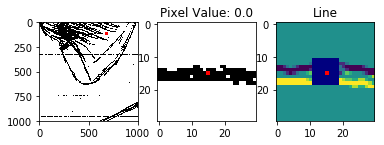

662
-1.325
1.325
0.0


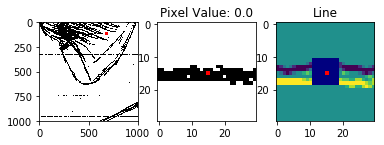

663
-1.3
1.3
0.0


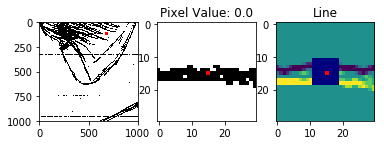

664
-1.325
1.325
0.0


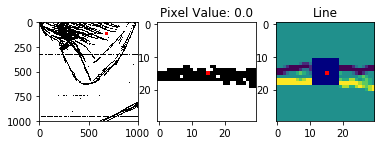

665
-1.375
1.375
0.0


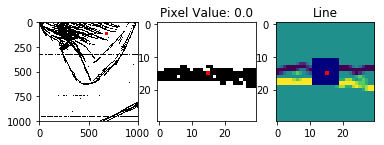

666
-1.4
1.4
0.0


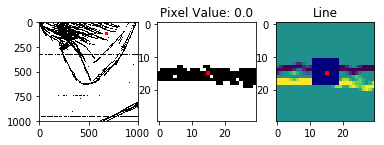

667
-1.4
1.4
0.0


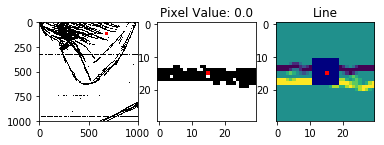

668
-1.425
1.425
0.0


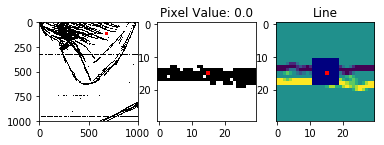

669
-1.475
1.475
0.0


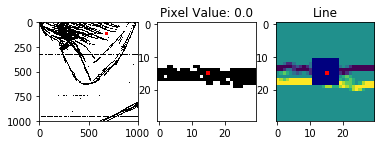

670
-1.475
1.475
0.0


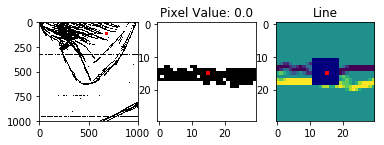

671
-1.4
1.4
0.0


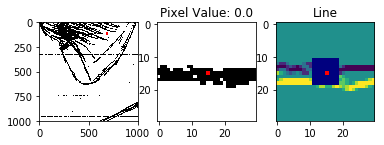

672
-1.325
1.325
0.0


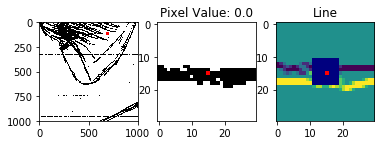

673
-1.3
1.275
-0.025000000000000133


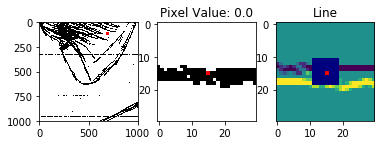

674
-1.3
1.2
-0.10000000000000009


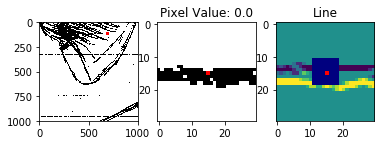

675
-1.3
1.1
-0.19999999999999996


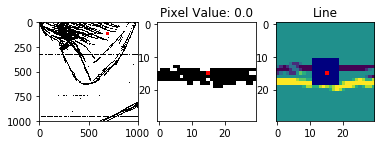

676
-1.3
1.025
-0.27500000000000013


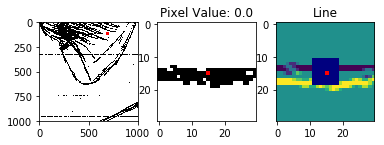

677
-1.325
1.025
-0.30000000000000004


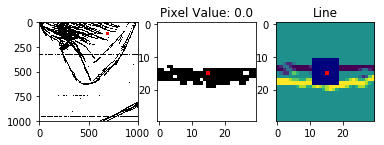

678
-1.4
1.1
-0.2999999999999998


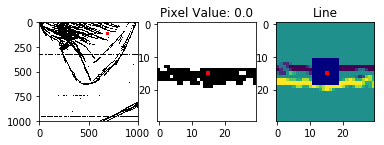

679
-1.5
1.2
-0.30000000000000004


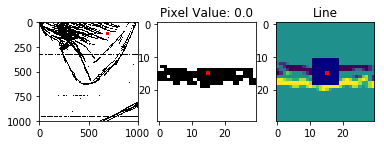

680
-1.575
1.275
-0.30000000000000004


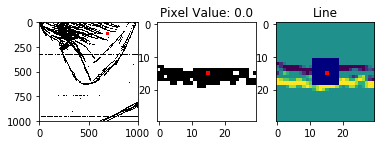

681
-1.6
1.325
-0.27500000000000013


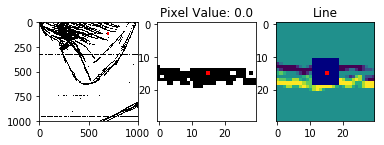

682
-1.6
1.4
-0.20000000000000018


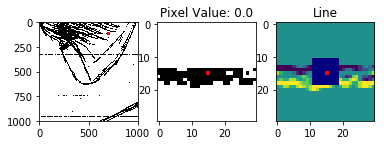

683
-1.6
1.5
-0.10000000000000009


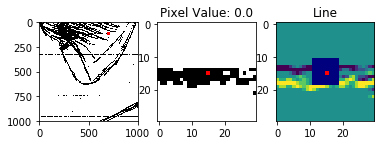

684
-1.575
1.55
-0.02499999999999991


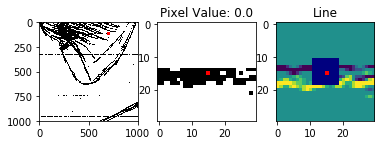

685
-1.5
1.5
0.0


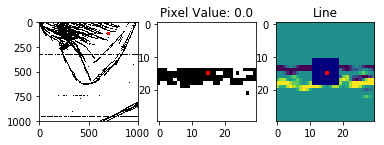

686
-1.425
1.425
0.0


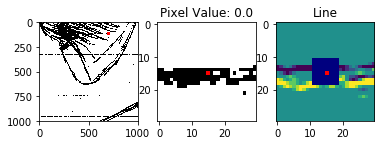

687
-1.4
1.4
0.0


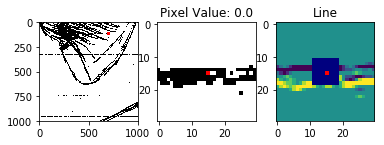

688


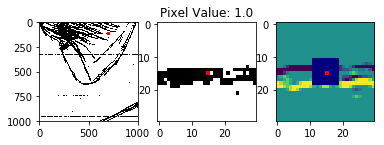

689


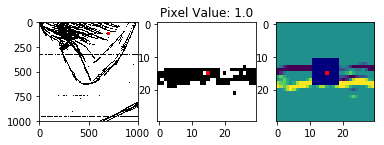

690
-1.225
1.225
0.0


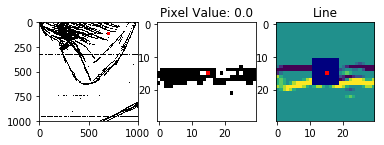

691
-1.075
1.075
0.0


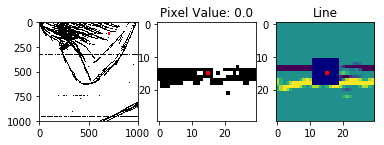

692
-0.95
0.95
0.0


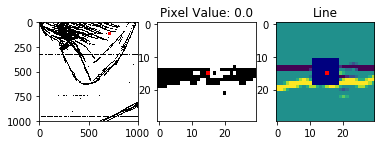

693


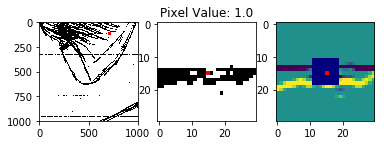

694
-0.875
0.875
0.0


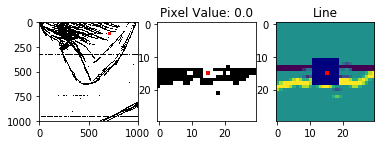

695


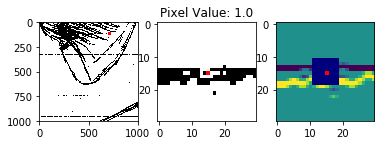

696


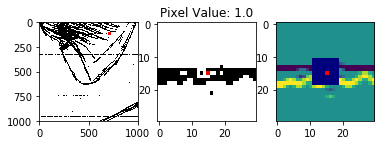

697


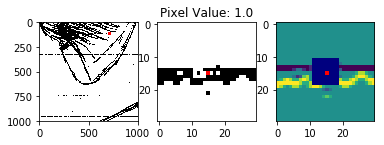

698


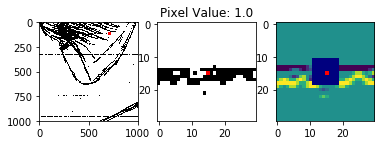

699
-1.025
1.025
0.0


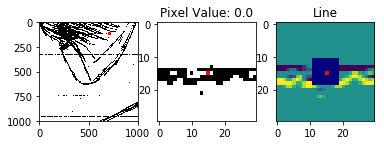

700


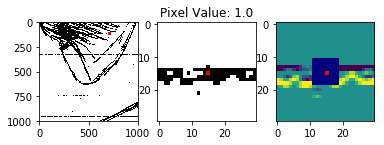

701
-1.3
1.3
0.0


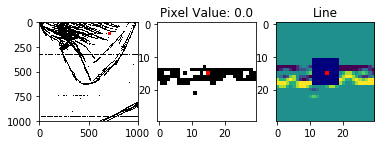

702
-1.4
1.4
0.0


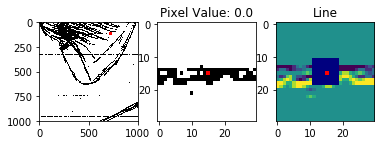

703
-1.475
1.475
0.0


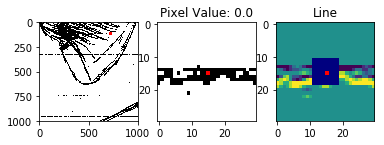

704
-1.525
1.525
0.0


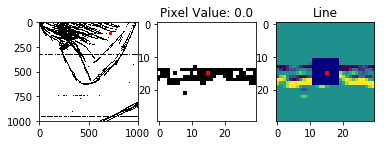

705
-1.575
1.575
0.0


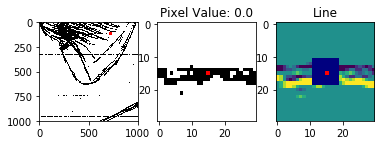

706
-1.6
1.6
0.0


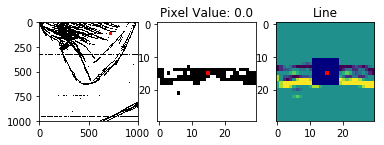

707
-1.6
1.6
0.0


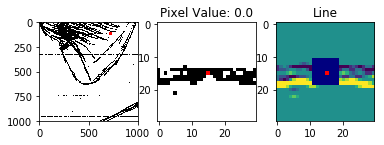

708
-1.575
1.575
0.0


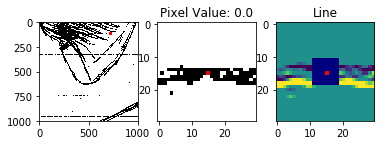

709
-1.5
1.5
0.0


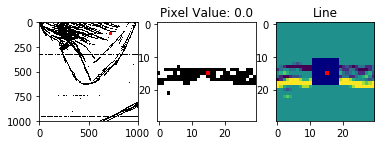

710
-1.425
1.425
0.0


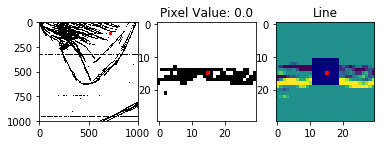

711
-1.375
1.375
0.0


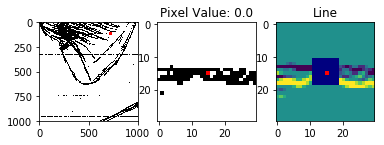

712


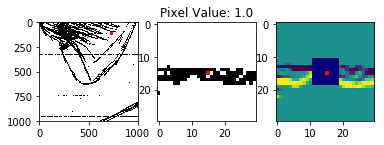

713


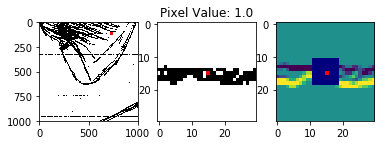

714
-1.125
1.125
0.0


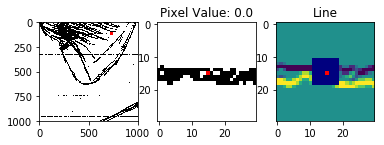

715
-1.075
1.075
0.0


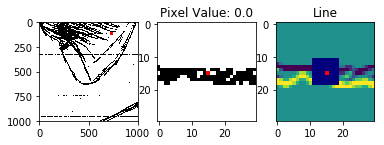

716


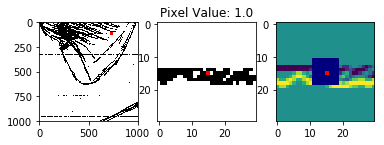

717


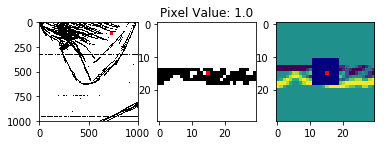

718
-1.075
1.075
0.0


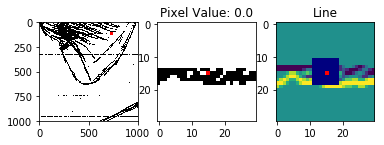

719
-1.075
1.075
0.0


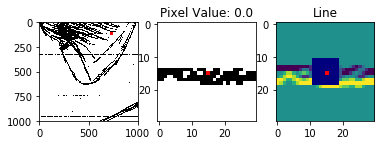

720
-1.025
1.025
0.0


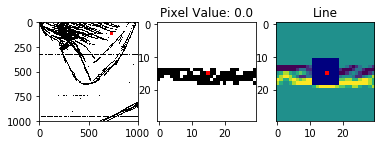

721
-1.0
1.0
0.0


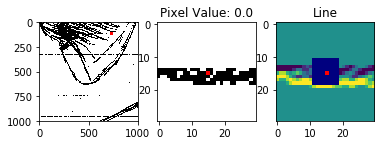

722
-0.975
0.975
0.0


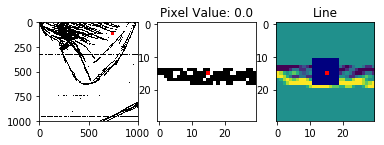

723


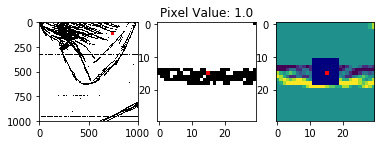

724
-1.0
1.0
0.0


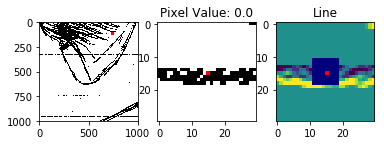

725
-1.05
1.05
0.0


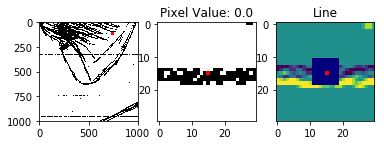

726
-0.975
0.975
0.0


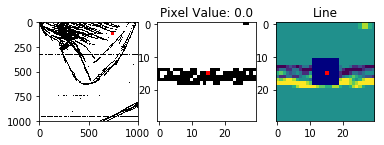

727
-0.875
0.875
0.0


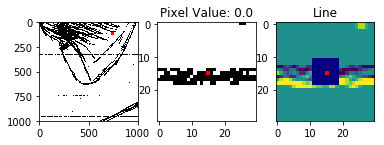

728
-0.875
0.875
0.0


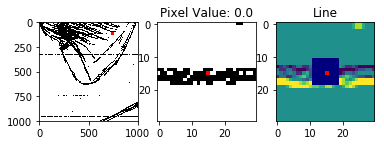

729


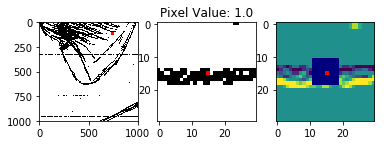

730


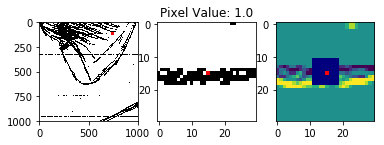

731
-0.975
0.975
0.0


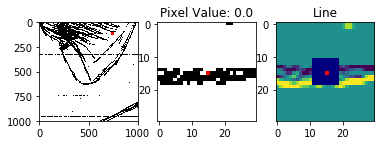

732
-0.975
0.975
0.0


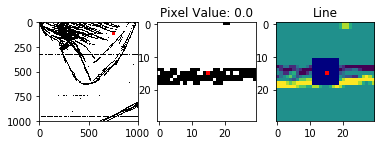

733
-0.95
0.95
0.0


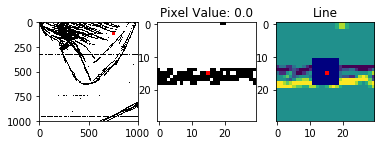

734
-1.0
1.0
0.0


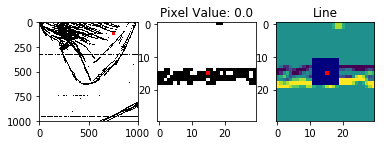

735
-1.1
1.1
0.0


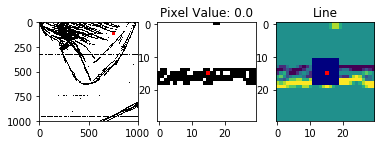

736
-1.175
1.175
0.0


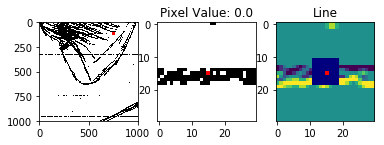

737
-1.2
1.2
0.0


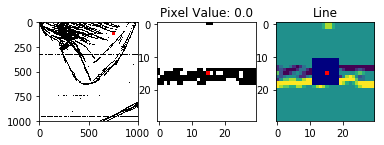

738


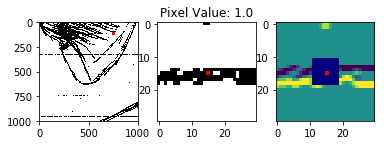

739
-1.2
1.2
0.0


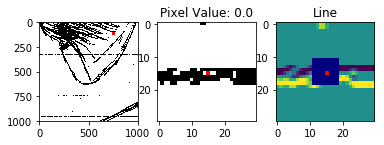

740


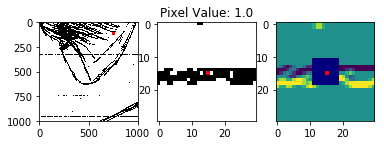

741


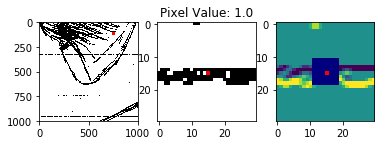

742
-1.325
1.325
0.0


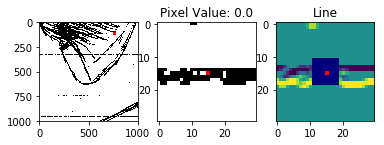

743
-1.35
1.35
0.0


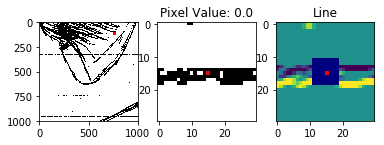

744
-1.35
1.35
0.0


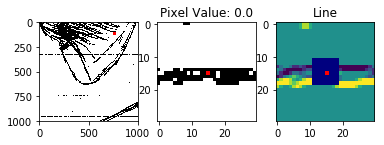

745
-1.4
1.4
0.0


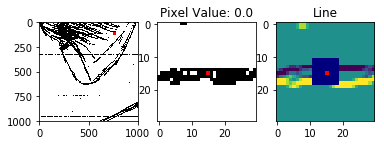

746
-1.475
1.475
0.0


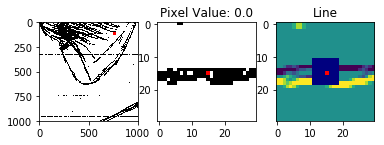

747


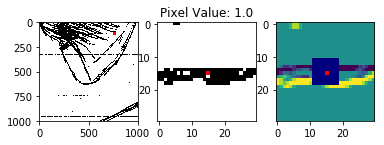

748
-1.5
1.5
0.0


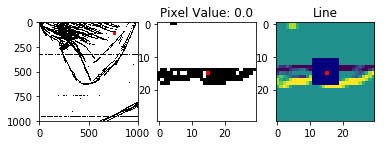

749
-1.5
1.5
0.0


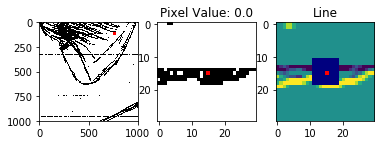

750
-1.5
1.5
0.0


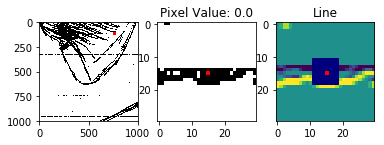

751
-1.525
1.525
0.0


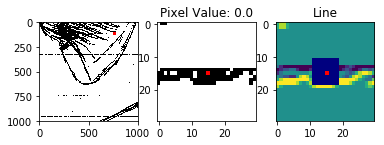

752
-1.575
1.575
0.0


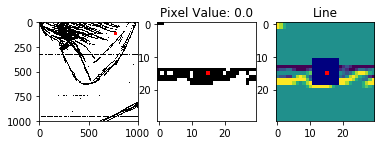

753
-1.575
1.575
0.0


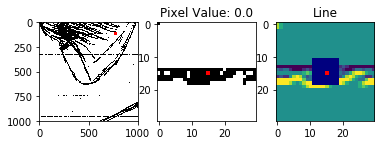

754
-1.5
1.5
0.0


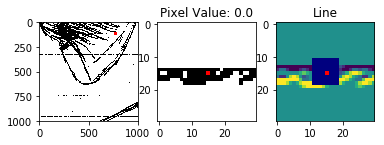

755
-1.425
1.425
0.0


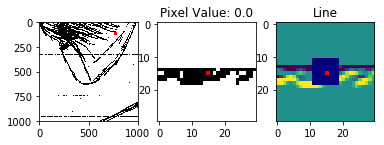

756
-1.4
1.4
0.0


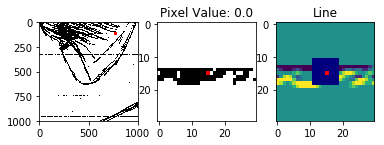

757


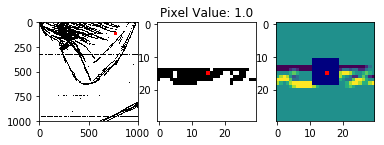

758
-1.375
1.375
0.0


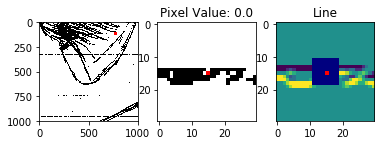

759
-1.3
1.3
0.0


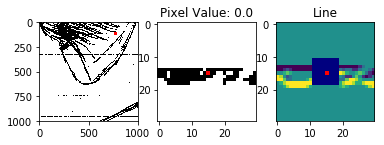

760
-1.225
1.225
0.0


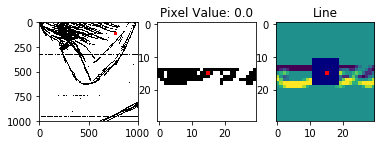

761
-1.2
1.2
0.0


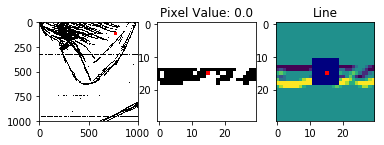

762


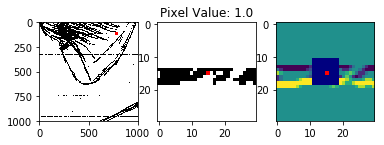

763


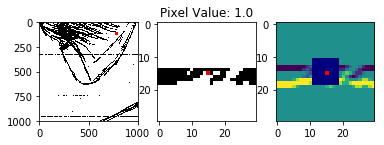

764
-1.2
1.2
0.0


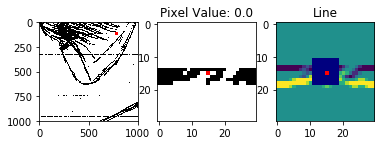

765


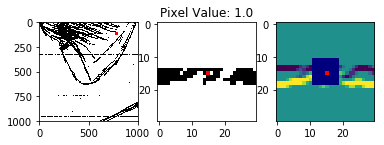

766


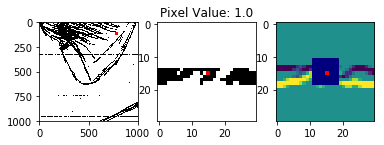

767
-1.0
1.0
0.0


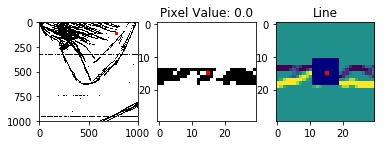

768
-0.875
0.875
0.0


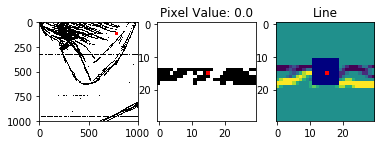

769


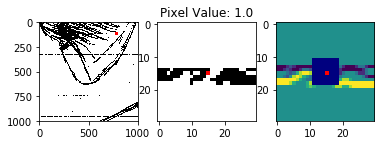

770


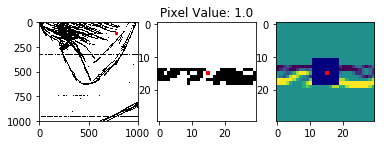

771


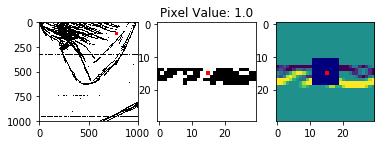

772


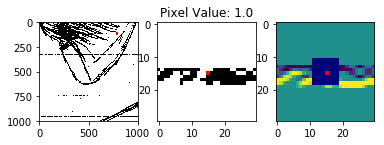

773
-0.825
0.825
0.0


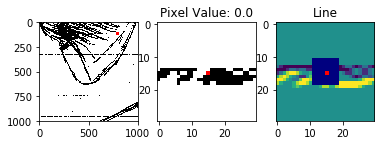

774
-0.925
0.925
0.0


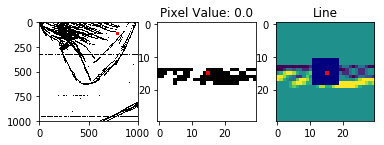

775
-1.075
1.075
0.0


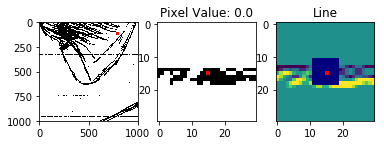

776
-1.2
1.2
0.0


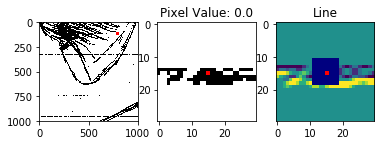

777
-1.275
1.275
0.0


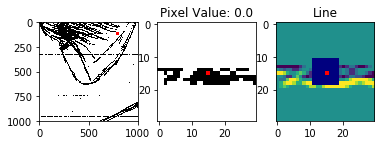

778
-1.275
1.275
0.0


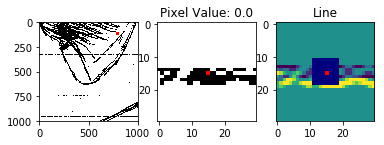

779
-1.2
1.2
0.0


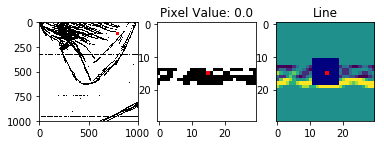

780
-1.1
1.1
0.0


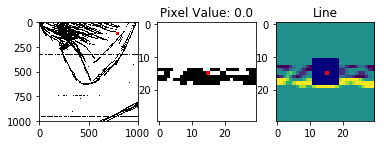

781


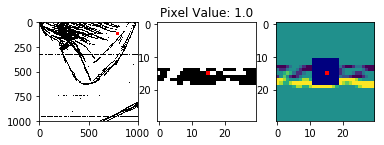

782


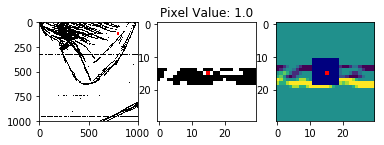

783


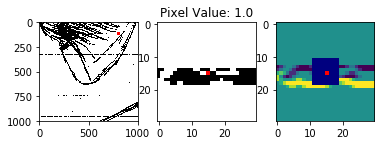

784
-0.8
0.8
0.0


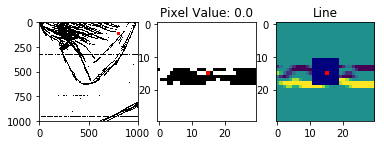

785
-0.8
0.8
0.0


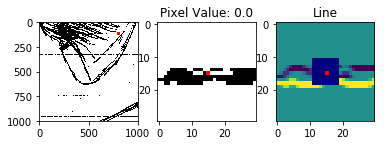

786


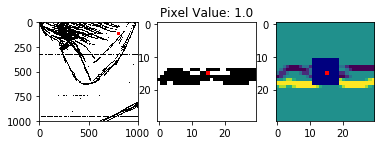

787


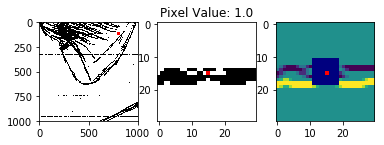

788


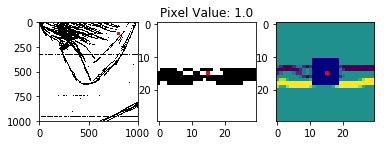

789


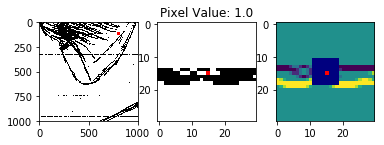

790


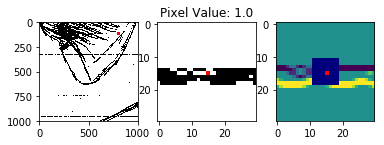

791


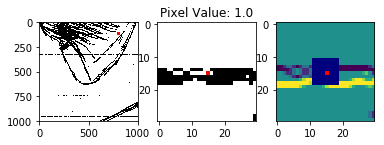

792


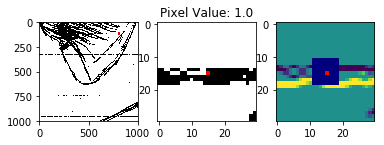

793
-1.0
1.0
0.0


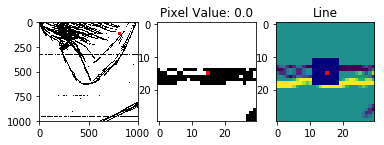

794
-1.125
1.125
0.0


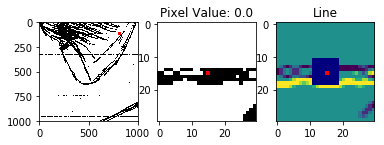

795
-1.3
1.3
0.0


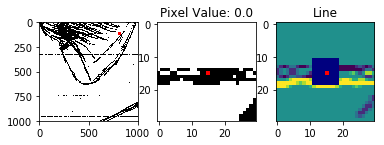

796
-1.475
1.475
0.0


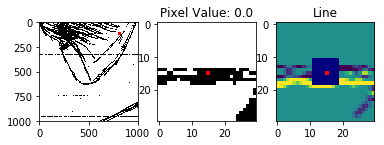

797
-1.575
1.575
0.0


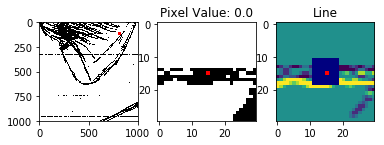

798
-1.6
1.6
0.0


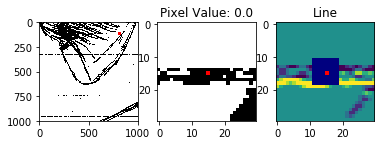

799
-1.6
1.6
0.0


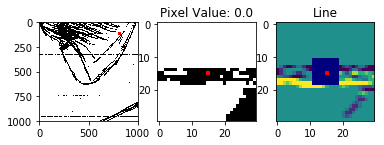

800
-1.6
1.6
0.0


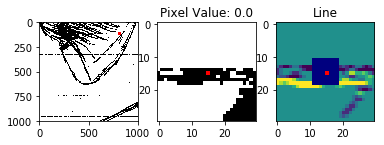

801
-1.575
1.575
0.0


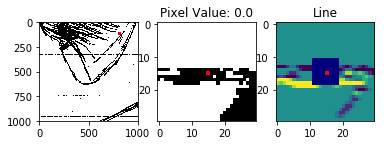

802
-1.525
1.525
0.0


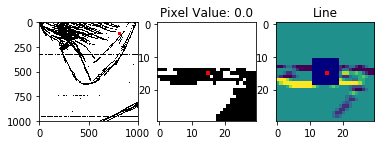

803
-1.475
1.475
0.0


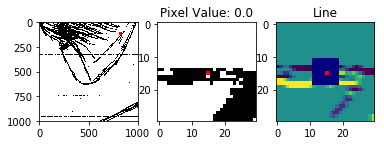

804
-1.4
1.4
0.0


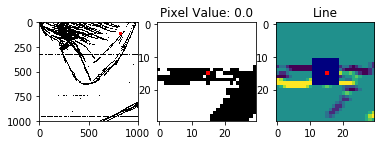

805
-1.3
1.3
0.0


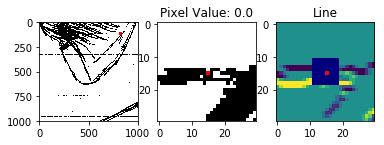

806
-1.2
1.175
-0.02499999999999991


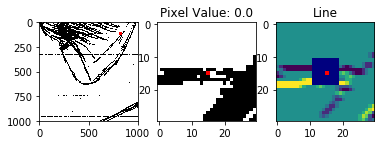

807


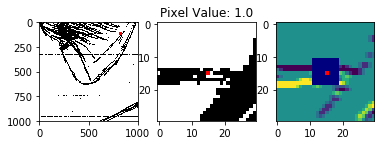

808


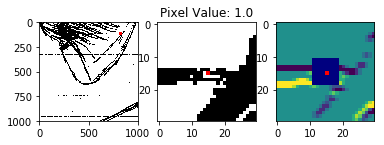

809
-1.125
0.825
-0.30000000000000004


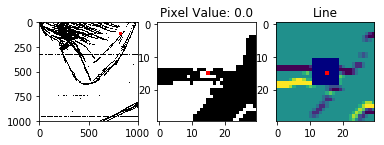

810
-1.15
0.725
-0.42499999999999993


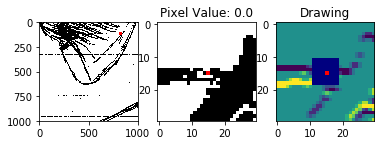

811
-1.125
0.525
-0.6


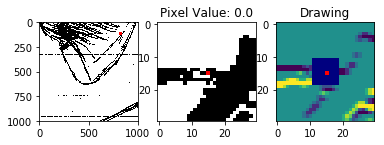

812
-1.1
0.3
-0.8


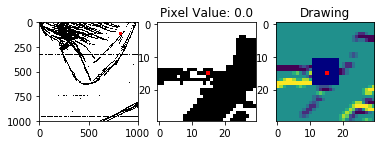

813
-1.1
0.1
-1.0


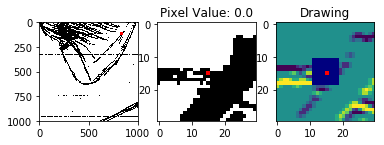

814
-1.125
-0.05
-1.175


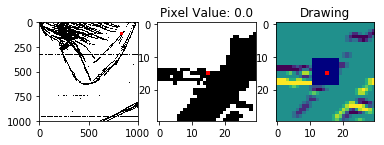

815
-1.175
-0.125
-1.3


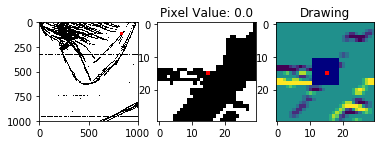

816
-1.175
-0.2
-1.375


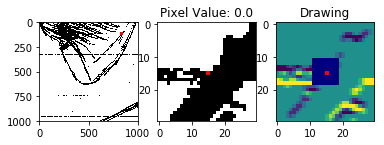

817
-1.075
-0.3
-1.375


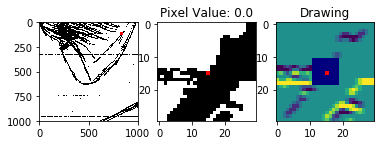

818
-0.925
-0.35
-1.275


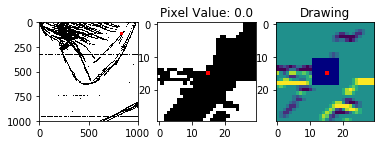

819
-0.8
-0.3
-1.1


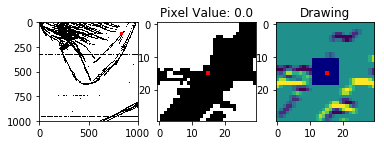

820
-0.7
-0.2
-0.8999999999999999


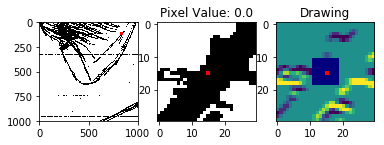

821
-0.6
-0.1
-0.7


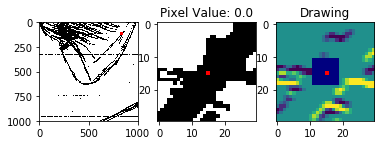

822
-0.475
0.0
-0.475


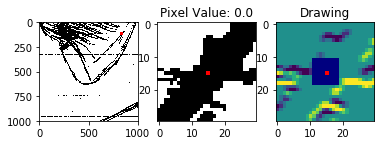

823
-0.3
0.125
-0.175


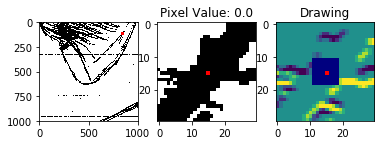

824
-0.125
0.3
0.175


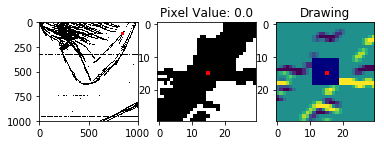

825
-0.025
0.5
0.475


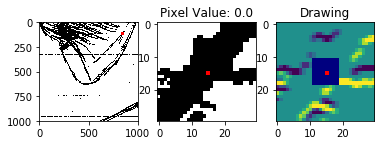

826
0.0
0.7
0.7


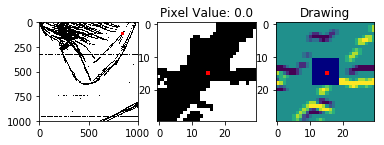

827
0.0
0.9
0.9


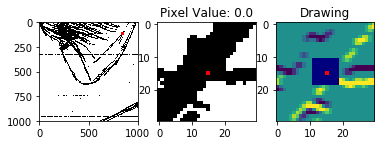

828
0.0
1.1
1.1


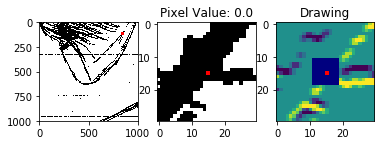

829
0.025
1.275
1.2999999999999998


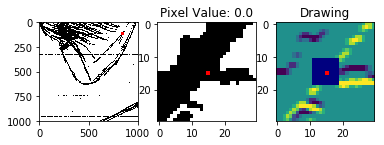

830
0.075
1.375
1.45


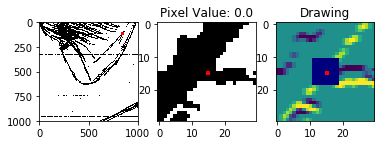

831
0.05
1.4
1.45


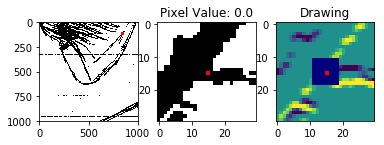

832
-0.1
1.4
1.2999999999999998


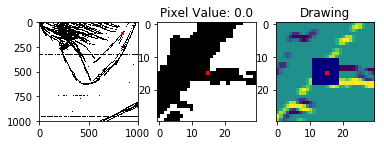

833
-0.3
1.4
1.0999999999999999


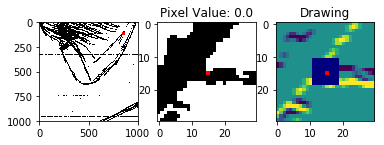

834
-0.5
1.4
0.8999999999999999


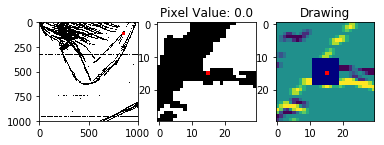

835
-0.7
1.4
0.7


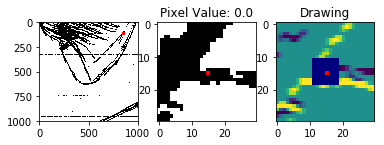

836
-0.9
1.4
0.4999999999999999


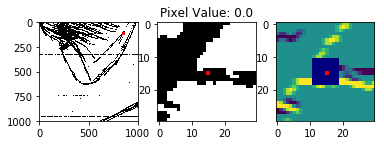

837
-1.125
1.425
0.30000000000000004


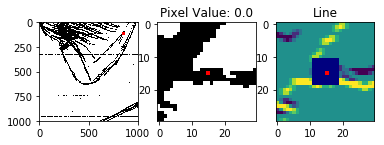

838
-1.325
1.45
0.125


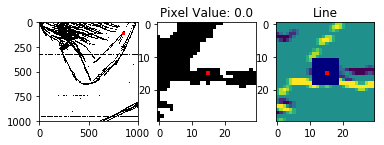

839
-1.35
1.375
0.02499999999999991


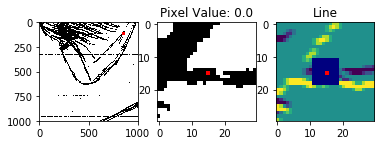

840
-1.225
1.225
0.0


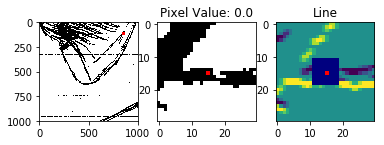

841
-1.1
1.1
0.0


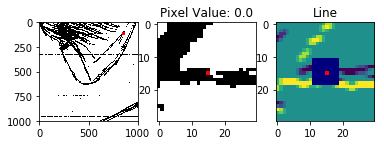

842


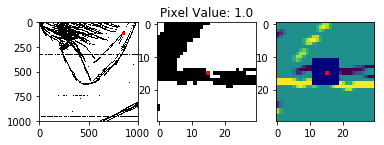

843


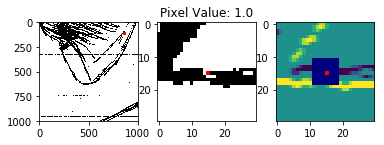

844
-0.8
0.775
-0.025000000000000022


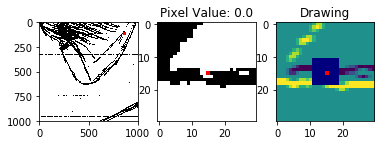

845
-0.7
0.6
-0.09999999999999998


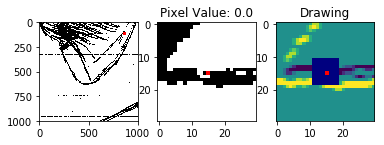

846
-0.65
0.475
-0.17500000000000004


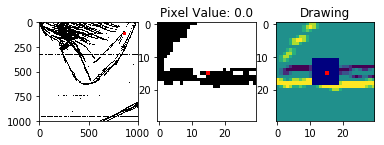

847
-0.725
0.525
-0.19999999999999996


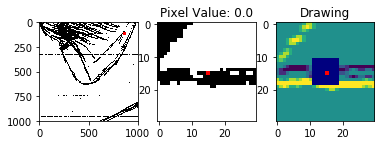

848
-0.85
0.65
-0.19999999999999996


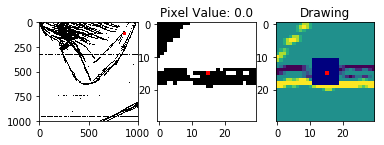

849
-0.925
0.725
-0.20000000000000007


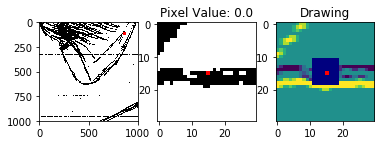

850
-0.975
0.775
-0.19999999999999996


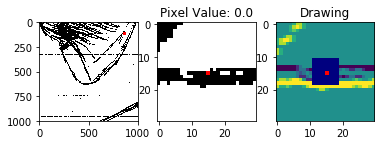

851
-1.0
0.8
-0.19999999999999996


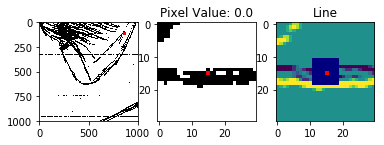

852
-1.0
0.825
-0.17500000000000004


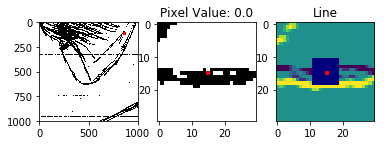

853
-1.025
0.925
-0.09999999999999987


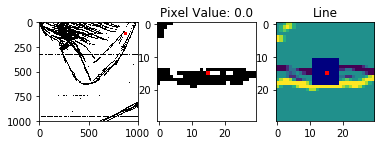

854


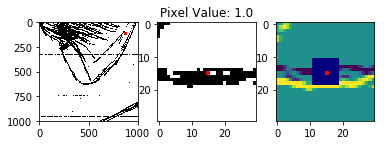

855


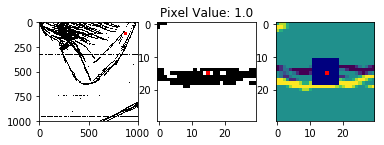

856


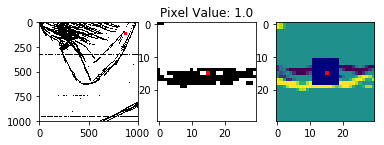

857
-1.1
1.1
0.0


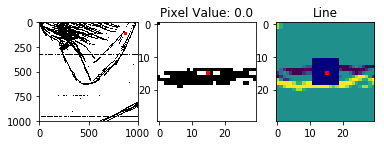

858
-1.125
1.125
0.0


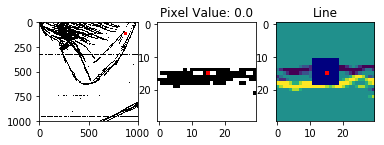

859


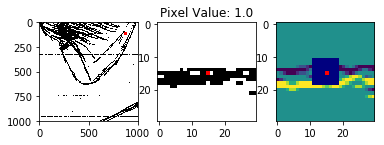

860


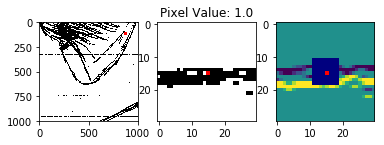

861
-1.35
1.35
0.0


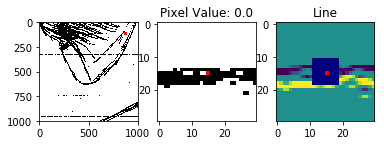

862
-1.3
1.3
0.0


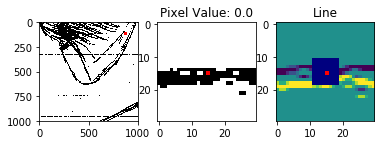

863
-1.225
1.225
0.0


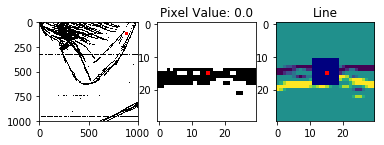

864
-1.225
1.225
0.0


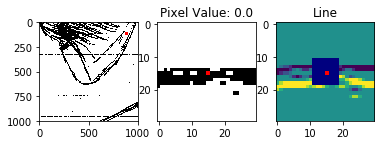

865
-1.275
1.275
0.0


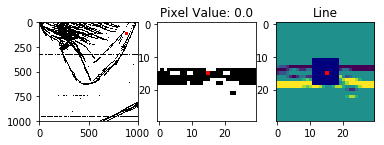

866
-1.275
1.275
0.0


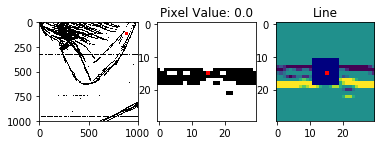

867
-1.2
1.2
0.0


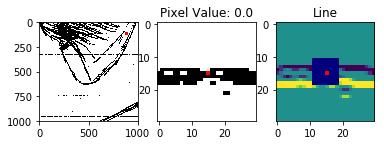

868
-1.125
1.125
0.0


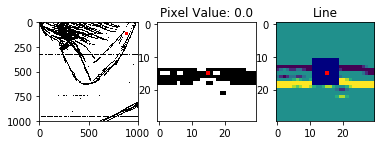

869
-1.125
1.125
0.0


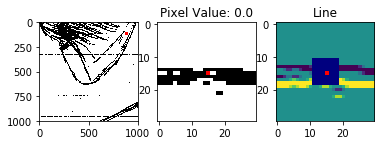

870


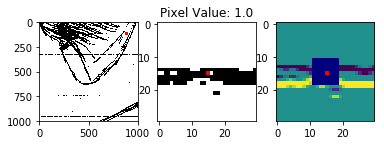

871


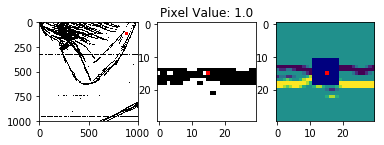

872
-1.375
1.375
0.0


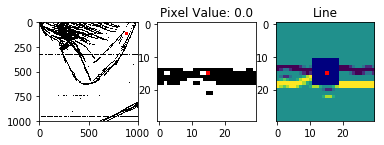

873
-1.4
1.4
0.0


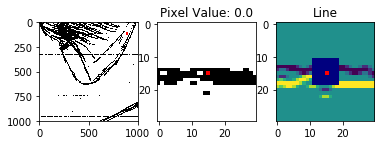

874
-1.425
1.425
0.0


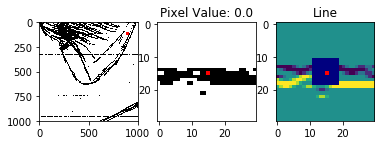

875
-1.5
1.5
0.0


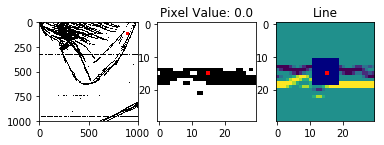

876
-1.55
1.55
0.0


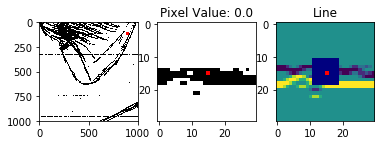

877
-1.5
1.5
0.0


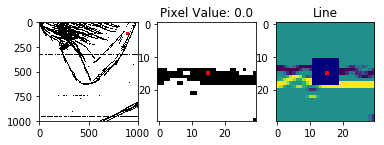

878
-1.4
1.4
0.0


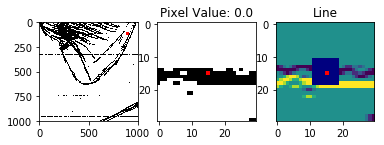

879
-1.3
1.3
0.0


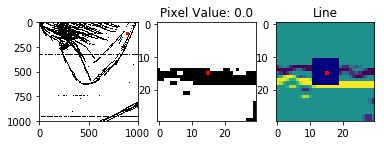

880
-1.225
1.225
0.0


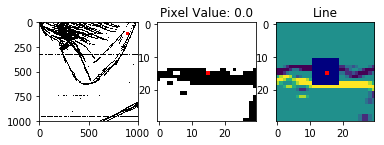

881
-1.2
1.2
0.0


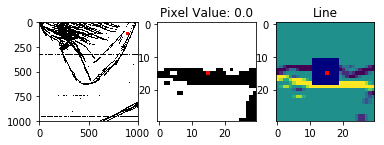

882
-1.175
1.175
0.0


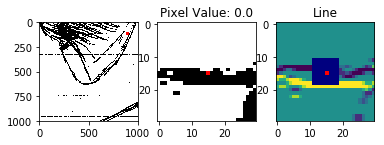

883
-1.075
1.075
0.0


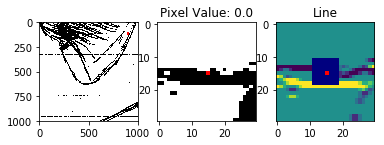

884
-0.95
0.95
0.0


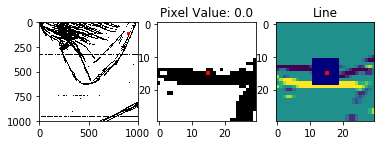

885
-0.875
0.875
0.0


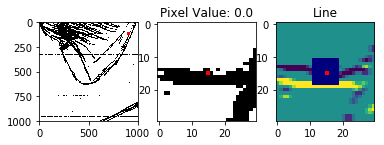

886
-0.8
0.8
0.0


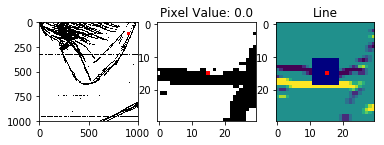

887


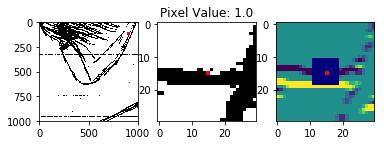

888


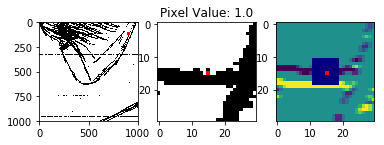

889


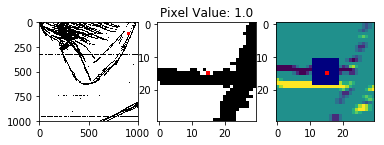

890


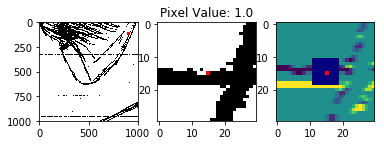

891
-0.625
0.525
-0.09999999999999998


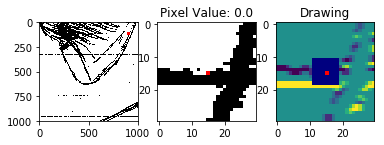

892
-0.75
0.55
-0.19999999999999996


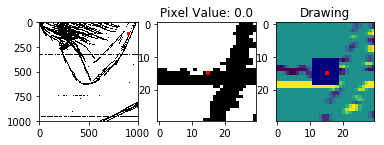

893
-0.825
0.5
-0.32499999999999996


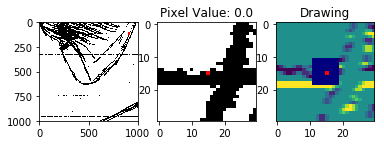

894
-0.925
0.425
-0.5


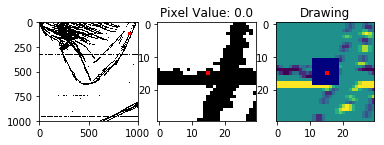

895
-1.025
0.375
-0.6499999999999999


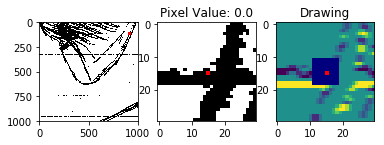

896
-1.0
0.3
-0.7


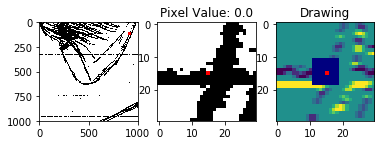

897
-0.9
0.2
-0.7


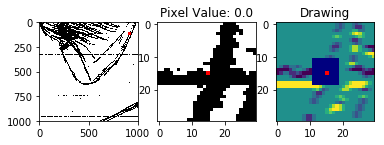

898
-0.775
0.1
-0.675


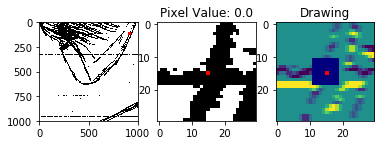

899


In [39]:
for i in range(900):
    size = 30
    row_index = 103
    col_index = i
    masked_window = np.random.random((zoom.shape[0],zoom.shape[1]))
    masked_window[row_index:row_index+size, col_index:col_index+size] = 1
    masked_window = np.ma.masked_where(masked_window != 1, masked_window)

    masked_pixel = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel[15,15] = 1
    masked_pixel = np.ma.masked_where(masked_pixel != 1, masked_pixel)

    masked_pixel1 = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel1[11:19, 11:19] = 1
    masked_pixel1 = np.ma.masked_where(masked_pixel1 != 1, masked_pixel1)

    window = zoom[row_index:row_index+size, col_index:col_index+size]
    pixel_value = window[15, 15]
    window_sobel = ndimage.sobel(window, axis=0)
    above_area = np.mean(window_sobel[10:15, 11:19])
    below_area = np.mean(window_sobel[15:20, 11:19])
    sobel_value = window_sobel[15, 15]
    # Overlay the two images
    fig, ax = plt.subplots(1, 3)
    ax.ravel()
    ax[0].imshow(zoom, cmap='gray')
    ax[0].imshow(masked_window, cmap='prism', interpolation='none')
    # ax[0].imshow(masked_pixel, cmap=cm.jet, interpolation='none')
    ax[1].imshow(window, cmap='gray')
    ax[1].imshow(masked_pixel, cmap='prism', interpolation='none')
    ax[1].set_title('Pixel Value: {}'.format(pixel_value))
    ax[2].imshow(window_sobel)
    ax[2].imshow(masked_pixel1, cmap='jet')
    ax[2].imshow(masked_pixel, cmap='prism', interpolation='none')
    if pixel_value == 0.0:
        print(above_area)
        print(below_area)
        print(above_area - -below_area)
        if np.abs(above_area) >= 0.8 and np.abs(below_area) >= 0.8:
            if np.abs(above_area - -below_area) < 0.4:
                ax[2].set_title('Line')
        else:
            if np.abs(above_area) >= 0.1 and np.abs(below_area) >= 0.1: 
                if np.abs(above_area - -below_area) < 0.01:
                    ax[2].set_title('Line')
                else:
                    ax[2].set_title('Drawing')
            else:
                ax[2].set_title('Drawing')
    plt.show()
    
    fig.savefig(f'savefig/{i:04}')
    print(i)

In [116]:
masked_data = np.random.random((result.shape[0],result.shape[1]))
masked_data[100:130,100:130] = 1
masked_data = np.ma.masked_where(masked_data != 1, masked_data)


In [117]:
masked_data

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=1e+20)

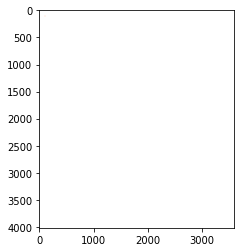

In [118]:
fig, ax = plt.subplots()
ax.imshow(masked_data, cmap='Reds')

In [13]:
binarized.shape

(4017, 3590)

In [20]:
result = np.ones((5000,5000))

In [21]:
result[:binarized.shape[0], :binarized.shape[1]] = binarized

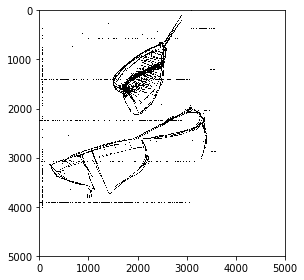

In [22]:
io.imshow(result)

In [19]:
def greyscale_images(images,  n):
    greyscale_images = []
    for i in range(n):
        try:
            image = imread(images[i], mode = 'L')
            
            greyscale_images.append(image)
        except:
            continue
    return np.array(greyscale_images)

def pad(image_list, pad_row, pad_col):
    padded_images = []
    for image in image_list:
        result = np.ones(pad_row, pad_col)
        result[:image.shape[0], :image.shape[1]] = image
        padded_images.append(result)
    return padded_images
    
    
def standardize(image_list):
    standardized_image_list = []
    for image in image_list:
        standardized_image = (image - np.min(image))/(np.max(image) - np.min(image))
        standardized_image_list.append(standardized_image)
    return np.array(standardized_image_list)

def binarize_images(images, threshold):
    binarized_images = []
    for image in images:
        binarized = 1.0 * (image > threshold)
        binarized_images.append(binarized)
    return np.array(binarized_images)

In [12]:
raw_ruled = greyscale_images(ruled, 30)

/Users/reiffd/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """


In [13]:
raw_ruled[0]

array([[199, 199, 203, ..., 200, 200, 198],
       [204, 200, 203, ..., 205, 206, 206],
       [220, 212, 209, ..., 207, 206, 205],
       ...,
       [211, 215, 218, ..., 210, 212, 215],
       [208, 212, 214, ..., 209, 212, 215],
       [210, 209, 208, ..., 201, 204, 203]], dtype=uint8)

In [14]:
standardized_rule = standardize(raw_ruled)

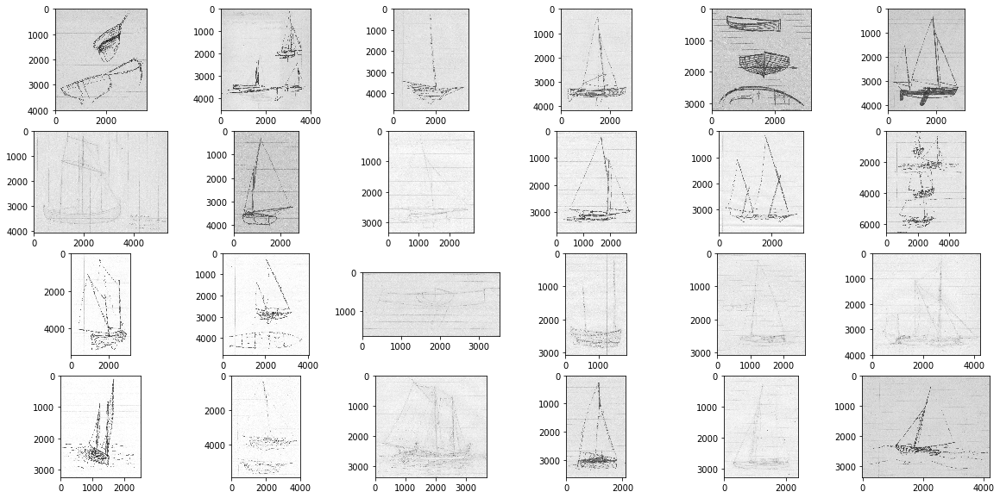

In [15]:
fig, ax = plt.subplots(4, 6, figsize = (20, 10))
for i, a in enumerate(ax.flatten()):
    a.imshow(standardized_rule[i], cmap='gray')


In [16]:
binarized_rule = binarize_images(standardized_rule, .72)

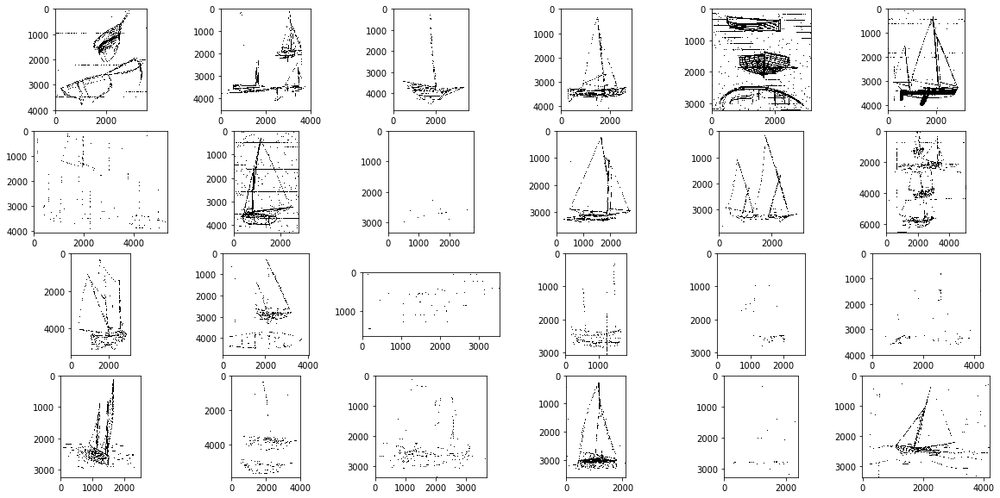

In [17]:
fig, ax = plt.subplots(4, 6, figsize = (20, 10))
for i, a in enumerate(ax.flatten()):
    a.imshow(binarized_rule[i], cmap='gray')
